Finding variable features for layer counts

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 17.7 GiB”


[1] "Transmuted!"


,orig.ident,nCount_RNA,nFeature_RNA,patient,site,timepoint,site.timepoint,tissue,patient.timepoint,patient.site,⋯,RNA_snn_res.0.8,RNA_snn_res.0.65,RNA_snn_res.0.7,RNA_snn_res.0.75,RNA_snn_res.0.9,RNA_snn_res.0.85,new.ident,new.ident2,cell_type,Tr1_Genes1
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<chr>,<dbl>
30021_lesA_pre-AAACCTGAGCCACCTG,SeuratProject,3778.400,1264,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,6,1,1,0,0,0,CD4.naive,Treg,dnT,-0.70108800
30021_lesA_pre-AAACCTGAGTACTTGC,SeuratProject,2439.354,1017,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,2,1,1,0,0,0,Treg,CD4.naive,dnT,-0.51421229
30021_lesA_pre-AAACCTGCACCTCGTT,SeuratProject,3144.359,1243,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,3,7,7,8,6,7,Treg,Treg,dnT,-0.15567763
30021_lesA_pre-AAACGGGGTACCTACA,SeuratProject,2298.424,935,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,6,1,1,0,0,0,CD4.naive,CD4.naive,dnT,-0.44807688
30021_lesA_pre-AAACGGGGTGGCGAAT,SeuratProject,1639.069,799,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,3,1,7,0,6,7,Treg,Treg,dnT,0.01840844
30021_lesA_pre-AAAGATGCAATGAATG,SeuratProject,2898.752,1218,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,0,0,0,7,1,17,CD8.TEM,CD8.TEM,CD8,-0.46442603
30021_lesA_pre-AAAGCAACACGAAATA,SeuratProject,2978.429,1205,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,3,7,7,8,6,7,Treg,Treg,dnT,-0.43331738
30021_lesA_pre-AAAGCAAGTTATCCGA,SeuratProject,3020.362,1345,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,4,4,4,4,3,3,Tfh,Tfh,dnT,-0.04211733
30021_lesA_pre-AAAGCAATCCACGTGG,SeuratProject,9465.418,2767,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,7,1,1,0,0,0,CD4.naive,RBC,CD4,-0.27567880


Warning message in rm(seurat_cd4_subset):
“object 'seurat_cd4_subset' not found”


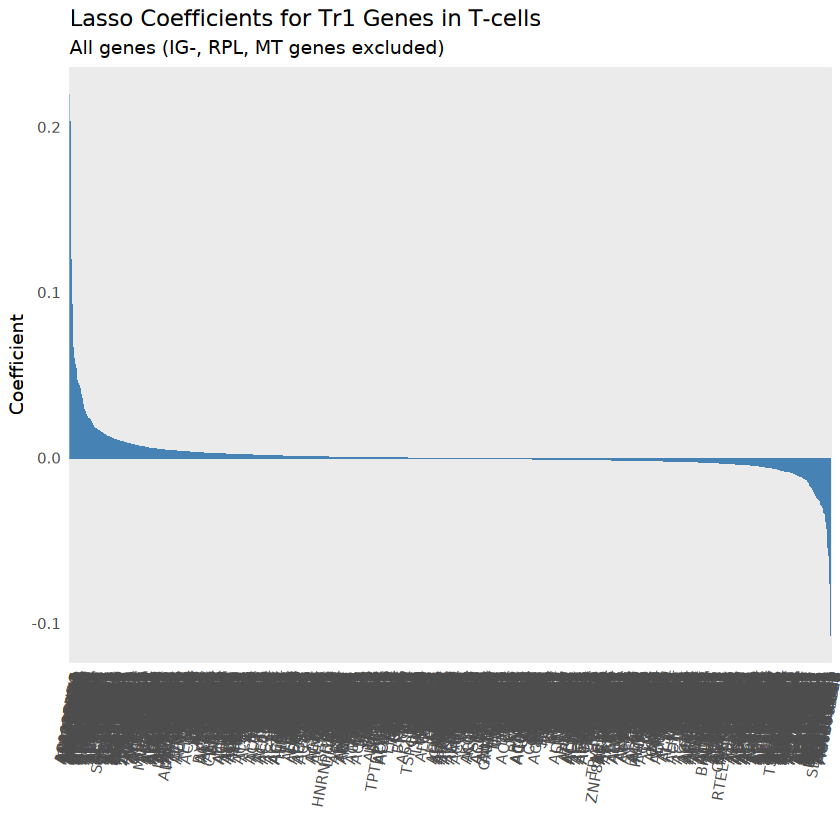

In [3]:
#LASSO REGRESSION
library(glmnet)
library(Seurat)
library(ggplot2)
library(grid)
library(dplyr)

Gene_of_interest <- list(c("MAF", "KLRB1", "NAP1L4", "CTLA4", "IKZF3", "MIR4435-2HG",
                      "TNFRSF1B", "CTSA", "IL6ST", "CKLF", "SNX6", "TBC1D4",
                      "ALOX5AP", "RNF19A", "PBXIP1", "NDUFV2"))
 

load("/home/exacloud/gscratch/ShreeLab/FabianS/Jupyter/labeled-int_tcells.Robj")
Tcells <- int_tcells
rm(int_tcells)
Tcells <- FindVariableFeatures(Tcells)
 
#variable_genes <- VariableFeatures(Tcells)
variable_genes <- VariableFeaturePlot(object = Tcells)
variable_genes <- variable_genes$data
 
#high_variable_genes_df <- subset(variable_genes$data, colors == 'yes' | mean > 1e+00)
#high_variable_genes_df <- high_variable_genes_df[!grepl("RPL|MT-", rownames(high_variable_genes_df)), ]
variable_genes_df <- variable_genes[!grepl("RPL|RPS|MT-", rownames(variable_genes)), ]
var_genes <- rownames(variable_genes_df)
 
exclude_genes <- c("MAF", "KLRB1", "NAP1L4", "CTLA4", "IKZF3", "MIR4435-2HG",
                   "TNFRSF1B", "CTSA", "IL6ST", "CKLF", "SNX6", "TBC1D4",
                   "ALOX5AP", "RNF19A", "PBXIP1", "NDUFV2")
filtered_variable_genes <- setdiff(var_genes, exclude_genes)
#filtered_variable_genes <- filtered_variable_genes[!grepl("^IG[HLK]", filtered_variable_genes)]
#filtered_variable_genes <- filtered_variable_genes[1:500]
 
Mscore <- AddModuleScore(
  object = Tcells,
  features = Gene_of_interest,
  name = 'Tr1_Genes'
)
 
x <- t(as.matrix(Tcells@assays$RNA$data[filtered_variable_genes, ]))
 
print("Transmuted!")
# Loop over each response gene
head(Mscore)
#common_cells <- rownames(x)
common_cells <- intersect(rownames(x), rownames(Mscore@meta.data))
#print(Mscore@meta.data[, gene])
#common_cells <- colnames(x)
#print(common_cells[1:10])
y <- Mscore@meta.data[common_cells, "Tr1_Genes1", drop = FALSE]
#print(y)
y <- as.numeric(y[, 1])
#print(y)
#print(unique(y))
#print(length(unique(y)))
#y <- as.matrix(Mscore@meta.data[, gene])
 
# Sanity checks
stopifnot(length(y) == nrow(x))
stopifnot(length(unique(y)) > 1)
 
cv_model <- cv.glmnet(x = x, y = y, alpha = 1)
best_lambda <- cv_model$lambda.min
 
#genes_to_keep <- setdiff(filtered_variable_genes, gene_list)
#x <- t(as.matrix(Tcells@assays$RNA$data[filtered_variable_genes, ]))
 
best_model <- glmnet(x, y, alpha = 1, lambda = best_lambda)
coef_df <- as.data.frame(as.matrix(coef(best_model)))
coef_df$Gene <- rownames(coef_df)
colnames(coef_df)[1] <- "Coefficient"
coef_df <- coef_df[coef_df$Gene != "(Intercept)", ]
coef_df <- coef_df[order(-coef_df$Coefficient), ]
 
#coef_df_filtered <- coef_df[coef_df$Coefficient != 0, ]
coef_df_filtered <- coef_df %>%
  filter(Coefficient != 0) %>%  # keep only non-zero coefficients
  filter(!grepl("^IGH|^IGK|^IGL", Gene))
 
HLA_cor_plot <- ggplot(coef_df_filtered, aes(x = reorder(Gene, -Coefficient), y = Coefficient)) +
  geom_bar(stat = "identity", fill = "steelblue") +
  labs(title = "Lasso Coefficients for Tr1 Genes in T-cells",
       x = "", y = "Coefficient", subtitle = "All genes (IG-, RPL, MT genes excluded)") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 80, hjust = 1))
print(HLA_cor_plot)
#write.csv(coef_df_filtered, "HLA_lasso_coefficients.csv", row.names = FALSE)
#file_name <- "Lasso Coefficients for MHCII Genes.jpeg"
write.csv(coef_df_filtered, "Tr1_lasso_coefficients_unfiltered.csv", row.names = FALSE)
file_name <- "Lasso Coefficients for unfiltered Tr1 Genes.jpeg"
ggsave(file_name, HLA_cor_plot, width = 100, height = 8, limitsize = FALSE)

In [1]:
#LASSO REGRESSION

library(glmnet)
library(Seurat)
library(ggplot2)
library(grid)
library(dplyr)

Gene_of_interest <- list(c('HLA-DRA','HLA-DRB5','HLA-DRB1','HLA-DQA1','HLA-DQB1','HLA-DQA2','HLA-DQB2','HLA-DPA1','HLA-DPB1'))
load("/home/exacloud/gscratch/ShreeLab/FabianS/Jupyter/labeled-bcells.Robj")
pre_bcells <- subset(bcells, timepoint == "pre")
pre_Tumor.bcells <- subset(pre_bcells, new.ident == "Tumor Bcell")

Loading required package: Matrix

Loaded glmnet 4.1-8

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




[1] 0.001400812

10 x 1 sparse Matrix of class "dgCMatrix"
                        s0
(Intercept)    2.356503445
HLA-DRA_score  0.104443255
HLA-DRB5_score 0.003193202
HLA-DRB1_score 0.073436743
HLA-DQA1_score 0.019512379
HLA-DQB1_score 0.018769901
HLA-DQA2_score 0.075386242
HLA-DQB2_score .          
HLA-DPA1_score 0.044751456
HLA-DPB1_score 0.037208131

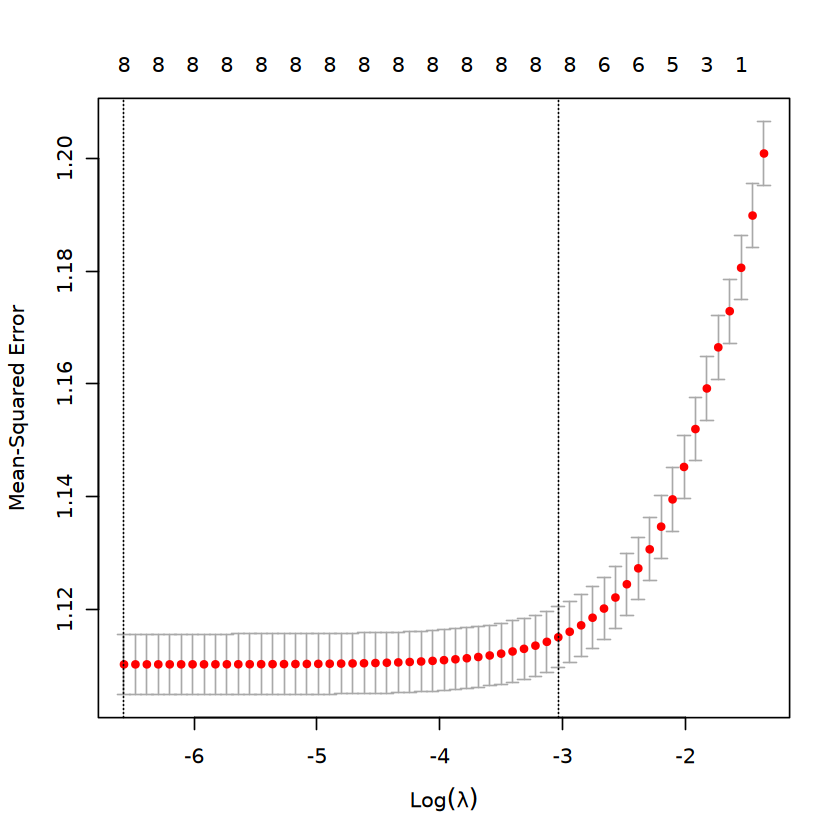

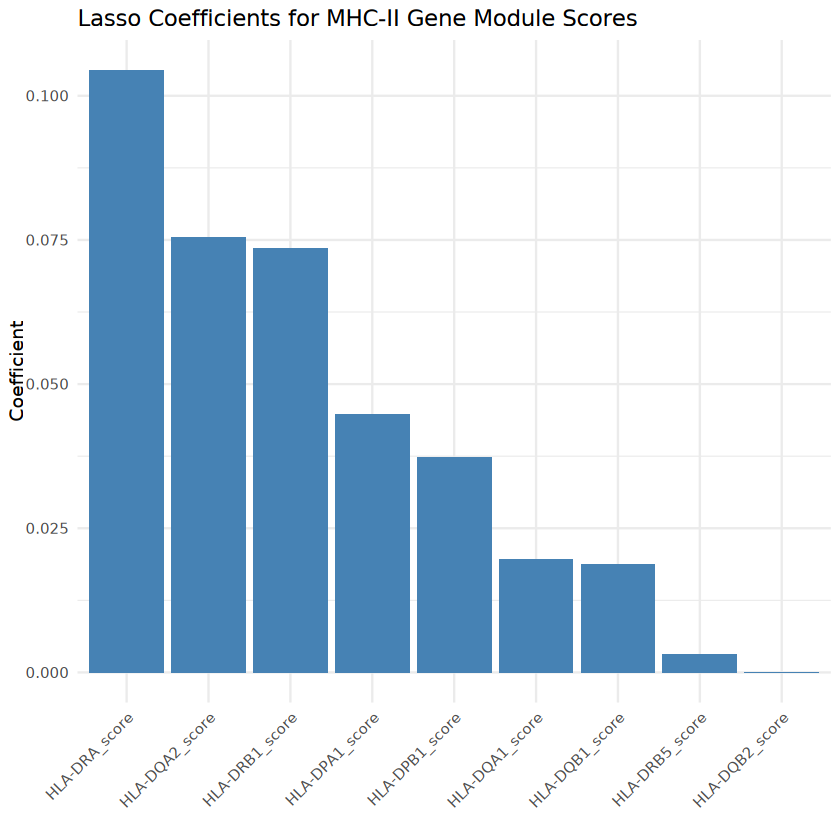

In [17]:
gene <- "MS4A1"

test <- AddModuleScore(
  object = pre_bcells,
  features = Gene_of_interest,
  name = 'MHCII_Genes'
)

colnames(test@meta.data)[(ncol(test@meta.data) - length(Gene_of_interest) + 1):ncol(test@meta.data)] <-paste0(sapply(Gene_of_interest, function(x) paste(x, collapse = "_")), "_score")

#head(x = test[])

score_cols <- paste0(sapply(Gene_of_interest, function(x) paste(x, collapse = "_")), "_score")
# Extract those scores into a matrix (rows = cells, columns = gene modules)
x <- as.matrix(test@meta.data[, score_cols])

# Choose a response gene (e.g., CD74)
y <- as.numeric(bcells@assays$RNA$data[gene,])

# Run Lasso with cross-validation
cv_model <- cv.glmnet(x = x, y = y, alpha = 1)

# Best lambda
best_lambda <- cv_model$lambda.min
best_lambda

plot(cv_model) 

best_model <- glmnet(x, y, alpha = 1, lambda = best_lambda)
coef(best_model)

# Extract coefficients and convert to data frame
coef_df <- as.data.frame(as.matrix(coef(best_model)))
coef_df$Gene <- rownames(coef_df)
colnames(coef_df)[1] <- "Coefficient"

# Remove the intercept
coef_df <- coef_df[coef_df$Gene != "(Intercept)", ]

# Order by descending coefficient value
coef_df <- coef_df[order(-coef_df$Coefficient), ]

# Load ggplot2
library(ggplot2)

# Create barplot
ggplot(coef_df, aes(x = reorder(Gene, -Coefficient), y = Coefficient)) +
  geom_bar(stat = "identity", fill = "steelblue") +
  labs(title = "Lasso Coefficients for MHC-II Gene Module Scores",
       x = "", y = "Coefficient") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

Finding variable features for layer counts



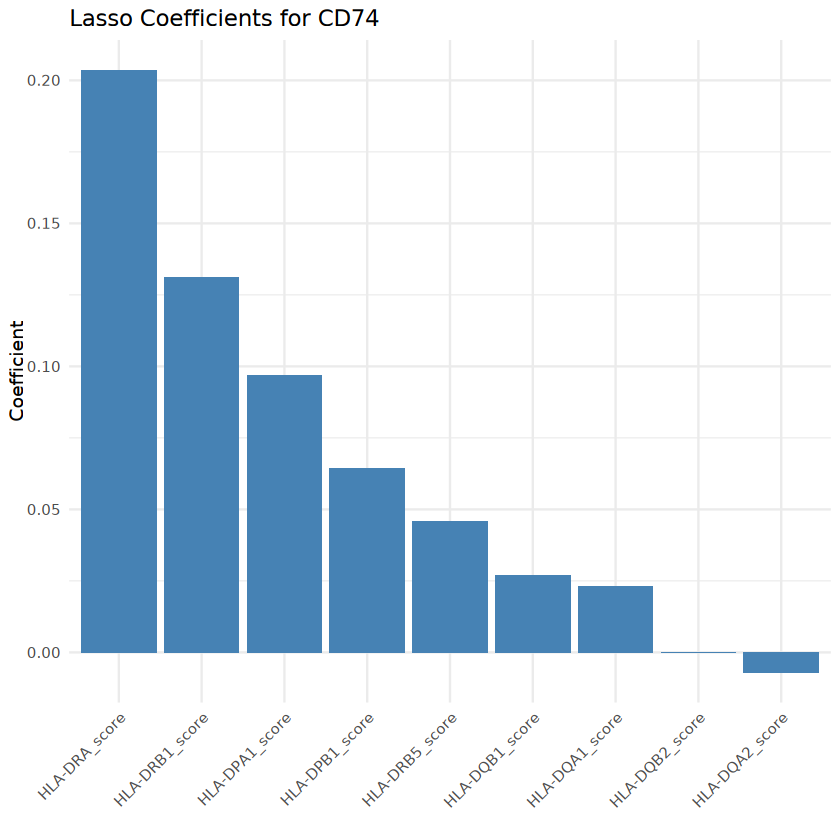

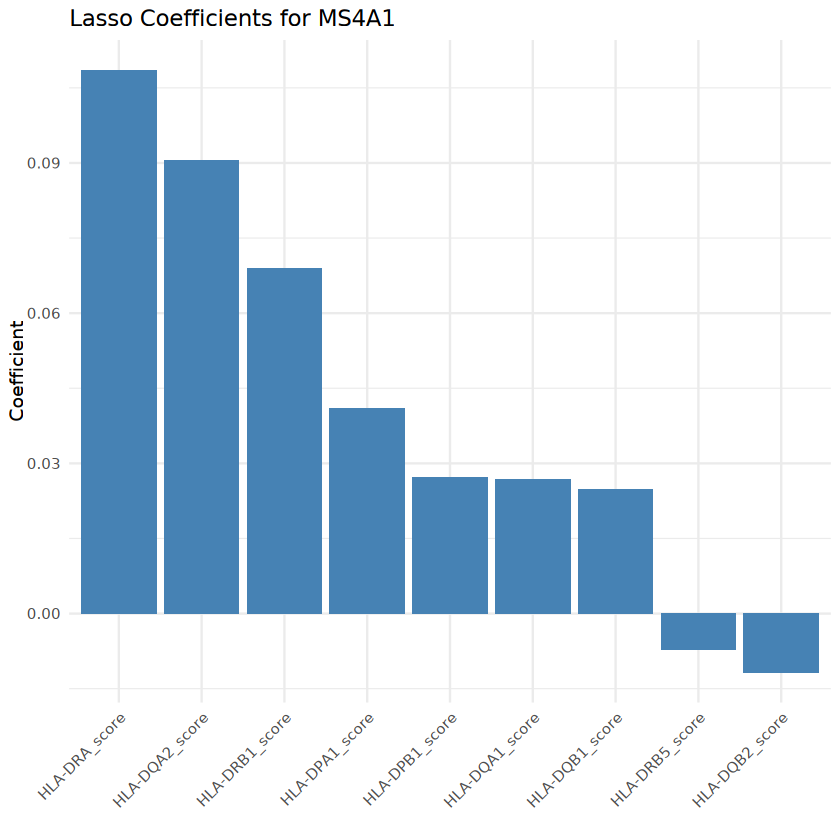

ERROR: Error in .subscript.2ary(x, i, , drop = TRUE): subscript out of bounds


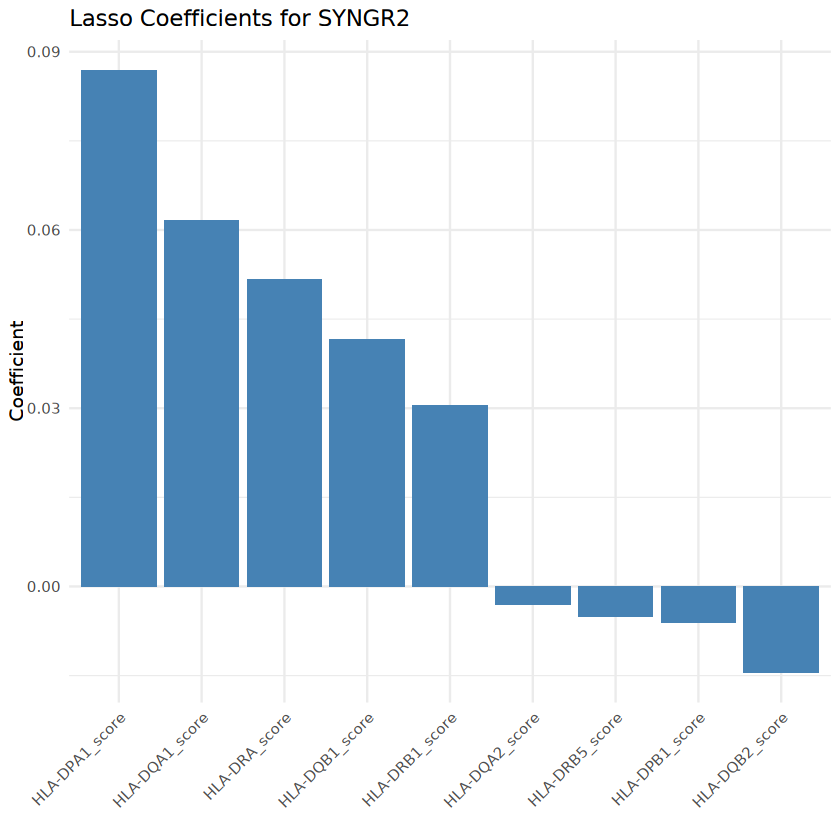

In [3]:
genes <- c("CD74", "MS4A1", "SYNGR2", "HLA-DRB1")  # List of response genes
Gene_of_interest <- c('HLA-DRA','HLA-DRB5','HLA-DRB1','HLA-DQA1','HLA-DQB1','HLA-DQA2','HLA-DQB2','HLA-DPA1','HLA-DPB1')

ModScores <- AddModuleScore(
  object = pre_bcells,
  features = Gene_of_interest,
  name = 'MHCII_Genes'
)

colnames(ModScores@meta.data)[(ncol(ModScores@meta.data) - length(Gene_of_interest) + 1):ncol(ModScores@meta.data)] <- 
  paste0(sapply(Gene_of_interest, function(x) paste(x, collapse = "_")), "_score")

score_cols <- paste0(sapply(Gene_of_interest, function(x) paste(x, collapse = "_")), "_score")

# Predictor Variable
x <- as.matrix(ModScores@meta.data[, score_cols])
# Subset out those genes from the RNA assay data
y_data <- pre_bcells@assays$RNA$data[!rownames(pre_bcells@assays$RNA$data) %in% Gene_of_interest, ]

# Loop over each response gene
for (gene in genes) {
  #Response Variable
  y <- as.numeric(y_data[gene, ])
  
  #test run to get best lambda
  cv_model <- cv.glmnet(x = x, y = y, alpha = 1)
  best_lambda <- cv_model$lambda.min
  
  #train model using best lambda
  best_model <- glmnet(x, y, alpha = 1, lambda = best_lambda)

  #get coefficient values for genes from predictor variable
  coef_df <- as.data.frame(as.matrix(coef(best_model)))
  coef_df$Gene <- rownames(coef_df)
  colnames(coef_df)[1] <- "Coefficient"
  coef_df <- coef_df[coef_df$Gene != "(Intercept)", ]
  coef_df <- coef_df[order(-coef_df$Coefficient), ]
  
  print(
    ggplot(coef_df, aes(x = reorder(Gene, -Coefficient), y = Coefficient)) +
      geom_bar(stat = "identity", fill = "steelblue") +
      labs(title = paste("Lasso Coefficients for", gene),
           x = "", y = "Coefficient") +
      theme_minimal() +
      theme(axis.text.x = element_text(angle = 45, hjust = 1))
  )
}


In [4]:
length(VariableFeatures(pre_bcells))
head(VariableFeatures(pre_bcells), 10)

variable_genes <- VariableFeatures(pre_bcells)
filtered_variable_genes <- setdiff(variable_genes, Gene_of_interest)
length(filtered_variable_genes)
filtered_variable_genes <- filtered_variable_genes[1:10]
filtered_variable_genes

[1] 2000

[1] "IGLV3-21" "HBB"      "IGHV3-64" "IGLV3-1"  "IGKV3-20" "IGKV3-11"
 [7] "IGLV5-45" "IGHV4-39" "IGKV1-39" "CCL17"

[1] 1995

[1] "IGLV3-21" "HBB"      "IGHV3-64" "IGLV3-1"  "IGKV3-20" "IGKV3-11"
 [7] "IGLV5-45" "IGHV4-39" "IGKV1-39" "CCL17"

In [5]:
Gene_of_interest <- list(c('HLA-DRA','HLA-DRB5','HLA-DRB1','HLA-DQA1','HLA-DQB1','HLA-DQA2','HLA-DQB2','HLA-DPA1','HLA-DPB1'))

[[1]]
[1] "HLA-DRA"  "HLA-DRB5" "HLA-DRB1" "HLA-DQA1" "HLA-DQB1" "HLA-DQA2" "HLA-DQB2"
[8] "HLA-DPA1" "HLA-DPB1"

[1] "HLA-DRA"  "HLA-DRB5" "HLA-DRB1" "HLA-DQA1" "HLA-DQB1" "HLA-DQA2" "HLA-DQB2"
[8] "HLA-DPA1" "HLA-DPB1"


,orig.ident,nCount_RNA,nFeature_RNA,patient,site,timepoint,site.timepoint,tissue,patient.timepoint,patient.site,⋯,RNA_snn_res.1,RNA_snn_res.0.8,RNA_snn_res.0.65,RNA_snn_res.0.7,RNA_snn_res.0.75,RNA_snn_res.0.9,RNA_snn_res.0.85,new.ident,RNA_snn_res.0.4,MHCII_Genes1
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<dbl>
30021_lesA_pre-AAACCTGAGCTGATAA,SeuratProject,4256.851,1659,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,11,5,9,9,10,11,10,Tumor Bcell,5,1.34032542
30021_lesA_pre-AAACCTGCACGGCCAT,SeuratProject,3606.476,1450,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,19,17,15,16,17,18,18,Prolif Bcell,15,-0.06547097
30021_lesA_pre-AAACCTGCAGACGCAA,SeuratProject,2944.714,1429,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,11,24,9,9,10,11,10,Tumor Bcell,5,0.11934767
30021_lesA_pre-AAACCTGGTATAATGG,SeuratProject,5253.941,2135,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,11,5,9,9,10,11,10,Tumor Bcell,5,1.72110301
30021_lesA_pre-AAACCTGGTCATGCCG,SeuratProject,2935.986,1357,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,11,5,9,9,10,11,10,Tumor Bcell,5,1.93068498
30021_lesA_pre-AAACCTGGTTCCAACA,SeuratProject,4205.668,1612,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,11,5,9,9,10,11,10,Tumor Bcell,5,1.34115507
30021_lesA_pre-AAACCTGGTTCGCTAA,SeuratProject,2153.487,1146,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,11,5,9,9,10,11,10,Tumor Bcell,5,0.22232807
30021_lesA_pre-AAACCTGTCATAGCAC,SeuratProject,3949.861,1833,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,11,2,9,18,19,11,10,Tumor Bcell,2,1.34777297
30021_lesA_pre-AAACCTGTCGGTTCGG,SeuratProject,8144.761,2597,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,11,5,9,9,10,11,10,Tumor Bcell,5,1.16248654


,orig.ident,nCount_RNA,nFeature_RNA,patient,site,timepoint,site.timepoint,tissue,patient.timepoint,patient.site,⋯,RNA_snn_res.0.4,MHCII_Genes1,MHCII_Genes2,MHCII_Genes3,MHCII_Genes4,MHCII_Genes5,MHCII_Genes6,MHCII_Genes7,MHCII_Genes8,MHCII_Genes9
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
30021_lesA_pre-AAACCTGAGCTGATAA,SeuratProject,4256.851,1659,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,5,2.219136,1.5844399,1.9034795,0.285219090,1.6560302,0.86334628,-0.10093487,1.3124666,1.8938851
30021_lesA_pre-AAACCTGCACGGCCAT,SeuratProject,3606.476,1450,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,15,1.943948,1.1979052,0.1185776,-0.975908505,-1.1252591,-1.15763022,-0.02540425,0.1176624,-0.8802048
30021_lesA_pre-AAACCTGCAGACGCAA,SeuratProject,2944.714,1429,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,5,-1.273185,0.9385301,1.2529639,0.330962801,-1.2605550,1.61512135,-0.02945152,-1.2100804,0.2041815
30021_lesA_pre-AAACCTGGTATAATGG,SeuratProject,5253.941,2135,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,5,3.338786,2.1372596,2.7656795,1.465068746,2.0998218,1.71553940,-0.13028362,1.2870122,0.5275867
30021_lesA_pre-AAACCTGGTCATGCCG,SeuratProject,2935.986,1357,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,5,3.053423,2.0214397,2.4073365,1.556004328,2.1950737,1.77647275,-0.08797912,2.8610769,1.1868054
30021_lesA_pre-AAACCTGGTTCCAACA,SeuratProject,4205.668,1612,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,5,2.857485,1.0993346,1.8060522,0.443178017,0.4725063,1.24843126,-0.06053142,1.6950631,1.8698924
30021_lesA_pre-AAACCTGGTTCGCTAA,SeuratProject,2153.487,1146,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,5,1.724874,-1.0748689,0.6211716,-1.142003819,-1.0564472,0.53686694,-0.08588516,0.5389415,1.5152778
30021_lesA_pre-AAACCTGTCATAGCAC,SeuratProject,3949.861,1833,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,2,2.576765,1.3367984,0.8701120,-0.006093881,1.8092213,1.44214943,-0.07504848,2.0435570,1.6678840
30021_lesA_pre-AAACCTGTCGGTTCGG,SeuratProject,8144.761,2597,30021,lesA,pre,lesA_pre,lymph,30021_pre,30021_lesA,⋯,5,2.492778,1.2729304,1.1288705,0.183395980,1.4161301,1.23164016,-0.08695845,1.2591559,1.1870991


[1] "Transmuted!"


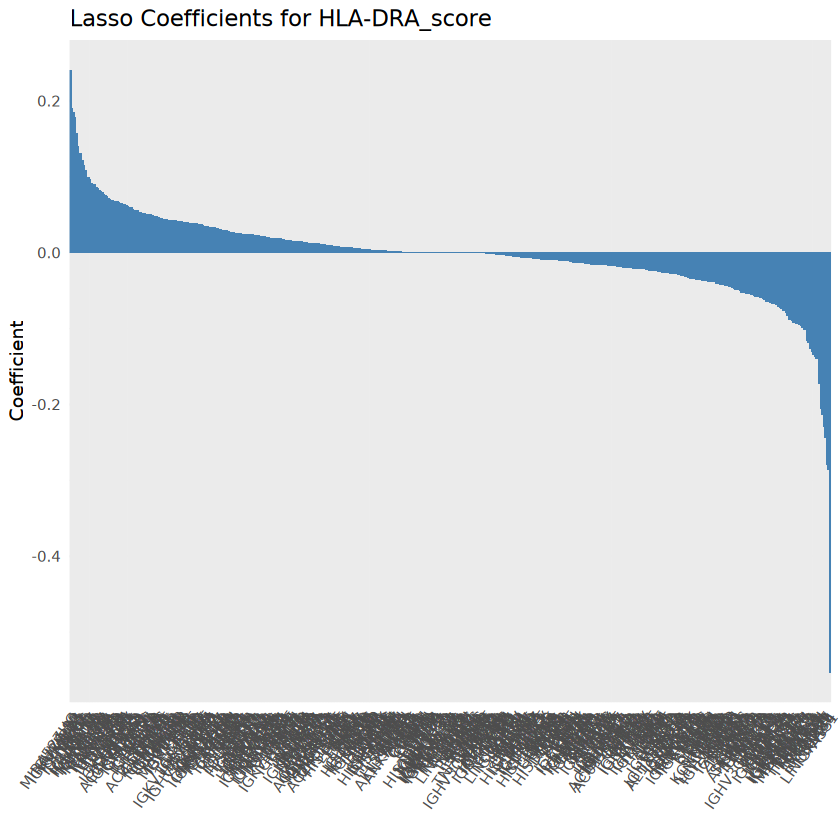

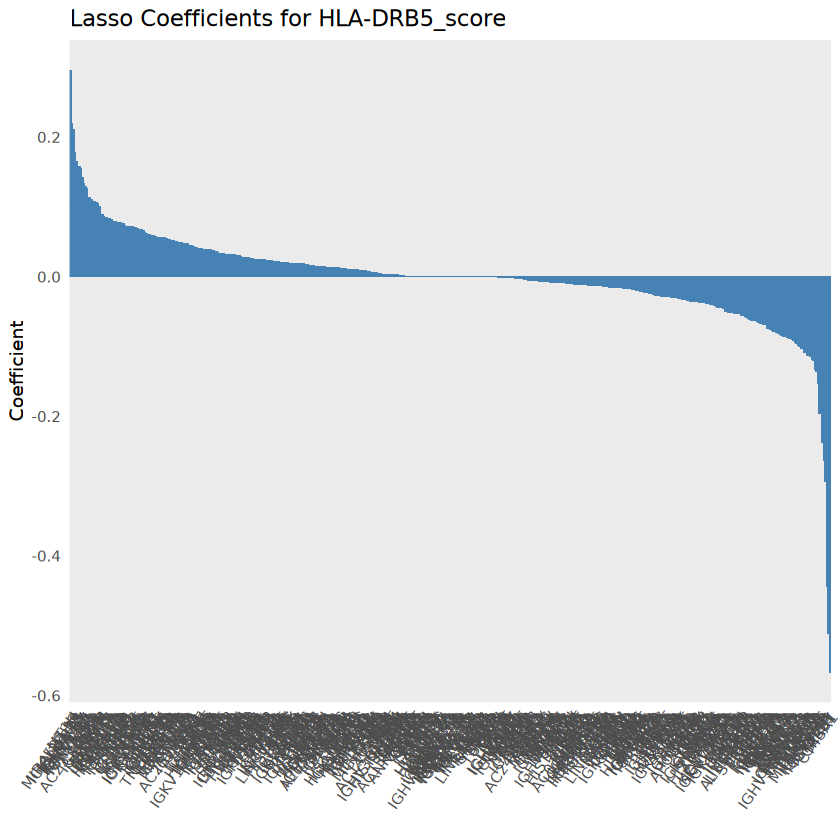

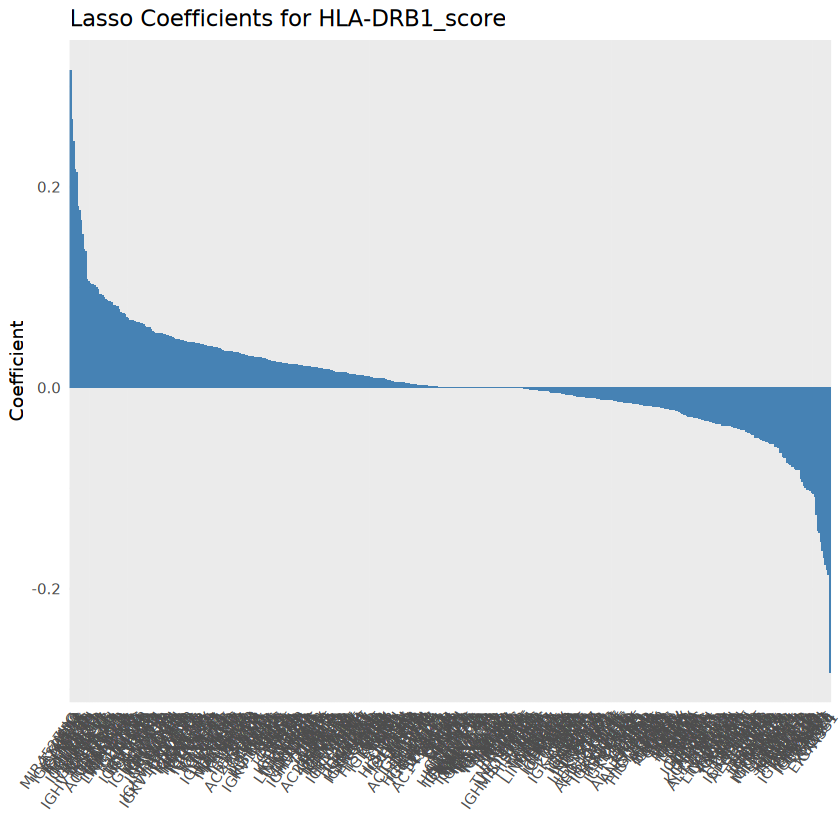

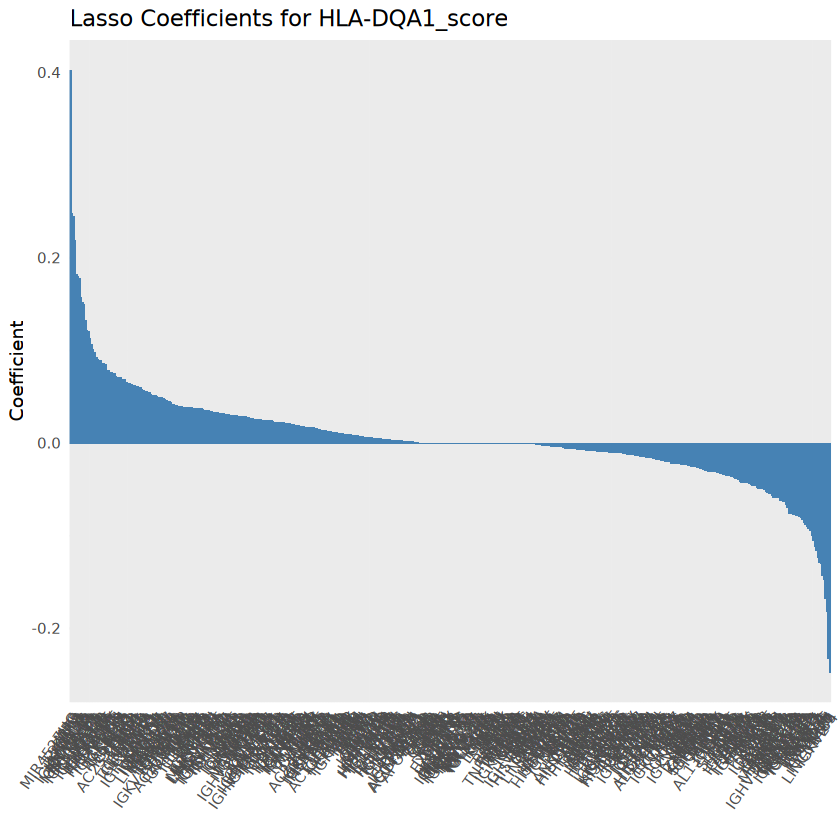

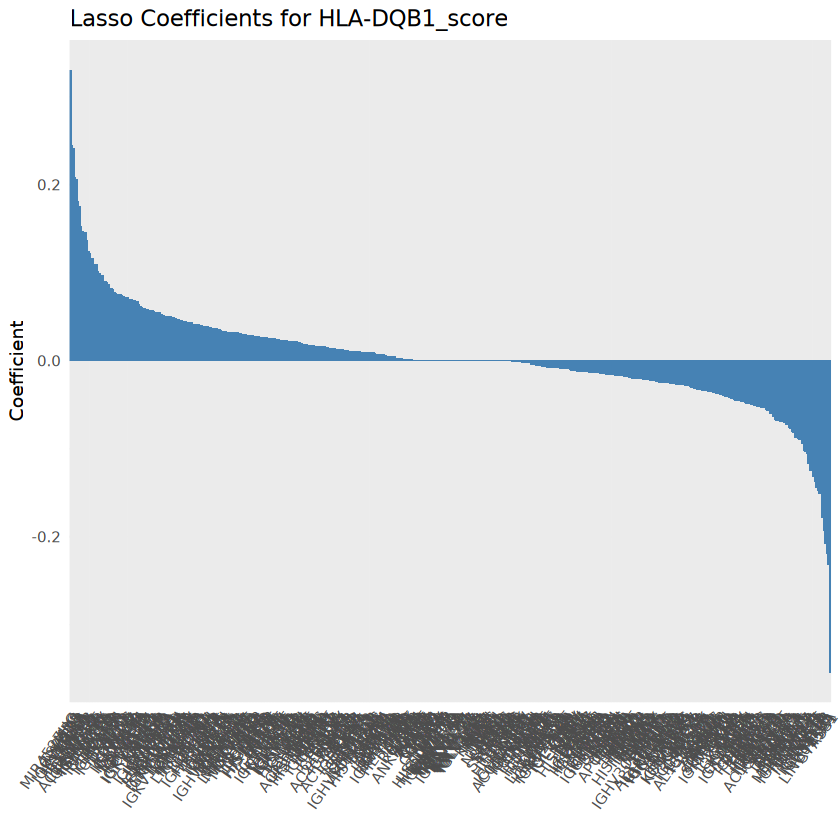

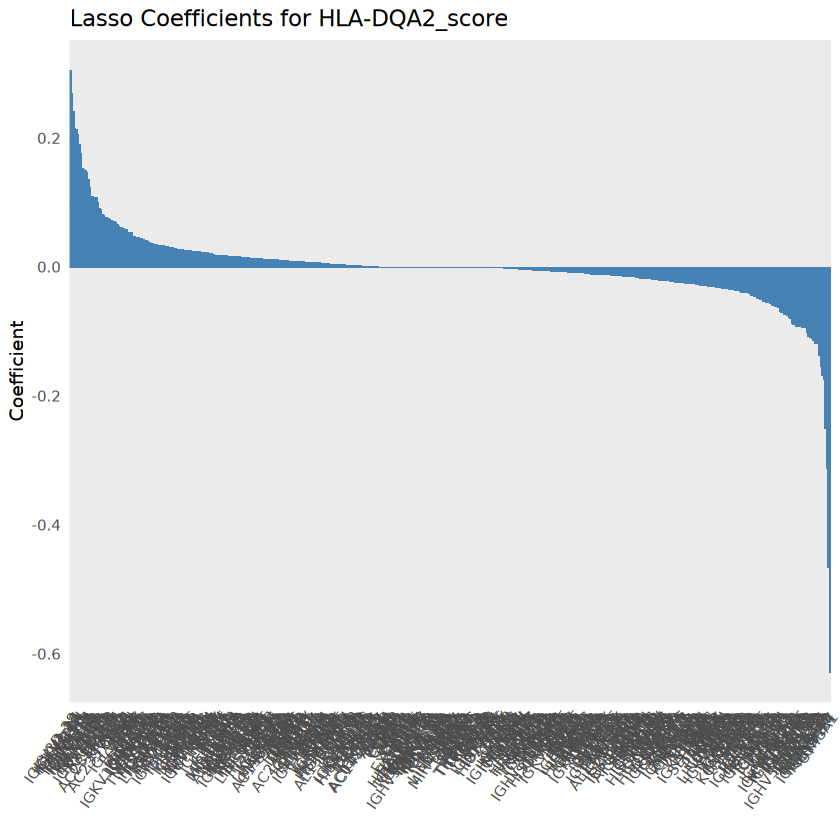

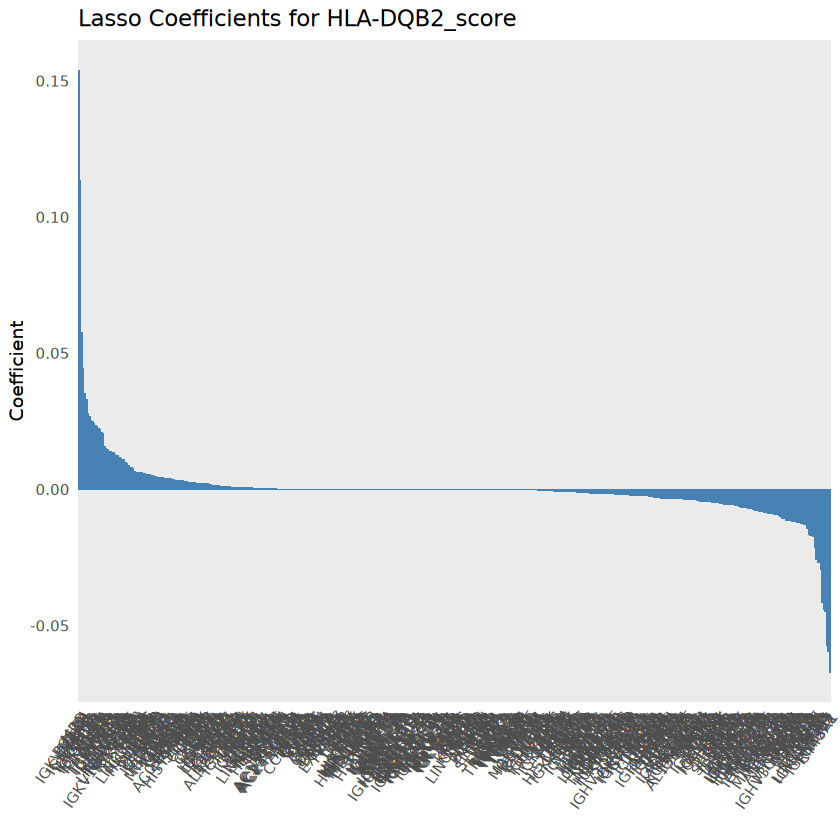

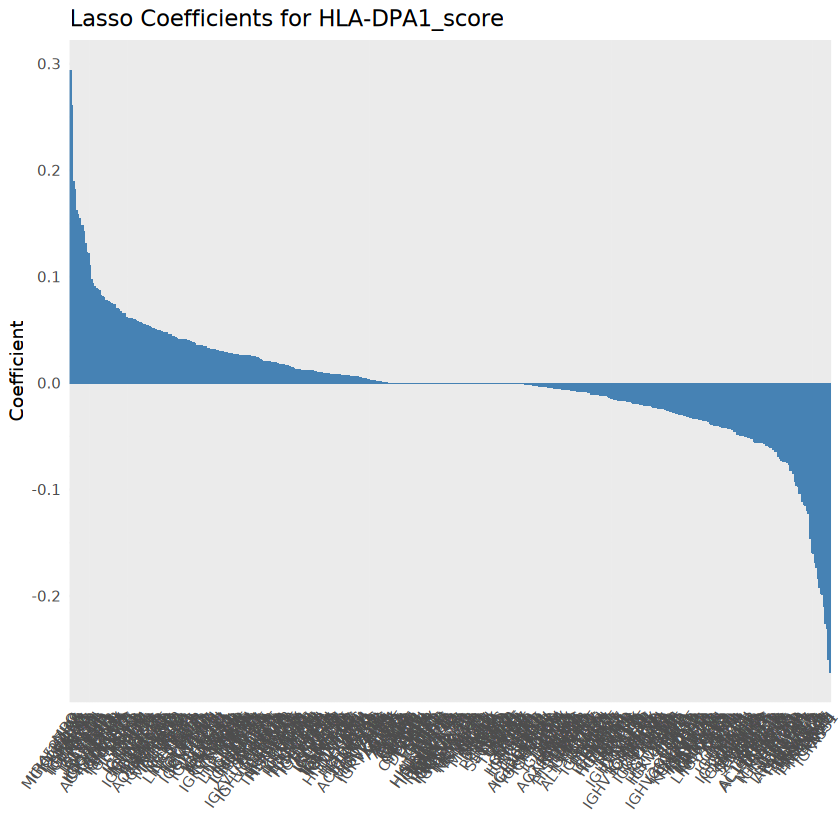

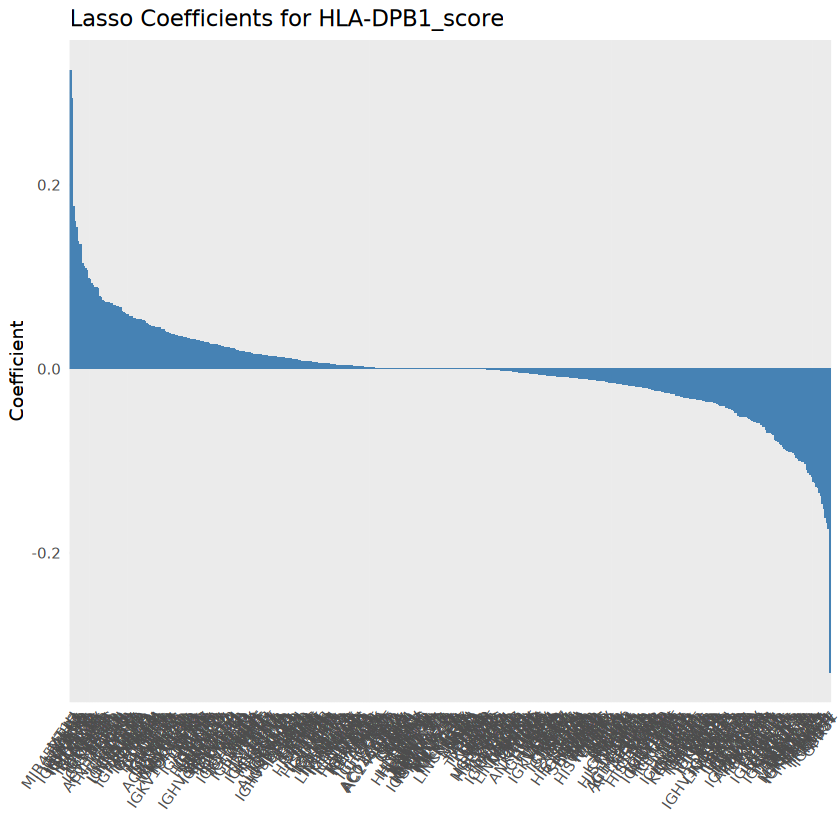

In [3]:
variable_genes <- VariableFeatures(pre_Tumor.bcells)
filtered_variable_genes <- setdiff(variable_genes, Gene_of_interest)
#filtered_variable_genes <- filtered_variable_genes[!grepl("^IG[HLK]", filtered_variable_genes)]
filtered_variable_genes <- filtered_variable_genes[1:500]

Mscore <- AddModuleScore(
  object = pre_Tumor.bcells,
  features = Gene_of_interest,
  name = 'MHCII_Genes'
)

colnames(Mscore@meta.data)[(ncol(Mscore@meta.data) - length(Gene_of_interest) + 1):ncol(Mscore@meta.data)] <- 
  paste0(sapply(Gene_of_interest, function(x) paste(x, collapse = "_")), "_score")

score_cols <- paste0(sapply(Gene_of_interest, function(x) paste(x, collapse = "_")), "_score")


#x <- as.matrix(Mscore@meta.data[, score_cols])  # Predictors stay the same
#x <- as.numeric(pre_bcells@assays$RNA$data)
#x <- as.matrix(pre_bcells@assays$RNA$data[filtered_variable_genes, ])
x <- t(as.matrix(pre_Tumor.bcells@assays$RNA$data[filtered_variable_genes, ]))
#print(colnames(Mscore@meta.data))
Gene_scores <- paste0(Gene_of_interest, "_score")
print("Transmuted!")
# Loop over each response gene
for (gene in Gene_scores) {
  #common_cells <- rownames(x)
  common_cells <- intersect(rownames(x), rownames(Mscore@meta.data))
  #print(gene)
  #print(Mscore@meta.data[, gene])
  #common_cells <- colnames(x)
  #print(common_cells[1:10])
  y <- Mscore@meta.data[common_cells, gene, drop = FALSE]
  #print(y)
  y <- as.numeric(y[, 1])
  #print(y)
  #print(unique(y))
  #print(length(unique(y)))
  #y <- as.matrix(Mscore@meta.data[, gene])
    
  # Sanity checks
  stopifnot(length(y) == nrow(x))
  stopifnot(length(unique(y)) > 1)


  cv_model <- cv.glmnet(x = x, y = y, alpha = 1)
  best_lambda <- cv_model$lambda.min
  
  best_model <- glmnet(x, y, alpha = 1, lambda = best_lambda)
  coef_df <- as.data.frame(as.matrix(coef(best_model)))
  coef_df$Gene <- rownames(coef_df)
  colnames(coef_df)[1] <- "Coefficient"
  coef_df <- coef_df[coef_df$Gene != "(Intercept)", ]
  coef_df <- coef_df[order(-coef_df$Coefficient), ]
  
  
  HLA_cor_plot <- ggplot(coef_df, aes(x = reorder(Gene, -Coefficient), y = Coefficient)) +
    geom_bar(stat = "identity", fill = "steelblue") +
    labs(title = paste("Lasso Coefficients for", gene),
          x = "", y = "Coefficient") +
    theme_minimal() +
    theme(axis.text.x = element_text(angle = 55, hjust = 1))
  print(HLA_cor_plot)
  file_name <- sprintf("Lasso Coefficients for %s 500 genes unfiltered.jpeg", gene)
  ggsave(file_name, HLA_cor_plot, width = 70, height = 8, limitsize = FALSE)
}

Finding variable features for layer counts

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 28.0 GiB”


[1] "Transmuted!"


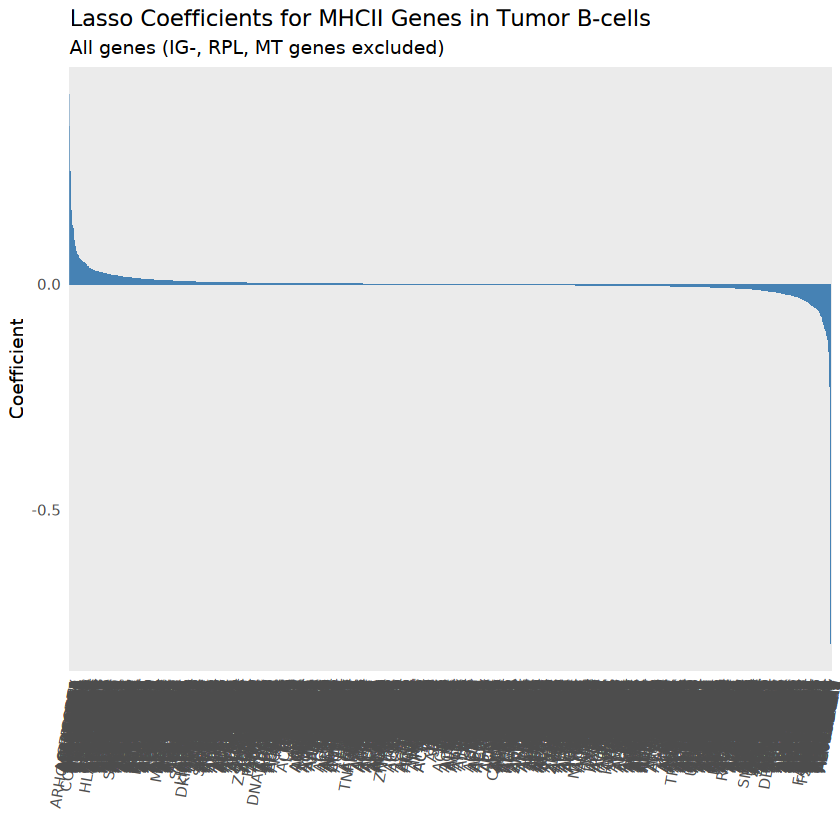

In [5]:
pre_Tumor.bcells <- FindVariableFeatures(pre_Tumor.bcells)

#variable_genes <- VariableFeatures(pre_Tumor.bcells)
variable_genes <- VariableFeaturePlot(object = pre_Tumor.bcells)
variable_genes <- variable_genes$data

#high_variable_genes_df <- subset(variable_genes$data, colors == 'yes' | mean > 1e+00)
#high_variable_genes_df <- high_variable_genes_df[!grepl("RPL|MT-", rownames(high_variable_genes_df)), ]
variable_genes_df <- variable_genes[!grepl("RPL|RPS|MT-", rownames(variable_genes)), ]
var_genes <- rownames(variable_genes_df)

exclude_genes <- c('HLA-DRA','HLA-DRB5','HLA-DRB1','HLA-DQA1','HLA-DQB1','HLA-DQA2','HLA-DQB2','HLA-DPA1','HLA-DPB1')
filtered_variable_genes <- setdiff(var_genes, exclude_genes)
#filtered_variable_genes <- filtered_variable_genes[!grepl("^IG[HLK]", filtered_variable_genes)]
#filtered_variable_genes <- filtered_variable_genes[1:500]

Mscore <- AddModuleScore(
  object = pre_Tumor.bcells,
  features = Gene_of_interest,
  name = 'MHCII_Genes'
)

x <- t(as.matrix(pre_Tumor.bcells@assays$RNA$data[filtered_variable_genes, ]))

print("Transmuted!")
# Loop over each response gene

#common_cells <- rownames(x)
common_cells <- intersect(rownames(x), rownames(Mscore@meta.data))
#print(Mscore@meta.data[, gene])
#common_cells <- colnames(x)
#print(common_cells[1:10])
y <- Mscore@meta.data[common_cells, "MHCII_Genes1", drop = FALSE]
#print(y)
y <- as.numeric(y[, 1])
#print(y)
#print(unique(y))
#print(length(unique(y)))
#y <- as.matrix(Mscore@meta.data[, gene])

# Sanity checks
stopifnot(length(y) == nrow(x))
stopifnot(length(unique(y)) > 1)


cv_model <- cv.glmnet(x = x, y = y, alpha = 1)
best_lambda <- cv_model$lambda.min

#genes_to_keep <- setdiff(filtered_variable_genes, gene_list)
#x <- t(as.matrix(pre_Tumor.bcells@assays$RNA$data[filtered_variable_genes, ]))

best_model <- glmnet(x, y, alpha = 1, lambda = best_lambda)
coef_df <- as.data.frame(as.matrix(coef(best_model)))
coef_df$Gene <- rownames(coef_df)
colnames(coef_df)[1] <- "Coefficient"
coef_df <- coef_df[coef_df$Gene != "(Intercept)", ]
coef_df <- coef_df[order(-coef_df$Coefficient), ]

#coef_df_filtered <- coef_df[coef_df$Coefficient != 0, ]
coef_df_filtered <- coef_df %>%
  filter(Coefficient != 0) %>%  # keep only non-zero coefficients
  filter(!grepl("^IGH|^IGK|^IGL", Gene))

HLA_cor_plot <- ggplot(coef_df_filtered, aes(x = reorder(Gene, -Coefficient), y = Coefficient)) +
    geom_bar(stat = "identity", fill = "steelblue") +
    labs(title = "Lasso Coefficients for MHCII Genes in Tumor B-cells",
            x = "", y = "Coefficient", subtitle = "All genes (IG-, RPL, MT genes excluded)") +
    theme_minimal() +
    theme(axis.text.x = element_text(angle = 80, hjust = 1))
print(HLA_cor_plot)
#write.csv(coef_df_filtered, "HLA_lasso_coefficients.csv", row.names = FALSE)
#file_name <- "Lasso Coefficients for MHCII Genes.jpeg"
write.csv(coef_df_filtered, "HLA_lasso_coefficients_unfiltered.csv", row.names = FALSE)
file_name <- "Lasso Coefficients for unfiltered MHCII Genes.jpeg"
ggsave(file_name, HLA_cor_plot, width = 100, height = 8, limitsize = FALSE)


In [3]:
file_name <- "Lasso Coefficients for MHCII Genes1.jpeg"
ggsave(file_name, HLA_cor_plot, width = 120, height = 8, limitsize = FALSE)

Finding variable features for layer counts

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.9 GiB”
Finding variable features for layer counts



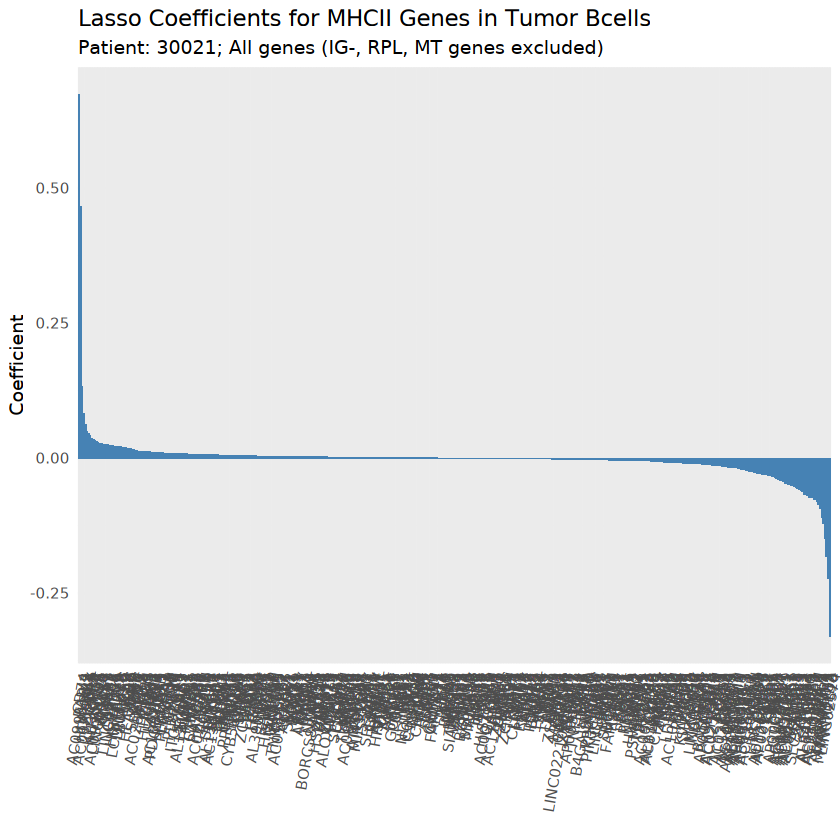

Finding variable features for layer counts

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.7 GiB”


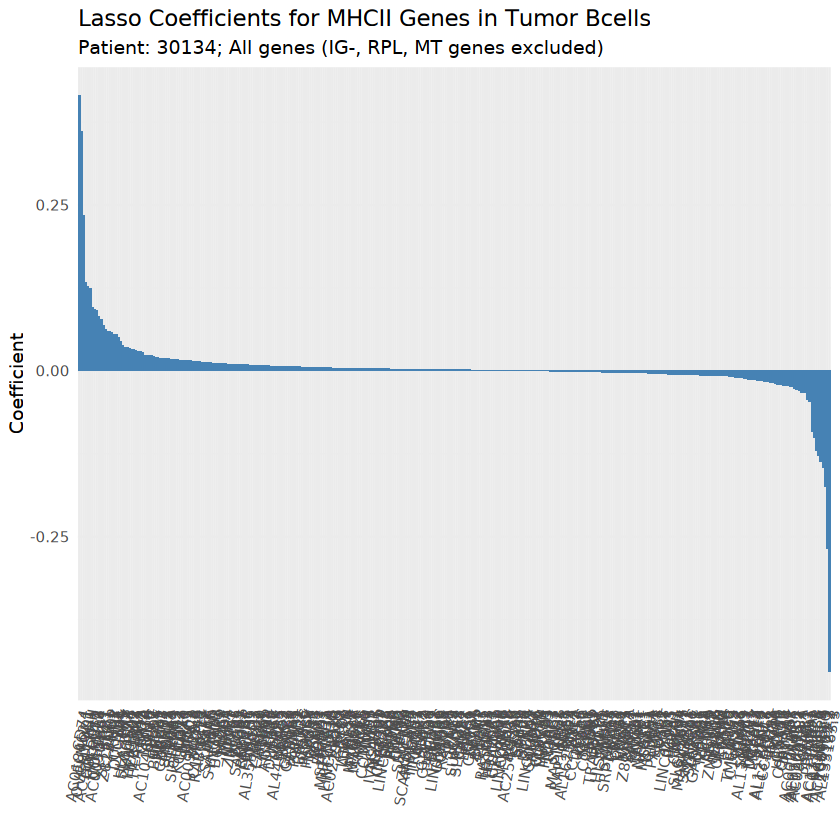

Finding variable features for layer counts

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.7 GiB”


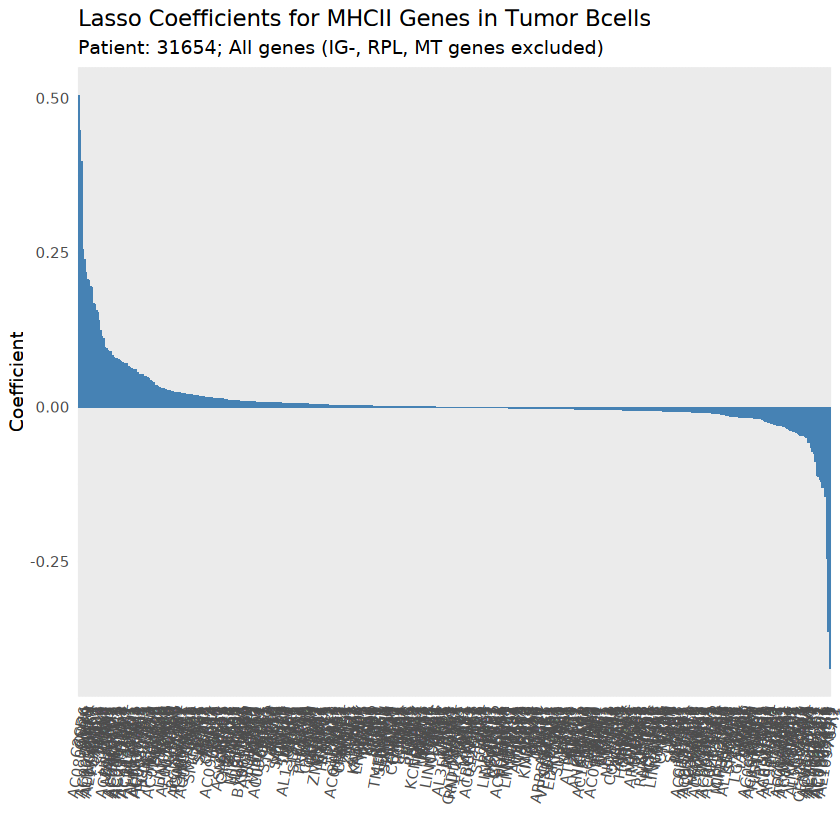

Finding variable features for layer counts

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.0 GiB”


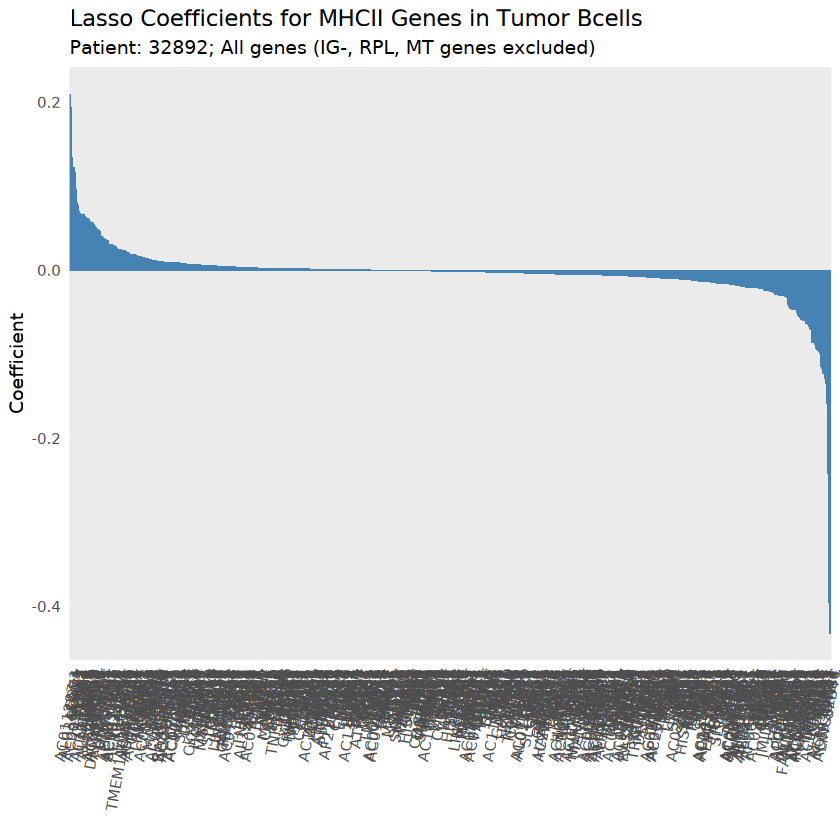

Finding variable features for layer counts



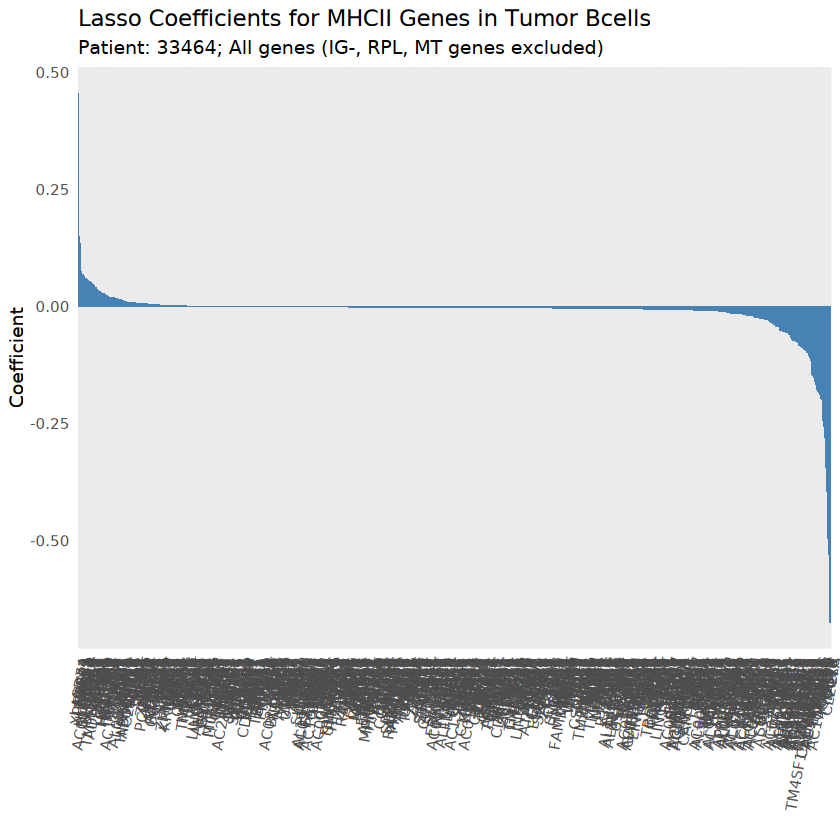

Finding variable features for layer counts

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.1 GiB”


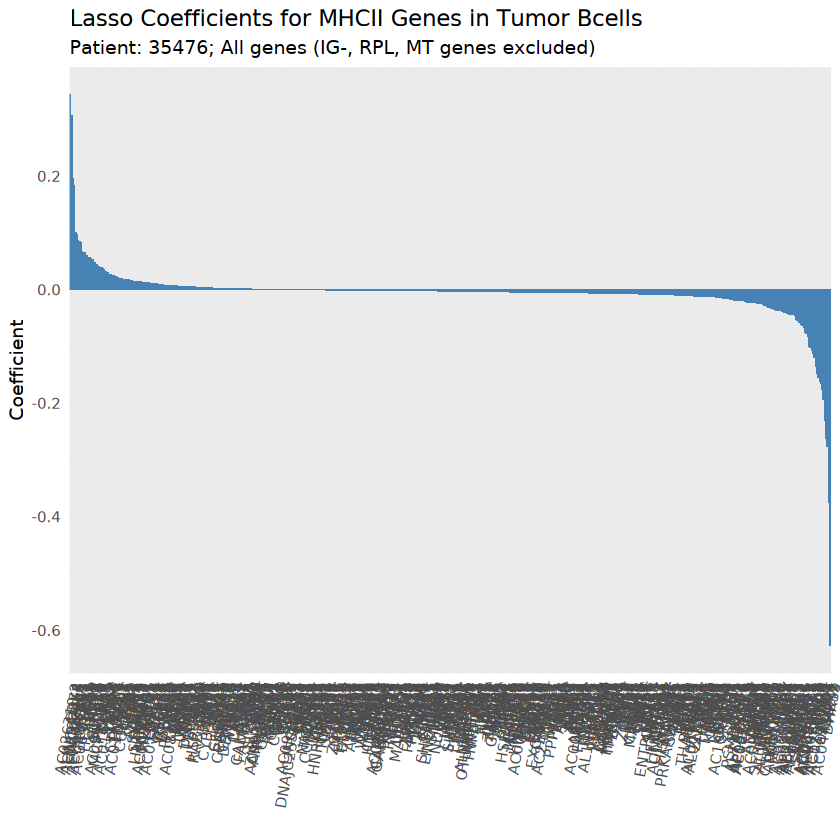

Finding variable features for layer counts

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.7 GiB”


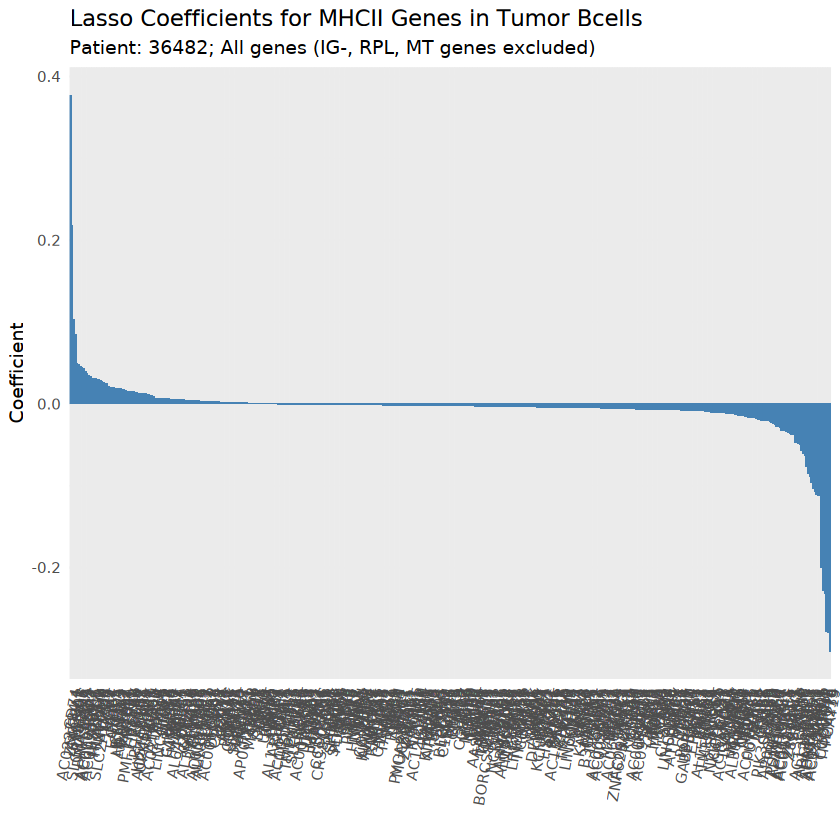

Finding variable features for layer counts



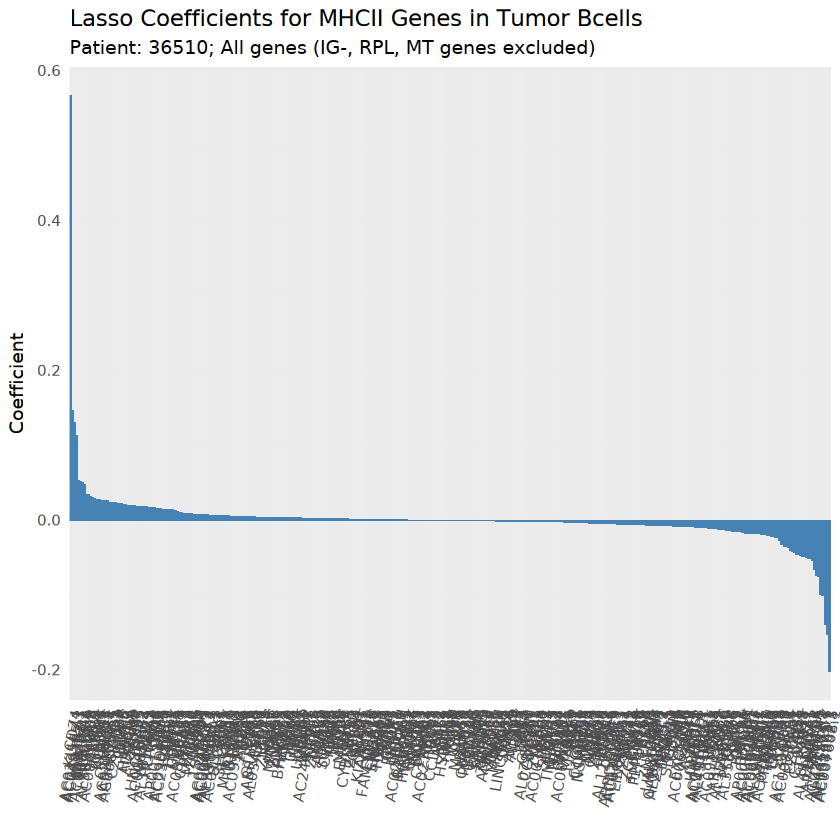

Finding variable features for layer counts



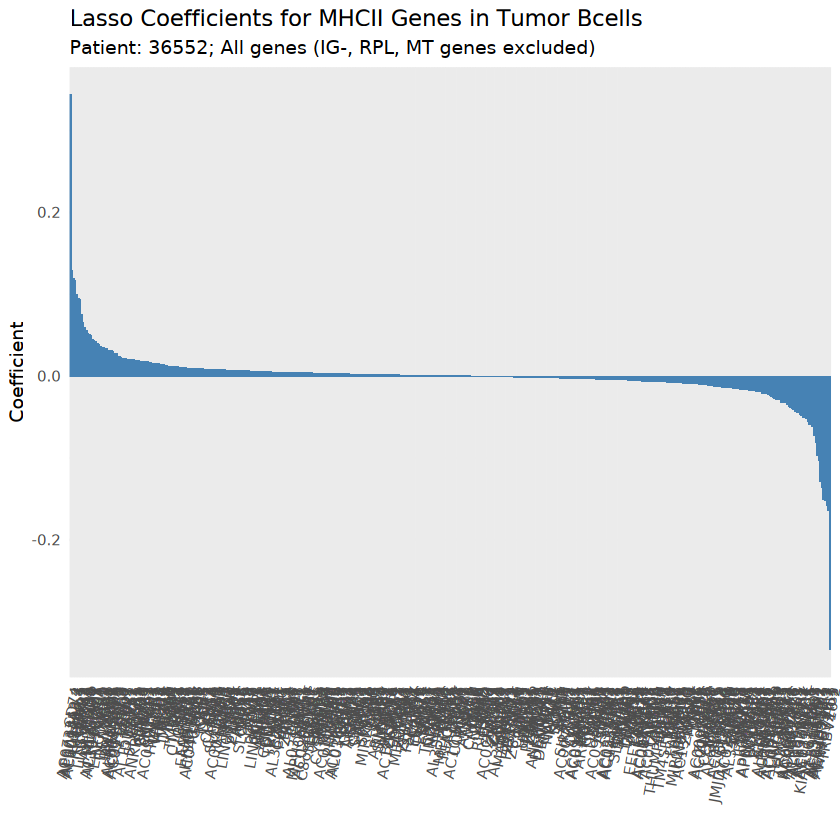

Finding variable features for layer counts



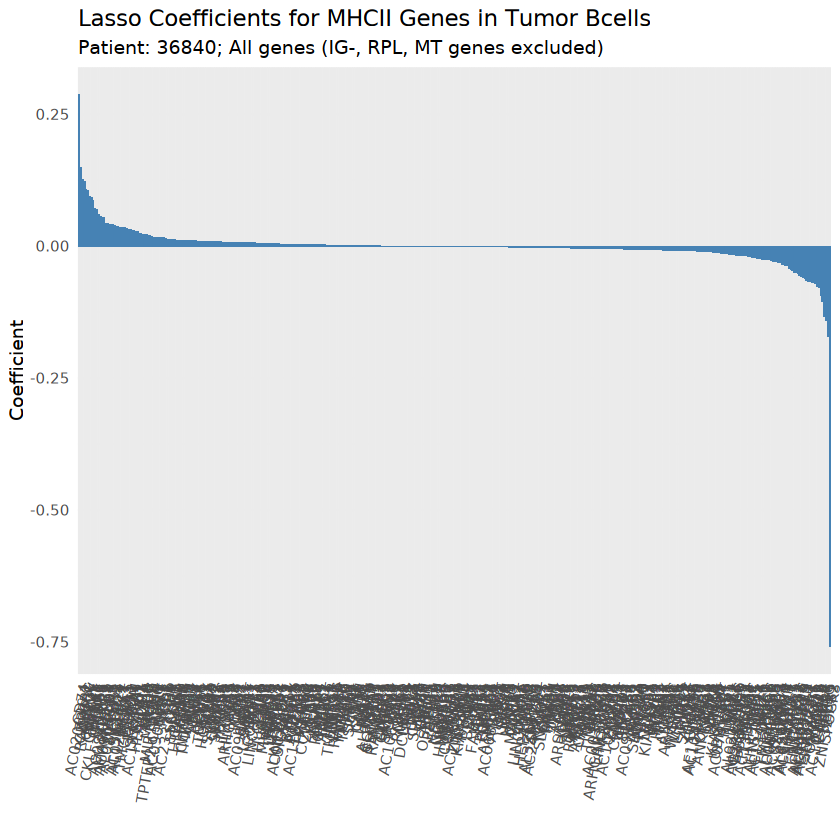

Finding variable features for layer counts

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.7 GiB”


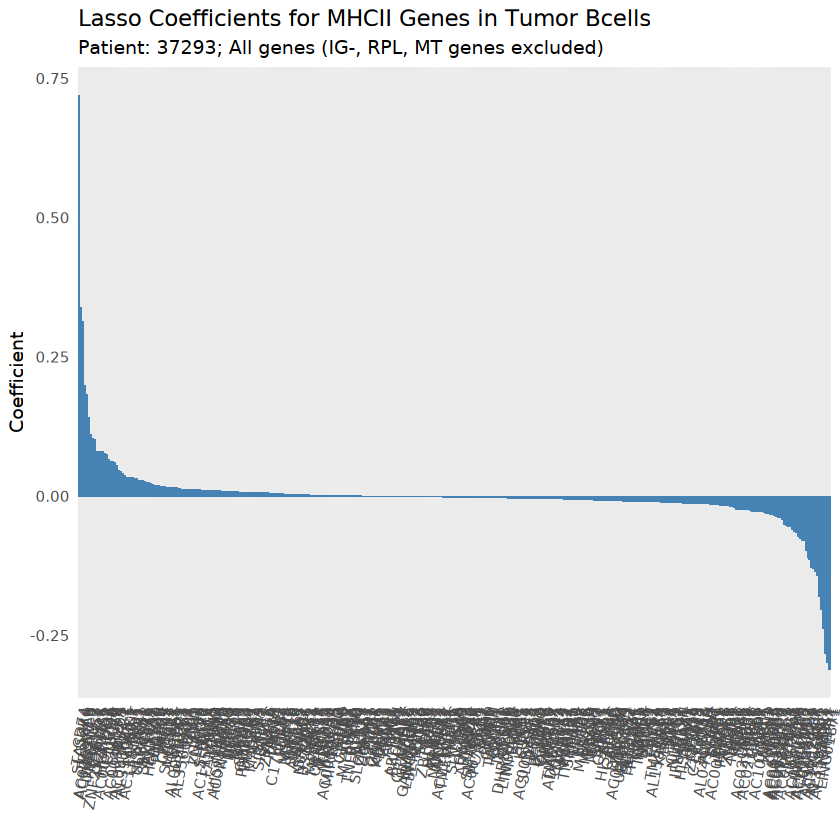

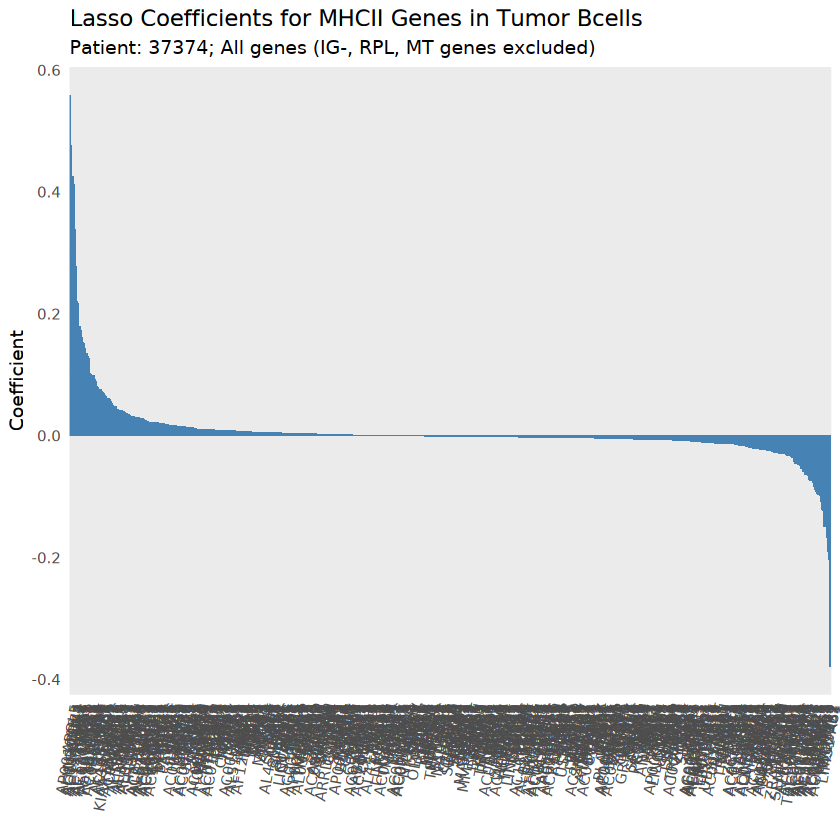

In [2]:
patient_list <- c('30021', '30134', '31654', '32892', '33464', '35476', '36482', '36510', '36552', '36840', '37293', '37374')

# Initialize empty lists
positive_genes_list <- list()
negative_genes_list <- list()

for(p in patient_list){
    p.data <- subset(pre_Tumor.bcells, patient == p)
    p.data <- FindVariableFeatures(p.data)

    #variable_genes <- VariableFeatures(pre_Tumor.bcells)
    variable_genes <- VariableFeaturePlot(object = p.data)
    variable_genes <- variable_genes$data

    #high_variable_genes_df <- subset(variable_genes$data, colors == 'yes' | mean > 1e+00)
    #high_variable_genes_df <- high_variable_genes_df[!grepl("RPL|MT-", rownames(high_variable_genes_df)), ]
    variable_genes_df <- variable_genes[!grepl("RPL|RPS|MT-", rownames(variable_genes)), ]
    var_genes <- rownames(variable_genes_df)

    exclude_genes <- c('HLA-DRA','HLA-DRB5','HLA-DRB1','HLA-DQA1','HLA-DQB1','HLA-DQA2','HLA-DQB2','HLA-DPA1','HLA-DPB1')
    filtered_variable_genes <- setdiff(var_genes, exclude_genes)
    #filtered_variable_genes <- filtered_variable_genes[!grepl("^IG[HLK]", filtered_variable_genes)]
    #filtered_variable_genes <- filtered_variable_genes[1:500]

    Mscore <- AddModuleScore(
    object = p.data,
    features = Gene_of_interest,
    name = 'MHCII_Genes'
    )

    x <- t(as.matrix(p.data@assays$RNA$data[filtered_variable_genes, ]))

    sprintf("Transmuted for patient: %s", p)
    # Loop over each response gene

    #common_cells <- rownames(x)
    common_cells <- intersect(rownames(x), rownames(Mscore@meta.data))
    #print(Mscore@meta.data[, gene])
    #common_cells <- colnames(x)
    #print(common_cells[1:10])
    y <- Mscore@meta.data[common_cells, "MHCII_Genes1", drop = FALSE]
    #print(y)
    y <- as.numeric(y[, 1])
    #print(y)
    #print(unique(y))
    #print(length(unique(y)))
    #y <- as.matrix(Mscore@meta.data[, gene])

    # Sanity checks
    stopifnot(length(y) == nrow(x))
    stopifnot(length(unique(y)) > 1)


    cv_model <- cv.glmnet(x = x, y = y, alpha = 1)
    best_lambda <- cv_model$lambda.min

    #genes_to_keep <- setdiff(filtered_variable_genes, gene_list)
    #x <- t(as.matrix(pre_Tumor.bcells@assays$RNA$data[filtered_variable_genes, ]))

    best_model <- glmnet(x, y, alpha = 1, lambda = best_lambda)
    coef_df <- as.data.frame(as.matrix(coef(best_model)))
    coef_df$Gene <- rownames(coef_df)
    colnames(coef_df)[1] <- "Coefficient"
    coef_df <- coef_df[coef_df$Gene != "(Intercept)", ]
    coef_df <- coef_df[order(-coef_df$Coefficient), ]

    #coef_df_filtered <- coef_df[coef_df$Coefficient != 0, ]
    coef_df_filtered <- coef_df %>%
    filter(Coefficient != 0) %>%  # keep only non-zero coefficients
    filter(!grepl("^IGH|^IGK|^IGL", Gene))

    
    positive_genes <- coef_df_filtered %>% filter(Coefficient > 0) %>% pull(Gene)
    negative_genes <- coef_df_filtered %>% filter(Coefficient < 0) %>% pull(Gene)
    
    # Store in lists, named by patient
    positive_genes_list[[p]] <- positive_genes
    negative_genes_list[[p]] <- negative_genes

    HLA_cor_plot <- ggplot(coef_df_filtered, aes(x = reorder(Gene, -Coefficient), y = Coefficient)) +
        geom_bar(stat = "identity", fill = "steelblue") +
        labs(title = "Lasso Coefficients for MHCII Genes in Tumor Bcells",
                x = "", y = "Coefficient", subtitle = sprintf("Patient: %s; All genes (IG-, RPL, MT genes excluded)", p)) +
        theme_minimal() +
        theme(axis.text.x = element_text(angle = 80, hjust = 1))
    print(HLA_cor_plot)
    write.csv(coef_df_filtered, sprintf("HLA_lasso_coefficients_unfiltered_%s.csv", p), row.names = FALSE)
    file_name <- sprintf("%s Lasso Coefficients for unfiltered MHCII Genes.jpeg", p)
    ggsave(file_name, HLA_cor_plot, width = 100, height = 8, limitsize = FALSE)
}

In [26]:
# For positive genes
common_positive_genes <- Reduce(intersect, positive_genes_list)
common_positive_genes
# For negative genes
common_negative_genes <- Reduce(intersect, negative_genes_list)
common_negative_genes

[1] "CD74"    "HLA-DMA" "HLA-DOA" "HLA-A"   "HLA-DMB" "HLA-E"

character(0)

In [4]:
# Flatten all genes into a single vector
pos_all_genes <- unlist(positive_genes_list)

# Count how often each gene appears
pos_gene_counts <- table(pos_all_genes)

# Get genes that appear in at least 3 patients
pos_genes_in_3_or_more <- names(pos_gene_counts[pos_gene_counts >= 3])

length(pos_genes_in_3_or_more)
pos_genes_in_3_or_more

# Flatten all genes into a single vector
neg_all_genes <- unlist(negative_genes_list)

# Count how often each gene appears
neg_gene_counts <- table(neg_all_genes)

# Get genes that appear in at least 3 patients
neg_genes_in_3_or_more <- names(neg_gene_counts[neg_gene_counts >= 3])

length(neg_genes_in_3_or_more)
neg_genes_in_3_or_more

[1] 106

[1] "ADCY3"      "AL034397.3" "AL391069.3" "ARL6IP5"    "ATF5"      
  [6] "B2M"        "BATF"       "BCL2A1"     "BTN2A2"     "CALR"      
 [11] "CCL3"       "CD19"       "CD1C"       "CD22"       "CD40"      
 [16] "CD48"       "CD52"       "CD53"       "CD68"       "CD72"      
 [21] "CD74"       "CD79A"      "CD83"       "CIITA"      "CLECL1"    
 [26] "CLIC1"      "CORO1A"     "CR2"        "CTSH"       "CYB561A3"  
 [31] "CYBA"       "DHRS9"      "DNASE1L3"   "DUSP2"      "EBI3"      
 [36] "EGR2"       "ELOVL5"     "FCER2"      "FCRLA"      "GNG8"      
 [41] "GPR18"      "GPR183"     "GPR82"      "GRN"        "HIVEP3"    
 [46] "HLA-A"      "HLA-B"      "HLA-C"      "HLA-DMA"    "HLA-DMB"   
 [51] "HLA-DOA"    "HLA-DOB"    "HLA-E"      "HLA-F"      "HOPX"      
 [56] "HSPA5"      "HTR3A"      "HVCN1"      "ICAM1"      "ICAM3"     
 [61] "IFNGR1"     "IL21R"      "IL4I1"      "INSIG1"     "ITGB2"     
 [66] "LAMP2"      "LAPTM5"     "LAT2"       "LGALS2"     "LGALS3"    
 [71] "LITAF"      "LY9"        "LYZ"        "MAP3K8"     "MIR155HG"  
 [76] "MS4A1"      "NAPSA"      "NFKB2"      "NFKBID"     "NFKBIE"    
 [81] "PARP15"     "PARVG"      "PDIA3"      "PHACTR1"    "PLEK"      
 [86] "PLPP5"      "PTPN6"      "PTPN7"      "RAC2"       "RFX5"      
 [91] "RHEX"       "SAMSN1"     "SCIMP"      "SELL"       "SLAMF1"    
 [96] "SLCO5A1"    "SRGN"       "SYNGR2"     "TAP1"       "TAPBP"     
[101] "TLR10"      "TMSB4X"     "TNF"        "TPP1"       "TRAF4"     
[106] "ZNF672"

[1] 131

[1] "ABCA1"      "AC003092.1" "AC007952.4" "AC133065.1" "AC135457.1"
  [6] "ACTB"       "AFF2"       "AFF3"       "AL121787.1" "AL138963.3"
 [11] "APH1A"      "BACH2"      "BCAS4"      "BCL6"       "BCL7A"     
 [16] "BMP7"       "BTG2"       "CALM1"      "CCDC69"     "CD27"      
 [21] "CD38"       "CD7"        "CD79B"      "CST7"       "CUX1"      
 [26] "CXCR4"      "DCAF12"     "DDX5"       "DENND3"     "EEF1B2"    
 [31] "EEF1D"      "ELL3"       "EML6"       "ERAP2"      "ETS1"      
 [36] "EZR"        "FAU"        "FOXP1"      "FTH1"       "FTL"       
 [41] "FYB1"       "GABARAPL2"  "GAPDH"      "GCSAM"      "GSTP1"     
 [46] "H2AFZ"      "H3F3A"      "HIST1H1E"   "HMGB1"      "HMGN2"     
 [51] "HRK"        "IFNG-AS1"   "IL32"       "IL4R"       "ISG20"     
 [56] "ITPR2"      "JCHAIN"     "JPT1"       "JUN"        "KANK2"     
 [61] "KLHL6"      "LBH"        "LIMD2"      "LINC01991"  "LINC02576" 
 [66] "LSM10"      "MALAT1"     "MAP2K1"     "MBD4"       "METAP2"    
 [71] "MIXL1"      "MME"        "MYBL1"      "NAP1L4"     "NCF1"      
 [76] "NDUFB11"    "NEIL1"      "OAZ1"       "ODC1"       "PABPC1"    
 [81] "PABPN1"     "PAX5"       "PECAM1"     "PHF3"       "PIM2"      
 [86] "PLEKHJ1"    "PPP1R14B"   "PRDM15"     "PRKCH"      "PRKRA"     
 [91] "PTMA"       "RASSF6"     "RCAN3"      "RGCC"       "RGS16"     
 [96] "SARAF"      "SELENOM"    "SERF2"      "SF3A1"      "SLC2A5"    
[101] "SLC30A4"    "SMARCB1"    "SNTA1"      "SOCS1"      "SPRED2"    
[106] "SRSF1"      "ST14"       "STMN1"      "SUGCT"      "SYK"       
[111] "SYNE2"      "TAGLN2"     "TCEA1"      "TCL1A"      "THRAP3"    
[116] "TMSB10"     "TNFSF8"     "TPT1"       "TRABD"      "TRAF5"     
[121] "TRAV21"     "TRBC2"      "UBE2J1"     "UBE2N"      "UBR3"      
[126] "USP7"       "VHL"        "VIM"        "WNK2"       "ZFP36L2"   
[131] "ZNF280D"

In [6]:
pos_genes_in_2_or_more <- names(pos_gene_counts[pos_gene_counts >= 2])
neg_genes_in_2_or_more <- names(neg_gene_counts[neg_gene_counts >= 2])
pos_genes_in_2_or_more
neg_genes_in_2_or_more

pos_genes_in_3_or_more <- names(pos_gene_counts[pos_gene_counts >= 3])
neg_genes_in_3_or_more <- names(neg_gene_counts[neg_gene_counts >= 3])
pos_genes_in_3_or_more
neg_genes_in_3_or_more

pos_genes_in_4_or_more <- names(pos_gene_counts[pos_gene_counts >= 4])
neg_genes_in_4_or_more <- names(neg_gene_counts[neg_gene_counts >= 4])
pos_genes_in_4_or_more
neg_genes_in_4_or_more

pos_genes_in_5_or_more <- names(pos_gene_counts[pos_gene_counts >= 5])
neg_genes_in_5_or_more <- names(neg_gene_counts[neg_gene_counts >= 5])
pos_genes_in_5_or_more
neg_genes_in_5_or_more

pos_genes_in_6_or_more <- names(pos_gene_counts[pos_gene_counts >= 6])
neg_genes_in_6_or_more <- names(neg_gene_counts[neg_gene_counts >= 6])
pos_genes_in_6_or_more
neg_genes_in_6_or_more

pos_genes_in_7_or_more <- names(pos_gene_counts[pos_gene_counts >= 7])
neg_genes_in_7_or_more <- names(neg_gene_counts[neg_gene_counts >= 7])
pos_genes_in_7_or_more
neg_genes_in_7_or_more

pos_genes_in_8_or_more <- names(pos_gene_counts[pos_gene_counts >= 8])
neg_genes_in_8_or_more <- names(neg_gene_counts[neg_gene_counts >= 8])
pos_genes_in_8_or_more
neg_genes_in_8_or_more

save(pos_genes_in_2_or_more, file = "pos_genes_in_2_or_more.Robj")
save(neg_genes_in_2_or_more, file = "neg_genes_in_2_or_more.Robj")

save(pos_genes_in_3_or_more, file = "pos_genes_in_3_or_more.Robj")
save(neg_genes_in_3_or_more, file = "neg_genes_in_3_or_more.Robj")

save(pos_genes_in_4_or_more, file = "pos_genes_in_4_or_more.Robj")
save(neg_genes_in_4_or_more, file = "neg_genes_in_4_or_more.Robj")

save(pos_genes_in_5_or_more, file = "pos_genes_in_5_or_more.Robj")
save(neg_genes_in_5_or_more, file = "neg_genes_in_5_or_more.Robj")

save(pos_genes_in_6_or_more, file = "pos_genes_in_6_or_more.Robj")
save(neg_genes_in_6_or_more, file = "neg_genes_in_6_or_more.Robj")

save(pos_genes_in_7_or_more, file = "pos_genes_in_7_or_more.Robj")
save(neg_genes_in_7_or_more, file = "neg_genes_in_7_or_more.Robj")

save(pos_genes_in_8_or_more, file = "pos_genes_in_8_or_more.Robj")
save(neg_genes_in_8_or_more, file = "neg_genes_in_8_or_more.Robj")

[1] "ABCA6"      "AC004585.1" "AC005046.1" "AC010247.2" "AC020911.2"
  [6] "AC079630.1" "ACTG1"      "ACY3"       "ADCY3"      "ADPRHL1"   
 [11] "AL034397.3" "AL391069.3" "ALOX5AP"    "ANXA6"      "APOD"      
 [16] "ARID5B"     "ARL6IP5"    "ARPC2"      "ATF5"       "ATP5F1E"   
 [21] "ATXN1"      "B2M"        "BANK1"      "BATF"       "BCL2A1"    
 [26] "BRD2"       "BTN2A2"     "BTN3A2"     "BTRC"       "C17orf80"  
 [31] "C1orf162"   "C2orf74"    "C8orf76"    "CALCOCO2"   "CALR"      
 [36] "CARD11"     "CCL3"       "CCR6"       "CCR7"       "CCT4"      
 [41] "CD19"       "CD1A"       "CD1C"       "CD200"      "CD22"      
 [46] "CD40"       "CD48"       "CD52"       "CD53"       "CD55"      
 [51] "CD6"        "CD68"       "CD69"       "CD72"       "CD74"      
 [56] "CD79A"      "CD79B"      "CD83"       "CHL1"       "CIITA"     
 [61] "CLEC10A"    "CLEC2B"     "CLECL1"     "CLIC1"      "CNOT10"    
 [66] "COMMD1"     "COMMD4"     "CORO1A"     "COTL1"      "COX7C"     
 [71] "CPVL"       "CR1"        "CR2"        "CRIP3"      "CST3"      
 [76] "CTSH"       "CTSS"       "CYB561A3"   "CYBA"       "CYP51A1"   
 [81] "DAD1"       "DDIT4"      "DENND6B"    "DHRS9"      "DNASE1L3"  
 [86] "DNPH1"      "DOK1"       "DUSP2"      "DUSP22"     "EBI3"      
 [91] "EGR1"       "EGR2"       "EGR3"       "EIF3E"      "ELOVL5"    
 [96] "ERP29"      "EVI2A"      "FAM162A"    "FCER2"      "FCGR2B"    
[101] "FCRL5"      "FCRLA"      "FDCSP"      "FLNA"       "GCNT1"     
[106] "GEMIN5"     "GLB1"       "GM2A"       "GNG8"       "GPR174"    
[111] "GPR18"      "GPR183"     "GPR82"      "GRN"        "GSX2"      
[116] "GYPC"       "HACD4"      "HCK"        "HIST1H2BK"  "HIST1H3B"  
[121] "HIVEP3"     "HLA-A"      "HLA-B"      "HLA-C"      "HLA-DMA"   
[126] "HLA-DMB"    "HLA-DOA"    "HLA-DOB"    "HLA-E"      "HLA-F"     
[131] "HMGCS1"     "HOPX"       "HSP90B1"    "HSPA13"     "HSPA5"     
[136] "HSPA8"      "HSPB6"      "HTR3A"      "HVCN1"      "ICAM1"     
[141] "ICAM3"      "IDI1"       "IER2"       "IFI30"      "IFITM2"    
[146] "IFNGR1"     "IL21R"      "IL22RA2"    "IL4I1"      "INSIG1"    
[151] "IRF5"       "ITGB2"      "ITGB2-AS1"  "ITGB7"      "ITIH4"     
[156] "ITM2A"      "IZUMO4"     "KIF20B"     "KLRG1"      "KMO"       
[161] "LAGE3"      "LAMP2"      "LAPTM5"     "LAT2"       "LCP1"      
[166] "LGALS2"     "LGALS3"     "LGALS9"     "LINC01857"  "LITAF"     
[171] "LMO2"       "LPAR5"      "LY86"       "LY9"        "LYZ"       
[176] "M6PR"       "MANBA"      "MAP3K8"     "MARCH5"     "MARCKS"    
[181] "MBTD1"      "MED12L"     "MEF2C"      "MIR155HG"   "MPEG1"     
[186] "MS4A1"      "MYBBP1A"    "MYL5"       "NAPSA"      "NFKB2"     
[191] "NFKBID"     "NFKBIE"     "NPC2"       "NR4A1"      "NR4A2"     
[196] "NR4A3"      "NTNG1"      "PADI2"      "PARM1"      "PARP15"    
[201] "PARP9"      "PARVB"      "PARVG"      "PDIA3"      "PDIA6"     
[206] "PHACTR1"    "PLBD1"      "PLD4"       "PLEK"       "PLPP5"     
[211] "PPM1M"      "PSMB7"      "PTPN6"      "PTPN7"      "PUS10"     
[216] "PXK"        "RAB24"      "RAC2"       "RAMMET"     "RCE1"      
[221] "RENBP"      "RFX5"       "RGS1"       "RGS10"      "RHEX"      
[226] "RHOBTB2"    "RHOF"       "RIPOR2"     "RNMT"       "SAMD9L"    
[231] "SAMSN1"     "SCIMP"      "SCP2"       "SELENOH"    "SELL"      
[236] "SGSH"       "SH2D1A"     "SIGLEC14"   "SLAMF1"     "SLAMF7"    
[241] "SLC12A8"    "SLC29A1"    "SLC38A5"    "SLCO5A1"    "SMAD7"     
[246] "SMIM14"     "SMIM20"     "SNX11"      "SON"        "SPAG7"     
[251] "SPDYE3"     "SRGN"       "SSTR3"      "STARD9"     "SYNGR2"    
[256] "SYPL1"      "SYTL1"      "TAP1"       "TAPBP"      "TLR10"     
[261] "TMSB4X"     "TNF"        "TNFRSF14"   "TPP1"       "TRAF4"     
[266] "TRMT2A"     "TRMT61B"    "TSPYL2"     "TTYH1"      "TUBB"      
[271] "UQCC1"      "UQCRH"      "USF2"       "ZFAS1"      "ZFP36L1"   
[276] "ZMAT3"      "ZNF320"     "ZNF672"

[1] "ABCA1"      "ABCC4"      "ABLIM1"     "AC003092.1" "AC004771.1"
  [6] "AC004812.2" "AC005253.1" "AC007743.1" "AC007952.4" "AC009554.1"
 [11] "AC012236.1" "AC016831.7" "AC022182.1" "AC022893.1" "AC025569.1"
 [16] "AC026367.3" "AC099524.1" "AC103563.7" "AC133065.1" "AC135457.1"
 [21] "AC243960.1" "ACAP2"      "ACIN1"      "ACSF3"      "ACSM3"     
 [26] "ACTB"       "AES"        "AFF2"       "AFF3"       "AICDA"     
 [31] "AIFM1"      "AK2"        "AKAP13"     "AKR7A2"     "AL121787.1"
 [36] "AL133415.1" "AL138963.3" "AL157402.1" "AL158850.1" "AL451107.1"
 [41] "ALDH1L2"    "ALOX5"      "ANKH"       "ANKRD36B"   "AP003392.4"
 [46] "AP3B1"      "APH1A"      "ARGLU1"     "ARHGDIA"    "ARRDC1-AS1"
 [51] "ASTL"       "ATP2B4"     "ATP5MC3"    "ATP6V1G1"   "ATP7A"     
 [56] "B3GALNT2"   "BACH2"      "BAG1"       "BANF1"      "BARD1"     
 [61] "BBX"        "BCAS4"      "BCL6"       "BCL7A"      "BCLAF1"    
 [66] "BIK"        "BLOC1S6"    "BMP3"       "BMP7"       "BNIP3"     
 [71] "BRWD1"      "BTBD19"     "BTF3"       "BTG2"       "C11orf1"   
 [76] "C19orf53"   "C2orf74"    "CA5A"       "CADPS"      "CALM1"     
 [81] "CAND2"      "CASP3"      "CCDC102A"   "CCDC12"     "CCDC69"    
 [86] "CD2"        "CD24"       "CD27"       "CD320"      "CD37"      
 [91] "CD38"       "CD3E"       "CD6"        "CD7"        "CD79B"     
 [96] "CD82"       "CD99"       "CDC40"      "CDCA7"      "CDCA7L"    
[101] "CDK1"       "CDKN1B"     "CDV3"       "CHMP7"      "CHRNA10"   
[106] "CLEC20A"    "CLNK"       "CMPK2"      "CNBP"       "COLGALT1"  
[111] "COTL1"      "COX18"      "COX4I1"     "COX5B"      "COX6B1"    
[116] "COX7A2L"    "CREBRF"     "CREBZF"     "CST7"       "CSTF3"     
[121] "CUX1"       "CXCR4"      "CXXC5"      "CYP2D6"     "DCAF12"    
[126] "DCXR"       "DDX5"       "DEF8"       "DENND3"     "DGKA"      
[131] "DGUOK"      "DNAJC6"     "DNHD1"      "DROSHA"     "E2F5"      
[136] "EDRF1"      "EEF1A1"     "EEF1B2"     "EEF1D"      "EEF2"      
[141] "EIF2S2"     "EIF3F"      "ELL3"       "ELP1"       "EML6"      
[146] "EPC1"       "ERAP2"      "ETS1"       "ETS2"       "EZR"       
[151] "FABP5"      "FADS3"      "FAM19A2"    "FAM96B"     "FAU"       
[156] "FBP1"       "FCRL2"      "FKBP5"      "FOXP1"      "FTH1"      
[161] "FTL"        "FXYD5"      "FXYD6"      "FYB1"       "FYN"       
[166] "GABARAPL2"  "GAPDH"      "GCHFR"      "GCSAM"      "GIMAP7"    
[171] "GK5"        "GLUL"       "GMFG"       "GNB3"       "GNG11"     
[176] "GRK2"       "GSK3A"      "GSTP1"      "GTF2I"      "GTF3A"     
[181] "H1F0"       "H2AFV"      "H2AFZ"      "H3F3A"      "HCG18"     
[186] "HELB"       "HELZ"       "HIST1H1E"   "HIST1H4C"   "HMGB1"     
[191] "HMGN2"      "HMGN3"      "HMOX1"      "HNRNPA3"    "HNRNPDL"   
[196] "HNRNPLL"    "HRK"        "ID3"        "IFNG-AS1"   "IKZF3"     
[201] "IL32"       "IL4R"       "IRF8"       "ISG20"      "ITM2A"     
[206] "ITPR2"      "JCHAIN"     "JPT1"       "JUN"        "KANK2"     
[211] "KCNH2"      "KIAA0040"   "KLF3"       "KLHL6"      "KNL1"      
[216] "LAT"        "LBH"        "LGALS9C"    "LIMD2"      "LINC00483" 
[221] "LINC00861"  "LINC01991"  "LINC02145"  "LINC02576"  "LIPT2"     
[226] "LOXL2"      "LOXL4"      "LPP-AS2"    "LRFN3"      "LSM10"     
[231] "LTB"        "LUC7L3"     "MAGOHB"     "MALAT1"     "MAP1LC3B"  
[236] "MAP2K1"     "MAP2K7"     "MAP4K1"     "MAP4K2"     "MAP7D1"    
[241] "MAPK10"     "MARCH1"     "MARCKS"     "MARCKSL1"   "MBD4"      
[246] "MBNL1"      "MCEE"       "METAP2"     "MIXL1"      "MLF2"      
[251] "MLLT3"      "MMD"        "MME"        "MSI2"       "MSL3"      
[256] "MT1X"       "MTFP1"      "MYBL1"      "MYH9"       "MYO9A"     
[261] "NADSYN1"    "NAP1L4"     "NBL1"       "NCF1"       "NCK1"      
[266] "NCL"        "NDUFA2"     "NDUFA4"     "NDUFB11"    "NEIL1"     
[271] "NFATC1"     "NOL9"       "NPIPB4"     "NREP"       "NSMCE4A"   
[276] "NT5C"       "NUDT17"     "OAZ1"       "OCIAD2"     "ODC1"      
[281] "OGT"        "ORAI2"

[1] "ADCY3"      "AL034397.3" "AL391069.3" "ARL6IP5"    "ATF5"      
  [6] "B2M"        "BATF"       "BCL2A1"     "BTN2A2"     "CALR"      
 [11] "CCL3"       "CD19"       "CD1C"       "CD22"       "CD40"      
 [16] "CD48"       "CD52"       "CD53"       "CD68"       "CD72"      
 [21] "CD74"       "CD79A"      "CD83"       "CIITA"      "CLECL1"    
 [26] "CLIC1"      "CORO1A"     "CR2"        "CTSH"       "CYB561A3"  
 [31] "CYBA"       "DHRS9"      "DNASE1L3"   "DUSP2"      "EBI3"      
 [36] "EGR2"       "ELOVL5"     "FCER2"      "FCRLA"      "GNG8"      
 [41] "GPR18"      "GPR183"     "GPR82"      "GRN"        "HIVEP3"    
 [46] "HLA-A"      "HLA-B"      "HLA-C"      "HLA-DMA"    "HLA-DMB"   
 [51] "HLA-DOA"    "HLA-DOB"    "HLA-E"      "HLA-F"      "HOPX"      
 [56] "HSPA5"      "HTR3A"      "HVCN1"      "ICAM1"      "ICAM3"     
 [61] "IFNGR1"     "IL21R"      "IL4I1"      "INSIG1"     "ITGB2"     
 [66] "LAMP2"      "LAPTM5"     "LAT2"       "LGALS2"     "LGALS3"    
 [71] "LITAF"      "LY9"        "LYZ"        "MAP3K8"     "MIR155HG"  
 [76] "MS4A1"      "NAPSA"      "NFKB2"      "NFKBID"     "NFKBIE"    
 [81] "PARP15"     "PARVG"      "PDIA3"      "PHACTR1"    "PLEK"      
 [86] "PLPP5"      "PTPN6"      "PTPN7"      "RAC2"       "RFX5"      
 [91] "RHEX"       "SAMSN1"     "SCIMP"      "SELL"       "SLAMF1"    
 [96] "SLCO5A1"    "SRGN"       "SYNGR2"     "TAP1"       "TAPBP"     
[101] "TLR10"      "TMSB4X"     "TNF"        "TPP1"       "TRAF4"     
[106] "ZNF672"

[1] "ABCA1"      "AC003092.1" "AC007952.4" "AC133065.1" "AC135457.1"
  [6] "ACTB"       "AFF2"       "AFF3"       "AL121787.1" "AL138963.3"
 [11] "APH1A"      "BACH2"      "BCAS4"      "BCL6"       "BCL7A"     
 [16] "BMP7"       "BTG2"       "CALM1"      "CCDC69"     "CD27"      
 [21] "CD38"       "CD7"        "CD79B"      "CST7"       "CUX1"      
 [26] "CXCR4"      "DCAF12"     "DDX5"       "DENND3"     "EEF1B2"    
 [31] "EEF1D"      "ELL3"       "EML6"       "ERAP2"      "ETS1"      
 [36] "EZR"        "FAU"        "FOXP1"      "FTH1"       "FTL"       
 [41] "FYB1"       "GABARAPL2"  "GAPDH"      "GCSAM"      "GSTP1"     
 [46] "H2AFZ"      "H3F3A"      "HIST1H1E"   "HMGB1"      "HMGN2"     
 [51] "HRK"        "IFNG-AS1"   "IL32"       "IL4R"       "ISG20"     
 [56] "ITPR2"      "JCHAIN"     "JPT1"       "JUN"        "KANK2"     
 [61] "KLHL6"      "LBH"        "LIMD2"      "LINC01991"  "LINC02576" 
 [66] "LSM10"      "MALAT1"     "MAP2K1"     "MBD4"       "METAP2"    
 [71] "MIXL1"      "MME"        "MYBL1"      "NAP1L4"     "NCF1"      
 [76] "NDUFB11"    "NEIL1"      "OAZ1"       "ODC1"       "PABPC1"    
 [81] "PABPN1"     "PAX5"       "PECAM1"     "PHF3"       "PIM2"      
 [86] "PLEKHJ1"    "PPP1R14B"   "PRDM15"     "PRKCH"      "PRKRA"     
 [91] "PTMA"       "RASSF6"     "RCAN3"      "RGCC"       "RGS16"     
 [96] "SARAF"      "SELENOM"    "SERF2"      "SF3A1"      "SLC2A5"    
[101] "SLC30A4"    "SMARCB1"    "SNTA1"      "SOCS1"      "SPRED2"    
[106] "SRSF1"      "ST14"       "STMN1"      "SUGCT"      "SYK"       
[111] "SYNE2"      "TAGLN2"     "TCEA1"      "TCL1A"      "THRAP3"    
[116] "TMSB10"     "TNFSF8"     "TPT1"       "TRABD"      "TRAF5"     
[121] "TRAV21"     "TRBC2"      "UBE2J1"     "UBE2N"      "UBR3"      
[126] "USP7"       "VHL"        "VIM"        "WNK2"       "ZFP36L2"   
[131] "ZNF280D"

[1] "AL391069.3" "BCL2A1"     "BTN2A2"     "CALR"       "CD22"      
 [6] "CD40"       "CD48"       "CD52"       "CD53"       "CD72"      
[11] "CD74"       "CD83"       "CIITA"      "CORO1A"     "CR2"       
[16] "CTSH"       "CYB561A3"   "CYBA"       "DHRS9"      "EBI3"      
[21] "EGR2"       "ELOVL5"     "FCER2"      "GPR183"     "HLA-A"     
[26] "HLA-B"      "HLA-C"      "HLA-DMA"    "HLA-DMB"    "HLA-DOA"   
[31] "HLA-DOB"    "HLA-E"      "HLA-F"      "HOPX"       "HSPA5"     
[36] "HTR3A"      "HVCN1"      "ICAM1"      "ICAM3"      "IFNGR1"    
[41] "IL21R"      "IL4I1"      "INSIG1"     "ITGB2"      "LAT2"      
[46] "LY9"        "MIR155HG"   "MS4A1"      "NFKBID"     "PARVG"     
[51] "PDIA3"      "PHACTR1"    "PTPN6"      "RAC2"       "RFX5"      
[56] "SCIMP"      "SELL"       "SLAMF1"     "SLCO5A1"    "SYNGR2"    
[61] "TMSB4X"     "TPP1"       "ZNF672"

[1] "AC007952.4" "AC133065.1" "AFF2"       "AL121787.1" "BACH2"     
 [6] "BCL6"       "BMP7"       "BTG2"       "CCDC69"     "CD79B"     
[11] "CUX1"       "CXCR4"      "DCAF12"     "DDX5"       "ELL3"      
[16] "EZR"        "GCSAM"      "GSTP1"      "H3F3A"      "HIST1H1E"  
[21] "HMGB1"      "HMGN2"      "HRK"        "IFNG-AS1"   "IL32"      
[26] "ISG20"      "JCHAIN"     "LIMD2"      "LSM10"      "MALAT1"    
[31] "MBD4"       "MME"        "MYBL1"      "NEIL1"      "OAZ1"      
[36] "PABPC1"     "PAX5"       "PRDM15"     "PTMA"       "RASSF6"    
[41] "RGCC"       "SARAF"      "SERF2"      "SLC2A5"     "SLC30A4"   
[46] "SNTA1"      "SOCS1"      "ST14"       "SUGCT"      "SYNE2"     
[51] "TAGLN2"     "TCEA1"      "TCL1A"      "TRAF5"      "ZFP36L2"

[1] "BTN2A2"   "CD48"     "CD52"     "CD53"     "CD72"     "CD74"    
 [7] "CD83"     "CIITA"    "CORO1A"   "CR2"      "CTSH"     "CYB561A3"
[13] "CYBA"     "DHRS9"    "EBI3"     "EGR2"     "FCER2"    "HLA-A"   
[19] "HLA-B"    "HLA-C"    "HLA-DMA"  "HLA-DMB"  "HLA-DOA"  "HLA-DOB" 
[25] "HLA-E"    "HLA-F"    "IL4I1"    "ITGB2"    "MIR155HG" "MS4A1"   
[31] "PARVG"    "PHACTR1"  "RFX5"     "SCIMP"    "SLAMF1"   "SYNGR2"  
[37] "TMSB4X"   "TPP1"     "ZNF672"

[1] "AC133065.1" "AFF2"       "BACH2"      "BMP7"       "BTG2"      
 [6] "CXCR4"      "DCAF12"     "H3F3A"      "HIST1H1E"   "HMGB1"     
[11] "HMGN2"      "ISG20"      "JCHAIN"     "LSM10"      "MALAT1"    
[16] "MME"        "MYBL1"      "OAZ1"       "PABPC1"     "PTMA"      
[21] "RASSF6"     "RGCC"       "SARAF"      "SERF2"      "SLC2A5"    
[26] "SUGCT"      "SYNE2"      "TCEA1"      "ZFP36L2"

[1] "BTN2A2"   "CD48"     "CD53"     "CD72"     "CD74"     "CD83"    
 [7] "CIITA"    "EBI3"     "FCER2"    "HLA-A"    "HLA-B"    "HLA-C"   
[13] "HLA-DMA"  "HLA-DMB"  "HLA-DOA"  "HLA-DOB"  "HLA-E"    "HLA-F"   
[19] "ITGB2"    "MIR155HG" "MS4A1"    "PHACTR1"  "RFX5"     "TPP1"

[1] "AC133065.1" "BACH2"      "BMP7"       "BTG2"       "CXCR4"     
 [6] "HIST1H1E"   "HMGN2"      "ISG20"      "JCHAIN"     "LSM10"     
[11] "MALAT1"     "MME"        "PTMA"       "RGCC"       "SLC2A5"    
[16] "SUGCT"      "TCEA1"      "ZFP36L2"

[1] "BTN2A2"   "CD53"     "CD72"     "CD74"     "CD83"     "CIITA"   
 [7] "FCER2"    "HLA-A"    "HLA-B"    "HLA-C"    "HLA-DMA"  "HLA-DMB" 
[13] "HLA-DOA"  "HLA-DOB"  "HLA-E"    "HLA-F"    "ITGB2"    "MIR155HG"
[19] "MS4A1"    "PHACTR1"  "RFX5"

[1] "AC133065.1" "BACH2"      "HIST1H1E"   "ISG20"      "MALAT1"    
[6] "RGCC"       "ZFP36L2"

[1] "BTN2A2"   "CD53"     "CD72"     "CD74"     "CIITA"    "FCER2"   
 [7] "HLA-A"    "HLA-B"    "HLA-C"    "HLA-DMA"  "HLA-DMB"  "HLA-DOA" 
[13] "HLA-DOB"  "HLA-E"    "HLA-F"    "MIR155HG" "MS4A1"    "RFX5"

[1] "AC133065.1" "HIST1H1E"   "RGCC"

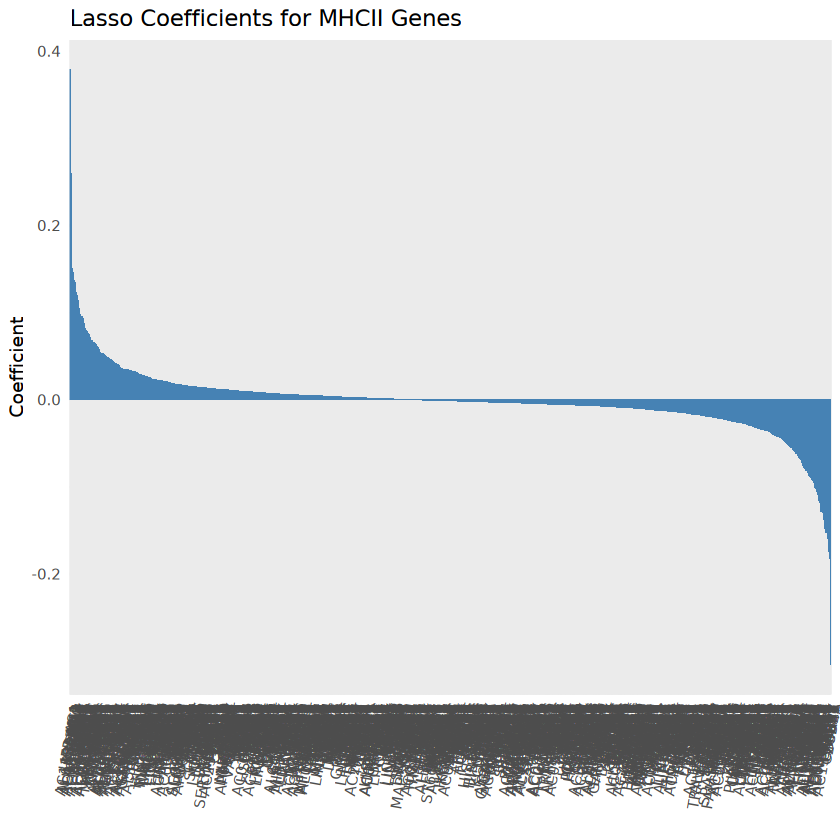

In [16]:
HLA_cor_plot <- ggplot(coef_df_filtered, aes(x = reorder(Gene, -Coefficient), y = Coefficient)) +
    geom_bar(stat = "identity", fill = "steelblue") +
    labs(title = "Lasso Coefficients for MHCII Genes",
            x = "", y = "Coefficient") +
    theme_minimal() +
    theme(axis.text.x = element_text(angle = 80, hjust = 1))
print(HLA_cor_plot)
file_name <- "Lasso Coefficients for MHCII Genes2.jpeg"
ggsave(file_name, HLA_cor_plot, width = 20, height = 8, dpi = 600, limitsize = FALSE)

In [21]:
ggsave(file_name, HLA_cor_plot, width = 60, height = 20, units = "cm", dpi = 300)

Loading required package: Matrix

Loaded glmnet 4.1-8

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Finding variable features for layer counts

Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”


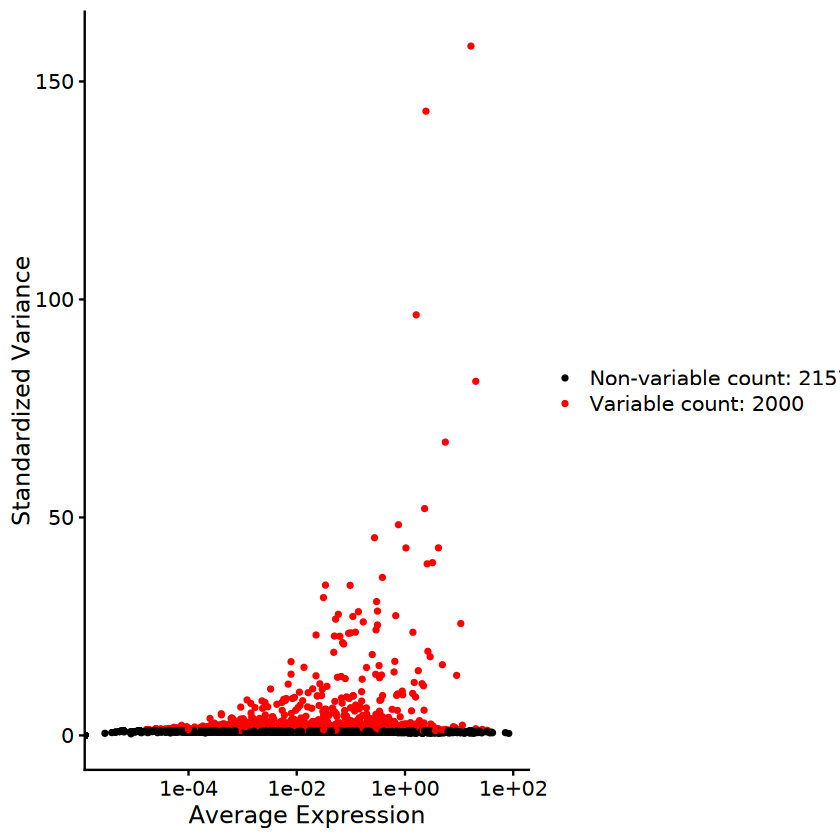

In [1]:
#LASSO REGRESSION
library(glmnet)
library(Seurat)
library(ggplot2)
library(grid)
library(dplyr)

Gene_of_interest <- list(c('HLA-DRA','HLA-DRB5','HLA-DRB1','HLA-DQA1','HLA-DQB1','HLA-DQA2','HLA-DQB2','HLA-DPA1','HLA-DPB1'))
load("/home/exacloud/gscratch/ShreeLab/FabianS/Jupyter/labeled-bcells.Robj")
pre_bcells <- subset(bcells, timepoint == "pre")
pre_Tumor.bcells <- subset(pre_bcells, new.ident == "Tumor Bcell")

pre_Tumor.bcells <- FindVariableFeatures(pre_Tumor.bcells)
test <- VariableFeaturePlot(object = pre_Tumor.bcells)
VariableFeaturePlot(object = pre_Tumor.bcells)

In [12]:
rownames(test$data)

[1] "MIR1302-2HG"      "AL627309.1"       "AL627309.3"      
    [4] "AL669831.2"       "AL669831.5"       "FAM87B"          
    [7] "LINC00115"        "FAM41C"           "AL645608.1"      
   [10] "SAMD11"           "NOC2L"            "KLHL17"          
   [13] "PLEKHN1"          "PERM1"            "AL645608.8"      
   [16] "HES4"             "ISG15"            "AL645608.2"      
   [19] "AGRN"             "AL645608.9"       "C1orf159"        
   [22] "LINC01342"        "AL390719.2"       "TTLL10"          
   [25] "TNFRSF18"         "TNFRSF4"          "SDF4"            
   [28] "B3GALT6"          "C1QTNF12"         "AL162741.1"      
   [31] "UBE2J2"           "LINC01786"        "SCNN1D"          
   [34] "ACAP3"            "PUSL1"            "INTS11"          
   [37] "CPTP"             "TAS1R3"           "DVL1"            
   [40] "MXRA8"            "AURKAIP1"         "CCNL2"           
   [43] "MRPL20"           "AL391244.3"       "ANKRD65"         
   [46] "LINC01770"        "VWA1"             "ATAD3C"          
   [49] "ATAD3B"           "ATAD3A"           "TMEM240"         
   [52] "SSU72"            "AL645728.1"       "FNDC10"          
   [55] "AL691432.2"       "MIB2"             "MMP23B"          
   [58] "CDK11B"           "FO704657.1"       "SLC35E2B"        
   [61] "CDK11A"           "SLC35E2A"         "NADK"            
   [64] "GNB1"             "AL109917.1"       "CALML6"          
   [67] "TMEM52"           "CFAP74"           "GABRD"           
   [70] "AL391845.1"       "PRKCZ"            "AL590822.2"      
   [73] "PRKCZ-AS1"        "FAAP20"           "SKI"             
   [76] "MORN1"            "RER1"             "PEX10"           
   [79] "PLCH2"            "PANK4"            "HES5"            
   [82] "AL139246.5"       "TNFRSF14-AS1"     "TNFRSF14"        
   [85] "AL139246.3"       "FAM213B"          "MMEL1"           
   [88] "TTC34"            "AC242022.1"       "PRDM16"          
   [91] "ARHGEF16"         "MEGF6"            "AL513320.1"      
   [94] "TPRG1L"           "WRAP73"           "TP73"            
   [97] "AL136528.1"       "SMIM1"            "LRRC47"          
  [100] "AL365330.1"       "CEP104"           "DFFB"            
  [103] "C1orf174"         "LINC01134"        "LINC01346"       
  [106] "AL805961.2"       "AJAP1"            "AL365255.1"      
  [109] "NPHP4"            "KCNAB2"           "CHD5"            
  [112] "RPL22"            "AL031847.1"       "RNF207"          
  [115] "ICMT"             "LINC00337"        "GPR153"          
  [118] "ACOT7"            "AL031848.2"       "HES2"            
  [121] "ESPN"             "TNFRSF25"         "PLEKHG5"         
  [124] "NOL9"             "TAS1R1"           "ZBTB48"          
  [127] "KLHL21"           "PHF13"            "THAP3"           
  [130] "DNAJC11"          "AL591163.1"       "CAMTA1-DT"       
  [133] "CAMTA1"           "AL365194.1"       "VAMP3"           
  [136] "PER3"             "Z98884.1"         "UTS2"            
  [139] "TNFRSF9"          "PARK7"            "AL034417.4"      
  [142] "AL034417.3"       "ERRFI1"           "AL034417.2"      
  [145] "SLC45A1"          "RERE"             "AL096855.1"      
  [148] "AL357552.2"       "ENO1"             "ENO1-AS1"        
  [151] "CA6"              "SLC2A7"           "SLC2A5"          
  [154] "GPR157"           "MIR34AHG"         "LINC01759"       
  [157] "H6PD"             "SPSB1"            "BX323043.1"      
  [160] "AL928921.2"       "SLC25A33"         "TMEM201"         
  [163] "PIK3CD"           "PIK3CD-AS1"       "PIK3CD-AS2"      
  [166] "CLSTN1"           "CTNNBIP1"         "LZIC"            
  [169] "NMNAT1"           "RBP7"             "UBE4B"           
  [172] "KIF1B"            "AL139424.3"       "AL139424.2"      
  [175] "PGD"              "AL139424.1"       "CENPS-CORT"      
  [178] "CENPS"            "CORT"             "DFFA"            
  [181] "AL354956.1"       "PEX14"            "CASZ1"           
  [184] "AL139423.1"       "C1orf127"  

In [33]:
test$data
test_genes <- rownames(test$data)
test$data["MS4A1", ]

,mean,variance.standardized,colors
,<dbl>,<dbl>,<chr>
MIR1302-2HG,5.592806e-05,0.9975928,no
AL627309.1,1.540711e-03,0.9138747,no
AL627309.3,9.942767e-05,0.9921917,no
AL669831.2,7.457075e-05,0.9948946,no
AL669831.5,5.177326e-02,0.9166582,no
FAM87B,2.506320e-04,1.0122939,no
LINC00115,1.389074e-02,0.8749076,no
FAM41C,1.030200e-02,0.8778447,no
AL645608.1,1.864269e-05,1.0122339,no


,mean,variance.standardized,colors
,<dbl>,<dbl>,<chr>
MS4A1,9.055796,0.8542129,no


In [32]:
"MS4A1" %in% coef_df$Gene
"MS4A1" %in% variable_genes
"MS4A1" %in% test_genes

[1] FALSE

[1] FALSE

[1] TRUE

In [15]:
print(head(coef_df))
coef_df
#ggsave(file_name, HLA_cor_plot, width = 20, height = 8, dpi = 600, limitsize = FALSE)

           Coefficient       Gene
ADAM2        0.4297951      ADAM2
LIFR-AS1     0.3595744   LIFR-AS1
CADM2        0.3384171      CADM2
AC113349.1   0.3283341 AC113349.1
B3GNT3       0.2241004     B3GNT3
KLK4         0.1924285       KLK4


,Coefficient,Gene
,<dbl>,<chr>
ADAM2,0.4297951,ADAM2
LIFR-AS1,0.3595744,LIFR-AS1
CADM2,0.3384171,CADM2
AC113349.1,0.3283341,AC113349.1
B3GNT3,0.2241004,B3GNT3
KLK4,0.1924285,KLK4
FAM178B,0.1918994,FAM178B
IGLV3-25,0.1708828,IGLV3-25
TRPM4,0.1653777,TRPM4


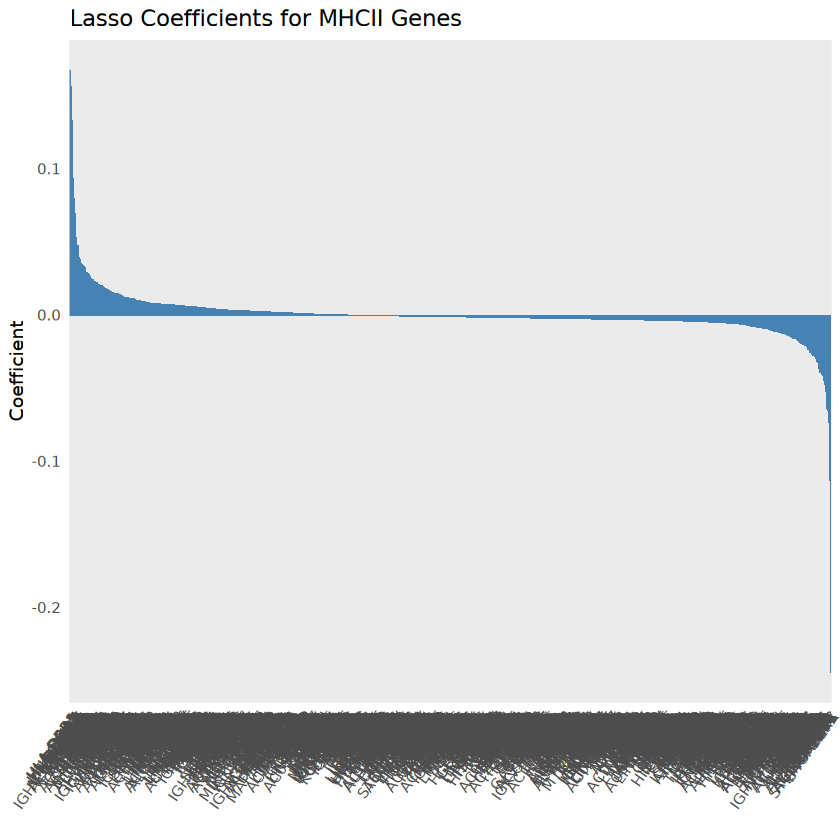

In [13]:
coef_df_filtered <- coef_df[coef_df$Coefficient != 0, ]

HLA_cor_plot <- ggplot(coef_df_filtered, aes(x = reorder(Gene, -Coefficient), y = Coefficient)) +
    geom_bar(stat = "identity", fill = "steelblue") +
    labs(title = "Lasso Coefficients for MHCII Genes",
            x = "", y = "Coefficient") +
    theme_minimal() +
    theme(axis.text.x = element_text(angle = 55, hjust = 1))
print(HLA_cor_plot)
file_name <- "test run?.jpeg"
ggsave(file_name, HLA_cor_plot, width = 150, height = 8, limitsize = FALSE)

In [28]:
genes <- Gene_of_interest  # List of response genes

test <- AddModuleScore(
  object = bcells,
  features = Gene_of_interest,
  name = 'MHCII_Genes'
)

# Rename module score columns
colnames(test@meta.data)[(ncol(test@meta.data) - length(Gene_of_interest) + 1):ncol(test@meta.data)] <- 
  paste0(sapply(Gene_of_interest, function(x) paste(x, collapse = "_")), "_score")

# Get the score column names
score_cols <- paste0(sapply(Gene_of_interest, function(x) paste(x, collapse = "_")), "_score")

# Use the first score column (if only one module)
y <- as.numeric(test@meta.data[[score_cols[1]]])

# Exclude response genes from predictors
expr_data <- bcells@assays$RNA$data
expr_data <- expr_data[!rownames(expr_data) %in% unlist(Gene_of_interest), ]
x <- t(as.matrix(expr_data))  # cells as rows

# Run Lasso regression
library(glmnet)
cv_model <- cv.glmnet(x = x, y = y, alpha = 1)
best_lambda <- cv_model$lambda.min

plot(cv_model)

best_model <- glmnet(x, y, alpha = 1, lambda = best_lambda)

# Extract coefficients
coef_df <- as.data.frame(as.matrix(coef(best_model)))
coef_df$Gene <- rownames(coef_df)
colnames(coef_df)[1] <- "Coefficient"

# Remove intercept and sort
coef_df <- coef_df[coef_df$Gene != "(Intercept)", ]
coef_df <- coef_df[order(-coef_df$Coefficient), ]

# Plot
ggplot(coef_df, aes(x = reorder(Gene, -Coefficient), y = Coefficient)) +
  geom_bar(stat = "identity", fill = "steelblue") +
  labs(title = "Lasso Coefficients Predicting Module Score",
       x = "", y = "Coefficient") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 31.9 GiB”


: 

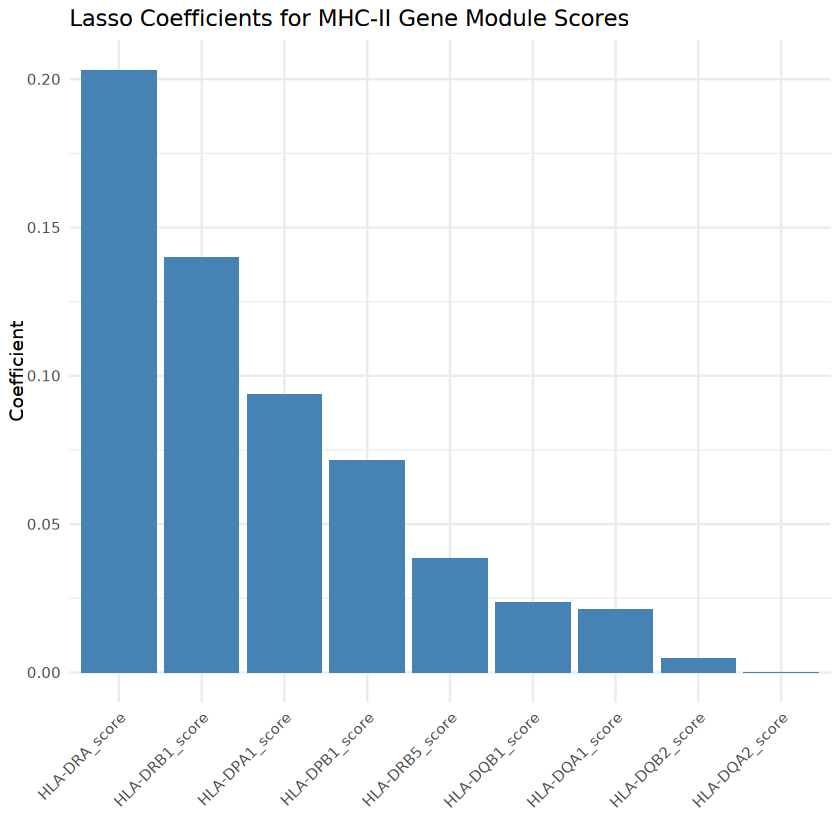

In [42]:
# Extract coefficients and convert to data frame
coef_df <- as.data.frame(as.matrix(coef(best_model)))
coef_df$Gene <- rownames(coef_df)
colnames(coef_df)[1] <- "Coefficient"

# Remove the intercept
coef_df <- coef_df[coef_df$Gene != "(Intercept)", ]

# Order by descending coefficient value
coef_df <- coef_df[order(-coef_df$Coefficient), ]

# Load ggplot2
library(ggplot2)

# Create barplot
ggplot(coef_df, aes(x = reorder(Gene, -Coefficient), y = Coefficient)) +
  geom_bar(stat = "identity", fill = "steelblue") +
  labs(title = "Lasso Coefficients for MHC-II Gene Module Scores",
       x = "", y = "Coefficient") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

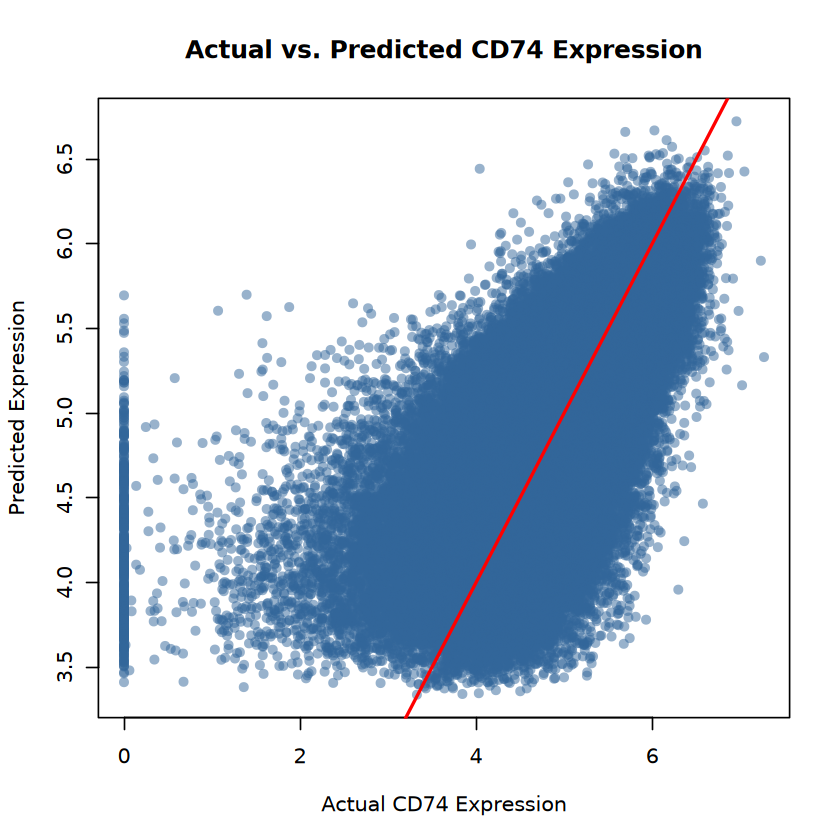

In [41]:
# 1. Make predictions
predictions <- predict(best_model, newx = x)

# 2. Convert predictions to a numeric vector
predicted_values <- as.numeric(predictions)

# 3. Get actual values (assumes your response variable was a gene like "HLA-DRA")
actual_values <- as.numeric(bcells@assays$RNA$data["CD74", ])

# 4. Plot predicted vs. actual
plot(actual_values, predicted_values,
     xlab = "Actual CD74 Expression",
     ylab = "Predicted Expression",
     main = "Actual vs. Predicted CD74 Expression",
     pch = 16, col = rgb(0.2, 0.4, 0.6, 0.5))
abline(0, 1, col = "red", lwd = 2)


Finding variable features for layer counts

When using repel, set xnudge and ynudge to 0 for optimal results

Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”
Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”


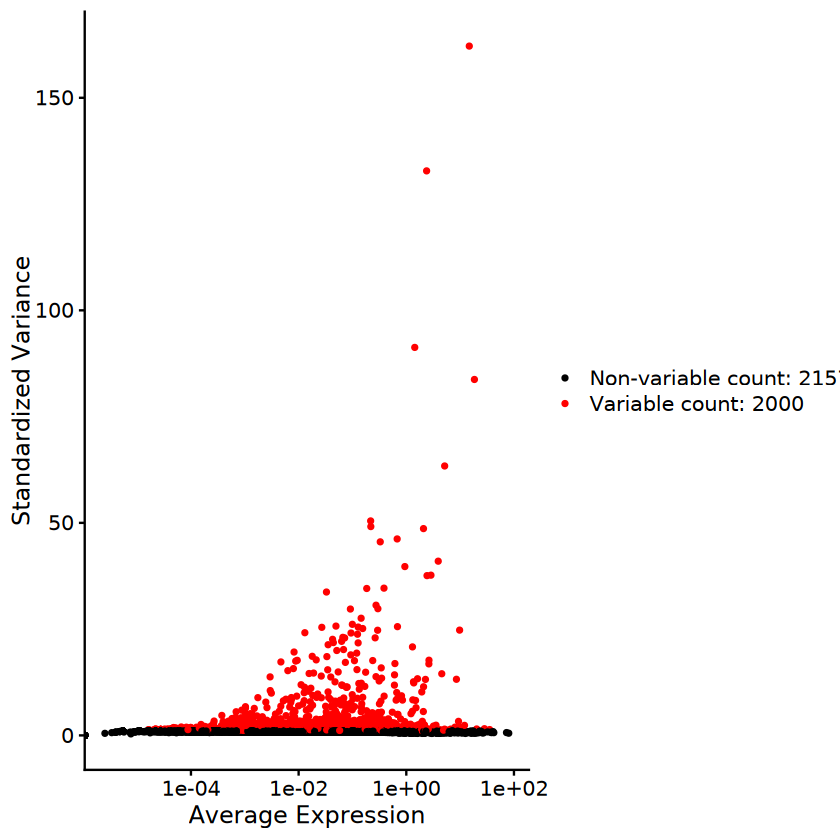

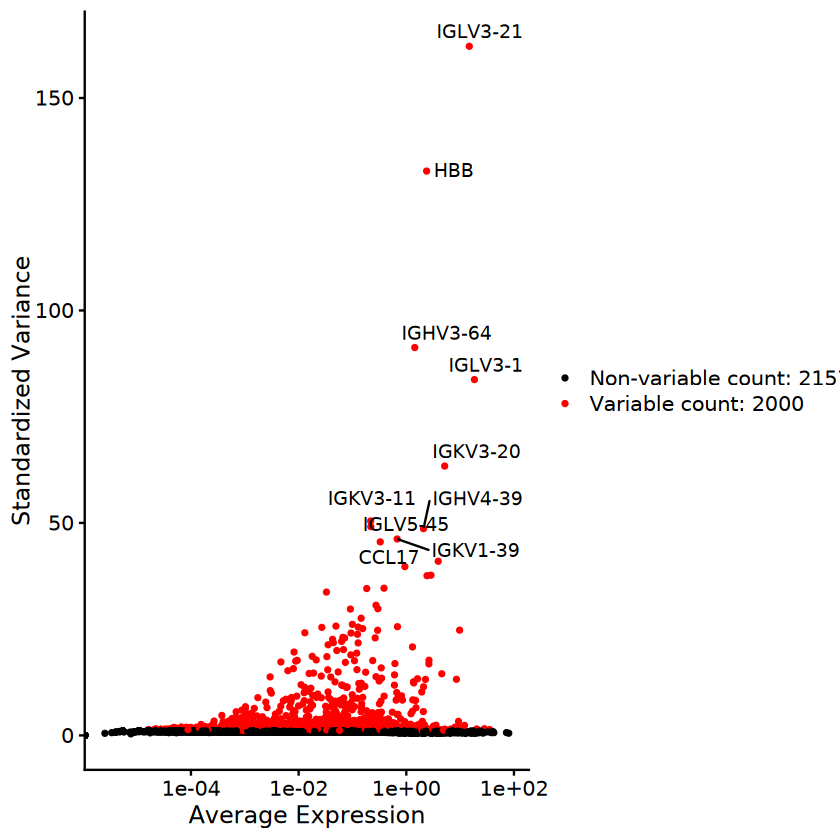

In [2]:
test2 <- FindVariableFeatures(bcells, nfeatures = 2000)

# Identify the 10 most highly variable genes
top10 <- head(VariableFeatures(test2), 10)

plot1 <- VariableFeaturePlot(test2)
plot2 <- LabelPoints(plot = plot1, points = top10, repel = TRUE)

plot1
plot2

In [6]:
#plot1$data
high_variable_genes_df <- subset(variable_genes$data, colors == 'yes' & mean > 1e+00)
high_variable_genes_df <- high_variable_genes_df[!grepl("RPL|MT-", rownames(high_variable_genes_df)), ]
rownames(high_variable_genes_df)

[1] "RPL22"     "RPL11"     "SH3BGRL3"  "CD52"      "HMGN2"     "ATP5IF1"  
  [7] "LAPTM5"    "MARCKSL1"  "YBX1"      "RPS8"      "PRDX1"     "UQCRH"    
 [13] "JUN"       "GNG5"      "RPL5"      "CD53"      "RPS27"     "TPM3"     
 [19] "SSR2"      "TAGLN2"    "FCRLA"     "RCSD1"     "RALGPS2"   "RGS13"    
 [25] "PTPRC"     "BTG2"      "FCMR"      "H3F3A"     "PARP1"     "HNRNPU"   
 [31] "RPS7"      "OST4"      "SRSF7"     "ZFP36L2"   "CALM2"     "RPS27A"   
 [37] "BCL11A"    "REL"       "PCBP1"     "TMSB10"    "IGKC"      "IGKV4-1"  
 [43] "IGKV1-5"   "IGKV3-20"  "COX5B"     "RPL31"     "ACTR3"     "DBI"      
 [49] "CXCR4"     "ATP5MC3"   "HNRNPA3"   "STK17B"    "EEF1B2"    "RPL37A"   
 [55] "ARPC2"     "NCL"       "PTMA"      "BRK1"      "RPL32"     "RPL15"    
 [61] "RPSA"      "RPL14"     "TMA7"      "RHOA"      "RPL29"     "FOXP1"    
 [67] "MTRNR2L12" "RPL24"     "HCLS1"     "CNBP"      "SERP1"     "MBNL1"    
 [73] "SEC62"     "RPL22L1"   "EIF4A2"    "APOD"      "RPL35A"    "RPL9"     
 [79] "SMIM14"    "RHOH"      "JCHAIN"    "CCNI"      "HNRNPDL"   "H2AFZ"    
 [85] "BANK1"     "UBE2D3"    "RPL34"     "C4orf3"    "RPS3A"     "RPL37"    
 [91] "BTF3"      "RPS23"     "COX7C"     "MEF2C"     "HINT1"     "SKP1"     
 [97] "MZB1"      "UBE2D2"    "CD74"      "RPS14"     "NPM1"      "DUSP1"    
[103] "ATP6V0E1"  "RACK1"     "CD83"      "HIST1H4C"  "HLA-A"     "HLA-E"    
[109] "TUBB"      "HLA-C"     "HLA-B"     "LTB"       "CLIC1"     "HLA-DRA"  
[115] "HLA-DRB5"  "HLA-DRB1"  "HLA-DQA1"  "HLA-DQB1"  "HLA-DQA2"  "PSMB8"    
[121] "PSMB9"     "HLA-DMB"   "HLA-DMA"   "HLA-DPA1"  "HLA-DPB1"  "RPS18"    
[127] "RPL10A"    "HSP90AB1"  "EEF1A1"    "COX7A2"    "PNRC1"     "UBE2J1"   
[133] "BACH2"     "PNISR"     "CD24"      "SNX3"      "RPS12"     "EZR"      
[139] "ACTB"      "NDUFA4"    "TOMM7"     "HNRNPA2B1" "SEPT7"     "STK17A"   
[145] "PPIA"      "CHCHD2"    "NCF1"      "TMEM243"   "ATP5MF"    "STAG3"    
[151] "SYPL1"     "SLC25A6"   "TMSB4X"    "SAT1"      "EIF2S3"    "NDUFB11"  
[157] "UXT"       "RBM3"      "RPS4X"     "SH3BGRL"   "RPL36A"    "TSC22D3"  
[163] "SLC25A5"   "SEPT6"     "RPL39"     "NDUFA1"    "SSR4"      "RPL10"    
[169] "SARAF"     "TCEA1"     "LYN"       "RPL7"      "UQCRB"     "MTDH"     
[175] "RPL30"     "COX6C"     "PABPC1"    "YWHAZ"     "EIF3E"     "EIF3H"    
[181] "EEF1D"     "RPL8"      "RPS6"      "HNRNPK"    "SYK"       "ANP32B"   
[187] "SEC61B"    "ATP6V1G1"  "RPL35"     "RPL12"     "RPL7A"     "EDF1"     
[193] "RPLP2"     "LSP1"      "HBB"       "EIF3F"     "RPL27A"    "SWAP70"   
[199] "MTRNR2L8"  "EIF4G2"    "RPS13"     "SELENOH"   "MS4A1"     "FTH1"     
[205] "COX8A"     "TRMT112"   "SF1"       "FAU"       "MALAT1"    "CFL1"     
[211] "POLD4"     "PPP1CA"    "GSTP1"     "UCP2"      "RPS3"      "ATP5MG"   
[217] "RPS25"     "HSPA8"     "KLF6"      "GDI2"      "VIM"       "ANAPC16"  
[223] "RPS24"     "GAPDH"     "TPI1"      "CD69"      "ARHGDIB"   "LDHB"     
[229] "LRMP"      "TUBA1B"    "TMBIM6"    "DAZAP2"    "EIF4B"     "PFDN5"    
[235] "PRR13"     "PCBP2"     "ATP5MC2"   "HNRNPA1"   "RPS26"     "RPL41"    
[241] "MYL6"      "ATP5F1B"   "NACA"      "BTG1"      "SLC25A3"   "HSP90B1"  
[247] "ARPC3"     "HVCN1"     "ERP29"     "RPL6"      "PEBP1"     "RPLP0"    
[253] "COX6A1"    "DYNLL1"    "UBC"       "RAN"       "RPL21"     "HMGB1"    
[259] "ALOX5AP"   "TPT1"      "LCP1"      "COMMD6"    "ARGLU1"    "HNRNPC"   
[265] "PSME1"     "RPS29"     "RPL36AL"   "ZFP36L1"   "ERH"       "SRSF5"    
[271] "FOS"       "CALM1"     "TCL1A"     "HSP90AA1"  "IGHE"      "IGHM"     
[277] "IGHV3-15"  "IGHV4-34"  "IGHV4-39"  "IGHV3-48"  "IGHV3-64"  "SRP14"    
[283] "SERF2"     "B2M"       "PPIB"      "RPL4"      "RPLP1"     "PKM"      
[289] "CTSH"      "ISG20"     "RPS2"      "ELOB"      "RPS15A"    "IL4R"     
[295] "CD19"      "ALDOA"     "CORO1A"    "FUS"       "HERPUD1"   "COTL1"    
[301] "COX4I1"    "IRF8"      "CYBA"      "RPL13"     "PFN1"      "GABARAP"  
[307] "RPL26"     "UBB" 

In [7]:
high_variable_genes_df <- high_variable_genes_df[!grepl("RPL|MT-", rownames(high_variable_genes_df)), ]
rownames(high_variable_genes_df)

[1] "SH3BGRL3"  "CD52"      "HMGN2"     "ATP5IF1"   "LAPTM5"    "MARCKSL1" 
  [7] "YBX1"      "RPS8"      "PRDX1"     "UQCRH"     "JUN"       "GNG5"     
 [13] "CD53"      "RPS27"     "TPM3"      "SSR2"      "TAGLN2"    "FCRLA"    
 [19] "RCSD1"     "RALGPS2"   "RGS13"     "PTPRC"     "BTG2"      "FCMR"     
 [25] "H3F3A"     "PARP1"     "HNRNPU"    "RPS7"      "OST4"      "SRSF7"    
 [31] "ZFP36L2"   "CALM2"     "RPS27A"    "BCL11A"    "REL"       "PCBP1"    
 [37] "TMSB10"    "IGKC"      "IGKV4-1"   "IGKV1-5"   "IGKV3-20"  "COX5B"    
 [43] "ACTR3"     "DBI"       "CXCR4"     "ATP5MC3"   "HNRNPA3"   "STK17B"   
 [49] "EEF1B2"    "ARPC2"     "NCL"       "PTMA"      "BRK1"      "RPSA"     
 [55] "TMA7"      "RHOA"      "FOXP1"     "MTRNR2L12" "HCLS1"     "CNBP"     
 [61] "SERP1"     "MBNL1"     "SEC62"     "EIF4A2"    "APOD"      "SMIM14"   
 [67] "RHOH"      "JCHAIN"    "CCNI"      "HNRNPDL"   "H2AFZ"     "BANK1"    
 [73] "UBE2D3"    "C4orf3"    "RPS3A"     "BTF3"      "RPS23"     "COX7C"    
 [79] "MEF2C"     "HINT1"     "SKP1"      "MZB1"      "UBE2D2"    "CD74"     
 [85] "RPS14"     "NPM1"      "DUSP1"     "ATP6V0E1"  "RACK1"     "CD83"     
 [91] "HIST1H4C"  "HLA-A"     "HLA-E"     "TUBB"      "HLA-C"     "HLA-B"    
 [97] "LTB"       "CLIC1"     "HLA-DRA"   "HLA-DRB5"  "HLA-DRB1"  "HLA-DQA1" 
[103] "HLA-DQB1"  "HLA-DQA2"  "PSMB8"     "PSMB9"     "HLA-DMB"   "HLA-DMA"  
[109] "HLA-DPA1"  "HLA-DPB1"  "RPS18"     "HSP90AB1"  "EEF1A1"    "COX7A2"   
[115] "PNRC1"     "UBE2J1"    "BACH2"     "PNISR"     "CD24"      "SNX3"     
[121] "RPS12"     "EZR"       "ACTB"      "NDUFA4"    "TOMM7"     "HNRNPA2B1"
[127] "SEPT7"     "STK17A"    "PPIA"      "CHCHD2"    "NCF1"      "TMEM243"  
[133] "ATP5MF"    "STAG3"     "SYPL1"     "SLC25A6"   "TMSB4X"    "SAT1"     
[139] "EIF2S3"    "NDUFB11"   "UXT"       "RBM3"      "RPS4X"     "SH3BGRL"  
[145] "TSC22D3"   "SLC25A5"   "SEPT6"     "NDUFA1"    "SSR4"      "SARAF"    
[151] "TCEA1"     "LYN"       "UQCRB"     "MTDH"      "COX6C"     "PABPC1"   
[157] "YWHAZ"     "EIF3E"     "EIF3H"     "EEF1D"     "RPS6"      "HNRNPK"   
[163] "SYK"       "ANP32B"    "SEC61B"    "ATP6V1G1"  "EDF1"      "LSP1"     
[169] "HBB"       "EIF3F"     "SWAP70"    "MTRNR2L8"  "EIF4G2"    "RPS13"    
[175] "SELENOH"   "MS4A1"     "FTH1"      "COX8A"     "TRMT112"   "SF1"      
[181] "FAU"       "MALAT1"    "CFL1"      "POLD4"     "PPP1CA"    "GSTP1"    
[187] "UCP2"      "RPS3"      "ATP5MG"    "RPS25"     "HSPA8"     "KLF6"     
[193] "GDI2"      "VIM"       "ANAPC16"   "RPS24"     "GAPDH"     "TPI1"     
[199] "CD69"      "ARHGDIB"   "LDHB"      "LRMP"      "TUBA1B"    "TMBIM6"   
[205] "DAZAP2"    "EIF4B"     "PFDN5"     "PRR13"     "PCBP2"     "ATP5MC2"  
[211] "HNRNPA1"   "RPS26"     "MYL6"      "ATP5F1B"   "NACA"      "BTG1"     
[217] "SLC25A3"   "HSP90B1"   "ARPC3"     "HVCN1"     "ERP29"     "PEBP1"    
[223] "COX6A1"    "DYNLL1"    "UBC"       "RAN"       "HMGB1"     "ALOX5AP"  
[229] "TPT1"      "LCP1"      "COMMD6"    "ARGLU1"    "HNRNPC"    "PSME1"    
[235] "RPS29"     "ZFP36L1"   "ERH"       "SRSF5"     "FOS"       "CALM1"    
[241] "TCL1A"     "HSP90AA1"  "IGHE"      "IGHM"      "IGHV3-15"  "IGHV4-34" 
[247] "IGHV4-39"  "IGHV3-48"  "IGHV3-64"  "SRP14"     "SERF2"     "B2M"      
[253] "PPIB"      "PKM"       "CTSH"      "ISG20"     "RPS2"      "ELOB"     
[259] "RPS15A"    "IL4R"      "CD19"      "ALDOA"     "CORO1A"    "FUS"      
[265] "HERPUD1"   "COTL1"     "COX4I1"    "IRF8"      "CYBA"      "PFN1"     
[271] "GABARAP"   "UBB"       "EIF1"      "LIMD2"     "CD79B"     "DDX5"     
[277] "SUMO2"     "GRB2"      "H3F3B"     "SEPT9"     "SYNGR2"    "ACTG1"    
[283] "MYL12A"    "MYL12B"    "TCF4"      "BCL2"      "RBM39"     "YWHAB"    
[289] "ZFAS1"     "BCAS4"     "ATP5F1E"   "PSMA7"     "RPS21"     "PPDPF"    
[295] "ATP5F1D"   "CIRBP"     "RPS15"     "UQCR11"    "OAZ1"      "LSM7"     
[301] "EEF2"      "RPS28"     "UBL5"      "TRIR"      "JUNB"      "CALR"     
[307] "UBA52"     "FXYD5

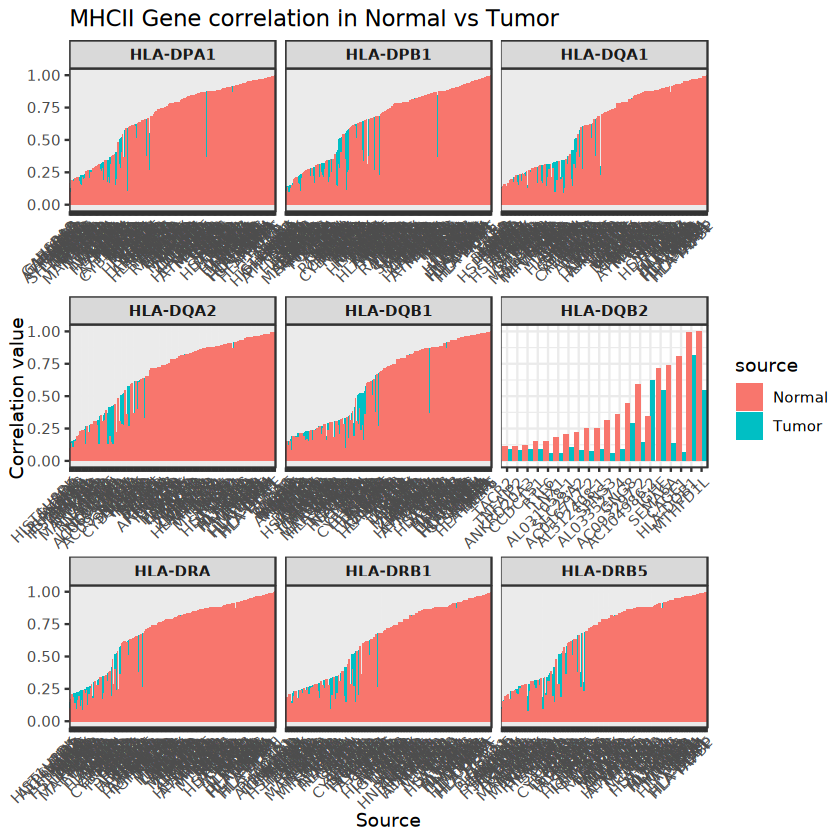

In [2]:
library(Seurat)
library(Seurat.utils)
library(ggplot2)
library(grid)
library(dplyr)
library(ggpubr)

load("/home/exacloud/gscratch/ShreeLab/FabianS/Jupyter/Tumor Correlation Data for MHCII Genes.Robj")
load("/home/exacloud/gscratch/ShreeLab/FabianS/Jupyter/Normal Correlation Data for MHCII Genes.Robj")

Gene_of_interest <- c('HLA-DRA','HLA-DRB5','HLA-DRB1','HLA-DQA1','HLA-DQB1','HLA-DQA2','HLA-DQB2','HLA-DPA1','HLA-DPB1')
patient_colors <- c(
  "30021" = "blue", "30134" = "red", "31247" = "green", "31654" = "yellow", 
  "32892" = "purple", "33464" = "orange", "34842" = "brown", "35476" = "pink", 
  "36312" = "cyan", "36482" = "magenta", "36510" = "red", "36552" = "teal", 
  "36638" = "gold", "36840" = "violet", "36876" = "indigo", "37165" = "gray", 
  "37170" = "darkgreen", "37293" = "darkred", "37374" = "lightblue", "38061" = "salmon"
)

Tumor.data <- do.call(rbind, T_cor_data)
Normal.data <- do.call(rbind, N_cor_data)
Tumor.data$source <- "Tumor"
Normal.data$source <- "Normal"

#combined_data <- rbind(Tumor_combined, Normal_combined)
all_big_unions <- list()  # to collect each big_union

for (gene in Gene_of_interest) {
  tumor.gene <- subset(Tumor.data, Gene_of_interest == gene)
  normal.gene <- subset(Normal.data, Gene_of_interest == gene)

  shared_genes <- intersect(normal.gene$Gene, tumor.gene$Gene)

  union1 <- Tumor.data[Tumor.data$Gene %in% shared_genes, ]
  union2 <- Normal.data[Normal.data$Gene %in% shared_genes, ]

  big_union <- bind_rows(union1, union2)
  big_union$Gene_of_interest <- gene  # tag with the current gene

  all_big_unions[[gene]] <- big_union
}

# Combine all into one final data frame
final_big_union_df <- bind_rows(all_big_unions)
# Reorder Gene based on Correlation
final_big_union_df$Gene <- reorder(final_big_union_df$Gene, final_big_union_df$Correlation, FUN = max)

# Now plot
plot <- ggplot(final_big_union_df, aes(x = Gene, y = Correlation, fill = source)) +
  geom_bar(stat = "identity", position = "dodge") + 
  #geom_jitter(aes(color = Patient), width = 0.2, size = 0.75, alpha = 0.6) +
  #scale_color_manual(values = patient_colors) +
  facet_wrap(~Gene_of_interest, scales = "free_x", ncol = 3) +
  theme_bw() +
  theme(
    strip.text = element_text(face = "bold"),
    axis.text.x = element_text(angle = 45, hjust = 1)
  ) +
  labs(y = "Correlation value", x = "Source", title = "MHCII Gene correlation in Normal vs Tumor")

plot

source,Gene_of_interest,Gene,n_patients
<chr>,<chr>,<chr>,<int>
Normal,HLA-DPA1,ACTB,8
Normal,HLA-DPA1,ARPC3,5
Normal,HLA-DPA1,B2M,9
Normal,HLA-DPA1,CD72,8
Normal,HLA-DPA1,CD74,17
Normal,HLA-DPA1,CD79A,7


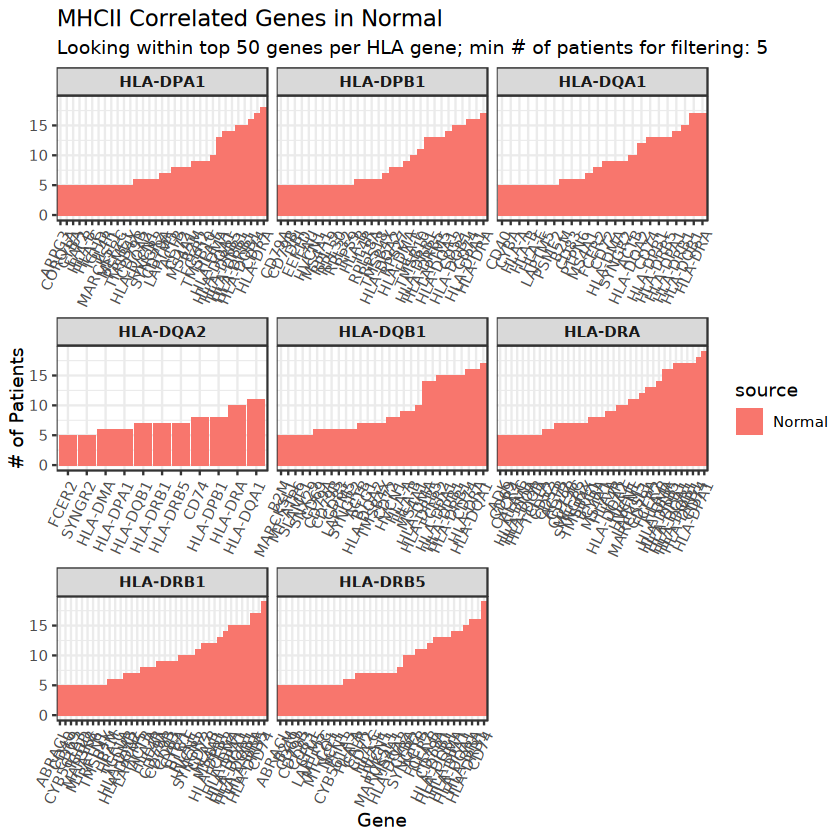

In [24]:
library(dplyr)
library(Seurat)
library(Seurat.utils)
library(ggplot2)
library(grid)
library(dplyr)
library(ggpubr)
library(forcats)

#load("/home/exacloud/gscratch/ShreeLab/FabianS/Jupyter/Tumor Correlation Data for MHCII Genes.Robj")
#load("/home/exacloud/gscratch/ShreeLab/FabianS/Jupyter/Normal Correlation Data for MHCII Genes.Robj")

Gene_of_interest <- c('HLA-DRA','HLA-DRB5','HLA-DRB1','HLA-DQA1','HLA-DQB1','HLA-DQA2','HLA-DQB2','HLA-DPA1','HLA-DPB1')

Tumor.data <- do.call(rbind, T_cor_data)
Normal.data <- do.call(rbind, N_cor_data)
Tumor.data$source <- "Tumor"
Normal.data$source <- "Normal"

combined_data <- rbind(Tumor.data, Normal.data)
#print(ceombined_data)

df_summary <- combined_data %>%
  group_by(source, Gene_of_interest, Gene) %>%
  summarise(n_patients = n_distinct(Patient), .groups = "drop") %>%
  ungroup()

df_summary <- subset(df_summary, n_patients > 4)
df_summary <- subset(df_summary, source == "Normal")

test <- subset(df_summary, Gene_of_interest == "HLA-DPA1")
head(test)

# Reorder Gene based on Correlation
#df_summary$Gene <- reorder(df_summary$Gene, df_summary$n_patients, FUN = mean)
df_summary <- df_summary %>%
  mutate(Gene_facet = paste(Gene, Gene_of_interest, sep = "_")) %>%
  group_by(Gene_of_interest) %>%
  mutate(Gene_facet = fct_reorder(Gene_facet, n_patients)) %>%
  ungroup()
# Now plot
plot <- ggplot(df_summary, aes(x = Gene_facet, y = n_patients, fill = source)) +
  geom_bar(stat = "identity", position = "dodge") +
  #scale_fill_manual(values = c('#00BFC4'), guide = FALSE)+
  facet_wrap(~Gene_of_interest, scales = "free_x", ncol = 3) +
  scale_x_discrete(labels = function(x) gsub("_(.*)", "", x)) +  # clean labels
  theme_bw() +
  theme(
    strip.text = element_text(face = "bold"),
    axis.text.x = element_text(angle = 65, hjust = 1)
  ) +
  labs(
    y = "# of Patients",
    x = "Gene",
    title = "MHCII Correlated Genes in Normal",
    subtitle = "Looking within top 50 genes per HLA gene; min # of patients for filtering: 5"
  )

plot
ggsave("MHCII Gene Correlation Patients Filtered Normal.png", plot, width = 24, height = 10)
#ggsave("MHCII Gene Correlation Patients Unfiltered.png", plot, width = 24, height = 10)

In [28]:
#NOW MAKE A PLOT FOR ACH HLA WHERE YOU FACET BY THE TOP 50 GENES FROM PLOT ABOVE AND DO CORRELATIONS FOR THEM!
wk_data <- plot$data
y_var <- unique(wk_data$Gene_of_interest)
for(HLA in y_var){
    test <- subset(plot, Gene_of_interest == HLA)
    x_var <- unique(plot$data$Gene)

    plot <- ggplot(df_summary, aes(x = Gene_facet, y = n_patients, fill = source)) +
    geom_bar(stat = "identity", position = "dodge") +
    #scale_fill_manual(values = c('#00BFC4'), guide = FALSE)+
    facet_wrap(~Gene_of_interest, scales = "free_x", ncol = 3) +
    scale_x_discrete(labels = function(x) gsub("_(.*)", "", x)) +  # clean labels
    theme_bw() +
    theme(strip.text = element_text(face = "bold"),axis.text.x = element_text(angle = 65, hjust = 1)) +
    labs(y = "# of Patients",x = "Gene",title = "MHCII Correlated Genes in Normal",subtitle = "Looking within top 50 genes per HLA gene; min # of patients for filtering: 5")
    plot
}

[1] "ACTB"     "ARPC3"    "B2M"      "CD72"     "CD74"     "CD79A"   
 [7] "CD79B"    "CORO1A"   "CYBA"     "EAF2"     "FCER2"    "HLA-B"   
[13] "HLA-C"    "HLA-DMA"  "HLA-DPB1" "HLA-DQA1" "HLA-DQA2" "HLA-DQB1"
[19] "HLA-DRA"  "HLA-DRB1" "HLA-DRB5" "HLA-E"    "HVCN1"    "IGHD"    
[25] "IL4R"     "LAPTM5"   "MARCKSL1" "MEF2C"    "MS4A1"    "PSME1"   
[31] "SYNGR2"   "TMSB10"   "TMSB4X"   "CD52"     "DBI"      "EEF1D"   
[37] "FAU"      "HLA-DPA1" "RPL18A"   "RPL19"    "RPL30"    "RPL32"   
[43] "RPS18"    "RPS27"    "RPS9"     "CD40"     "CD83"     "HLA-A"   
[49] "PSME2"    "PTPN6"    "BTG1"     "CD69"     "MT-ATP6"  "SLAMF1"  
[55] "SNX29"    "ADK"      "CD53"     "CXCR4"    "HLA-DMB"  "HLA-DOA" 
[61] "HLA-DOB"  "TCL1A"    "ABRACL"   "CYB561A3" "MAP3K8"   "RFTN1"   
[67] "CALR"     "CFL1"     "MT-CO1"   "NCF1"     "PFN1"

In [32]:
library(tidyr)
library(Seurat)
library(dplyr)

#load("/home/exacloud/gscratch/ShreeLab/FabianS/Jupyter/labeled-bcells.Robj")
print("B-cells loaded")

wk_data <- plot$data
pre_bcells <- subset(bcells, timepoint == 'pre')
gene_of_int <- "HLA-DRA"
gene_set <- unique(plot$data$Gene)  # your gene set

# Combine all genes needed
all_genes <- unique(c(gene_of_int, gene_set))

# Extract expression values for these genes (use normalized data)
expr_mat <- FetchData(pre_bcells, vars = all_genes)
# Rename gene of interest column for clarity in reshaping
expr_df <- expr_mat %>%
  tibble::rownames_to_column("cell") %>%
  rename(y_expr = !!gene_of_int) %>%
  pivot_longer(cols = all_of(gene_set), names_to = "gene", values_to = "x_expr")

ggplot(expr_df, aes(x = x_expr, y = y_expr)) +
  geom_point(alpha = 0.4) +
  geom_smooth(method = "lm", se = FALSE, color = "blue") +
  facet_wrap(~ Gene, scales = "free_x") +
  labs(
    x = "Expression of gene in gene_set2",
    y = paste("Expression of", gene_of_int),
    title = paste("Correlation of", gene_of_int, "with gene_set2")
  ) +
  theme_minimal()

[1] "B-cells loaded"


,HLA-DRA,ACTB,ARPC3,B2M,CD72,CD74,CD79A,CD79B,CORO1A,CYBA,⋯,TCL1A,ABRACL,CYB561A3,MAP3K8,RFTN1,CALR,CFL1,MT-CO1,NCF1,PFN1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
30021_lesA_pre-AAACCTGAGCTGATAA,3.570526,4.696049,2.530013,3.971578,0.000000,5.347611,2.317991,2.703632,2.700880,2.064833,⋯,3.192871,1.719726,2.078934,0.000000,1.728140,2.073973,2.692636,4.431480,2.327664,3.434941
30021_lesA_pre-AAACCTGCACGGCCAT,3.043481,5.158084,2.210068,2.319598,1.243875,2.886019,0.000000,1.195850,2.685186,0.000000,⋯,1.051493,1.305876,0.000000,0.000000,0.000000,0.000000,3.744349,0.000000,1.807494,3.341070
30021_lesA_pre-AAACCTGCAGACGCAA,0.000000,3.912873,2.024820,3.841200,0.000000,4.295327,3.395970,3.031485,1.439261,1.441612,⋯,2.297662,0.000000,0.000000,1.459518,0.000000,1.463712,2.658052,3.799514,2.865571,2.370105
30021_lesA_pre-AAACCTGGTATAATGG,4.646430,5.019671,2.332004,4.794489,2.336377,5.281078,3.006122,2.745738,2.335777,3.313366,⋯,1.270871,1.891169,2.136729,2.142518,1.040742,2.893462,3.073618,4.368963,2.484698,2.870081
30021_lesA_pre-AAACCTGGTCATGCCG,4.174412,4.043301,2.030851,4.347581,1.420650,5.651706,3.806451,3.203543,2.402037,3.054494,⋯,2.404657,2.047662,2.045034,0.000000,0.000000,0.000000,0.000000,4.690295,2.882348,3.042129
30021_lesA_pre-AAACCTGGTTCCAACA,4.202881,3.940134,2.713538,3.317166,0.000000,5.314098,3.774166,3.101893,2.542426,2.988987,⋯,3.204589,0.000000,0.000000,0.000000,0.000000,0.000000,3.197296,3.852139,2.339238,1.661184


ERROR: [1m[33mError[39m in `pivot_longer()`:[22m
[1m[22m[36mℹ[39m In argument: `all_of(gene_set)`.
[1mCaused by error in `all_of()`:[22m
[33m![39m Can't subset elements that don't exist.
[31m✖[39m Element `HLA-DRA` doesn't exist.


In [ ]:
gene1 <- FetchData(pre_bcells, vars = "HLA-DRA")
gene2 <- FetchData(pre_bcells, vars = gene_set)

# Combine the gene expression data into a data frame
data <- data.frame(Gene1 = gene1, Gene2 = gene2)

#Calculate Pearson and Spearman correlation values
pearson_corr <- cor(data$HLA.DRA, data$CD74, method = "pearson")
spearman_corr <- cor(data$HLA.DRA, data$CD74, method = "spearman")

# Create the scatter plot with a linear regression line and correlation values
scatter <- ggplot(data, aes(x = HLA.DRA, y = CD74)) +
geom_point() +
geom_smooth(method = "lm", col = "red") +
labs(x = "HLA-DRA Expression", y = "CD74 Expression", title = "Scatter Plot with Linear Regression Line") +
annotate("text", x = Inf, y = 2, label = paste("Pearson:", round(pearson_corr, 2)), hjust = 1.1, vjust = 2, size = 5, color = "blue") +
annotate("text", x = Inf, y = 2, label = paste("Spearman:", round(spearman_corr, 2)), hjust = 1.1, vjust = 3.5, size = 5, color = "red")

print(scatter)

In [ ]:
library(Seurat)
library(Seurat.utils)
library(ggplot2)
library(grid)
library(dplyr)
library(ggpubr)
library(rstatix)
library(matrixStats)
library(Matrix)
library(BiocParallel)
library(parallel)

FindCorrelatedGenes <- function(
  gene = gene, obj = obj, assay = "RNA", slot = "data",
  HEonly = FALSE, minExpr = 1, minCells = 200,
  trailingNgenes = 100) {
  
  tictoc::tic("FindCorrelatedGenes")
  
  # Extract the assay data
  AssayData <- GetAssayData(object = obj, assay = assay, slot = slot)
  
  # Remove genes with zero variance
  variances <- apply(AssayData, 1, var)
  AssayData <- AssayData[variances != 0, ]
  
  gene1 <- FetchData(Tumor1, vars = "HLA-DRA")
  gene2 <- FetchData(Tumor1, vars = "CD74")

  # Combine the gene expression data into a data frame
  data <- data.frame(Gene1 = gene1, Gene2 = gene2)


  # Compute correlations in parallel
  correlations <- mclapply(1:nrow(matrix_mod), function(i) cor(matrix_mod[i, ], geneExpr, method = "spearman"), mc.cores = 3)
  pearson_corr <- cor(data$HLA.DRA, data$CD74, method = "pearson")
  rm(geneExpr)
  # Create a data frame with gene names and their correlation values
  correlation_df <- data.frame(
    Gene = rownames(matrix_mod),
    Correlation = unlist(correlations)
  )

  rm(matrix_mod)
  
  # Sort by correlation values in decreasing order and select the top genes
  topGenes <- head(correlation_df[order(-correlation_df$Correlation), ], n = trailingNgenes)
  
  tictoc::toc()
  
  # Generate a bar plot of the top genes (limit to top 50 genes)
  top50 <- head(topGenes, 51)  # Select top 50 genes
  top50 <- top50 %>% filter(Gene != gene)
  plot <- ggplot(top50, aes(x = reorder(Gene, Correlation), y = Correlation)) +
    geom_bar(stat = "identity", fill = "blue") +
    coord_flip() +
    labs(
      title = paste("Top 50 Genes Correlated with", gene),
      x = "Gene",
      y = "Correlation (Spearman)"
    ) +
    theme_minimal()
  
  # Return the data frame of top genes
  return(plot)
}


load("/home/exacloud/gscratch/ShreeLab/FabianS/Jupyter/Tumor Correlation Data for MHCII Genes.Robj")
load("/home/exacloud/gscratch/ShreeLab/FabianS/Jupyter/labeled-bcells.Robj")
print("B-cells loaded")

pre_bcells <- subset(bcells, timepoint == 'pre')
Tbcells <- subset(pre_bcells, new.ident == 'Tumor Bcell')

rm(bcells)
rm(pre_bcells)

#patient_list <- as.integer(unique(Nbcells$patient))
patient_list <- c(37293, 37374, 38061)
i = 154
#i=1

Gene_of_interest <- c('HLA-DRA','HLA-DRB5','HLA-DRB1','HLA-DQA1','HLA-DQB1','HLA-DQA2','HLA-DQB2','HLA-DPA1','HLA-DPB1')
print("Now entering loop...")

for(patient in patient_list){
  p_data <- subset(Tbcells, patient == patient)
  for(gene in Gene_of_interest){
    message(sprintf("Patient %d, gene analyzing: %s, cycle number: %d", patient, gene, i))
    cor_plot <- FindCorrelatedGenes(gene = gene, obj = p_data)
    title <- sprintf("Top 50 Genes in %d Tumor Bcells Correlated with %s", patient, gene)
    file <- sprintf("%s_top50_correlated_genes_%d_TUMOR.jpeg", gene, patient)
  
    cor_plot$data$Patient <- patient
    cor_plot$data$Gene_of_interest <- gene
    T_cor_data[[i]] <- cor_plot$data
    ggsave(file, plot = cor_plot, width = 10, height = 8, units = "in", dpi = 100, limitsize = FALSE)
    rm(cor_plot)
    i = i + 1
    print("ON TO THE NEXT GENE!")
    print(i)
  }
  save(T_cor_data, file = "Tumor Correlation Data for MHCII Genes.Robj")
}

In [16]:
FindCorrelatedGenes <- function(
  gene = gene, obj = obj, assay = "RNA", slot = "data",
  HEonly = FALSE, minExpr = 1, minCells = 200,
  trailingNgenes = 100) {
  
  tictoc::tic("FindCorrelatedGenes")
  
  # Extract the assay data
  AssayData <- GetAssayData(object = obj, assay = assay, slot = slot)
  
  # Remove genes with zero variance
  variances <- apply(AssayData, 1, var)
  AssayData <- AssayData[variances != 0, ]
  
  # Convert to a numeric matrix
  matrix_mod <- as.matrix(AssayData)
  print('HLA-DQA2' %in% rownames(matrix_mod))

  #matrix_mod <- Matrix(as.matrix(AssayData), sparse = TRUE)
  rm(AssayData)
  
  # Get the expression values for the specified gene
  geneExpr <- as.numeric(matrix_mod[gene, ])

  # Compute correlations in parallel
  #correlations <- mclapply(1:nrow(matrix_mod), function(i) cor(matrix_mod[i, ], geneExpr, method = "pearson"))
  
 correlations <- apply(matrix_mod, 1, function(row) cor(row, geneExpr, method = "pearson"))
 
  rm(geneExpr)
  # Create a data frame with gene names and their correlation values
  correlation_df <- data.frame(
    Gene = rownames(matrix_mod),
    Correlation = unlist(correlations)
  )

  rm(matrix_mod)
  
  # Sort by correlation values in decreasing order and select the top genes
  topGenes <- head(correlation_df[order(-correlation_df$Correlation), ], n = trailingNgenes)
  
  tictoc::toc()
  
  # Generate a bar plot of the top genes (limit to top 50 genes)
  top50 <- head(topGenes, 51)  # Select top 50 genes
  top50 <- top50 %>% filter(Gene != gene)
  plot <- ggplot(top50, aes(x = reorder(Gene, Correlation), y = Correlation)) +
    geom_bar(stat = "identity", fill = "blue") +
    coord_flip() +
    labs(
      title = paste("Top 50 Genes Correlated with", gene),
      x = "Gene",
      y = "Correlation (Pearson)"
    ) +
    theme_minimal()
  
  # Return the data frame of top genes
  return(plot)
}

library(Seurat)
library(Seurat.utils)
library(ggplot2)
library(grid)
library(dplyr)
library(ggpubr)
library(rstatix)

#load("/home/exacloud/gscratch/ShreeLab/FabianS/Jupyter/labeled-bcells.Robj")
print("B-cells loaded")
gene <- 'HLA-DQA2'
#pre_bcells <- subset(bcells, timepoint == 'pre')
#Tbcells <- subset(pre_bcells, new.ident == 'Tumor Bcell')

p_data <- subset(Tbcells, patient == 36876)

AssayData <- GetAssayData(object = p_data, assay = "RNA", slot = 'data')
matrix_mod <- as.matrix(AssayData)
if (gene %in% rownames(matrix_mod)) {
  print(paste("Skipping missing gene:", gene))
}


cor_plot <- FindCorrelatedGenes(gene = gene, obj = p_data)
cor_plot

[1] "B-cells loaded"
[1] "Skipping missing gene: HLA-DQA2"
[1] FALSE


ERROR: Error in matrix_mod[gene, ]: subscript out of bounds


In [1]:
library(Seurat)
library(Seurat.utils)
library(ggplot2)
library(grid)
library(dplyr)
library(ggpubr)
library(rstatix)

load("/home/exacloud/gscratch/ShreeLab/FabianS/Jupyter/Tumor Correlation Data for MHCII Genes.Robj")
load("/home/exacloud/gscratch/ShreeLab/FabianS/Jupyter/labeled-bcells.Robj")

pre_bcells <- subset(bcells, timepoint == 'pre')
Tbcells <- subset(pre_bcells, new.ident == 'Tumor Bcell')

Tumor_combined <- do.call(rbind, T_cor_data)

head(Tumor_combined)

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t


Loading required package: CodeAndRoll2

Loading required package: Stringendo

Loading required package: ggExpress

Loading required package: ggplot2

Loading required package: ggpubr

Loading required package: MarkdownHelpers

Loading required package: magrittr

Loading required package: tidyverse

── Attaching core tidyverse packages ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ lubridate 1.9.4     ✔ tibble    3.2.1
✔ purrr     1.0.4     ✔ tidyr     1.3.1
── Conflicts ─────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────

ERROR: Error in do.call(rbind, T_corr_data): object 'T_corr_data' not found


In [12]:
Tumor_combined <- do.call(rbind, T_cor_data)

t1 <- subset(Tumor_combined, Patient == 30021)
Tumor1 <- subset(Tbcells, patient == 30021)

HLA_genes1 <- unique(t1$Gene_of_interest)
#HLA_genes2 <- c('HLA-DRA', 'HLA-DRB5','HLA-DRB1', 'HLA-DQA1', 'HLA-DQB1', 'HLA-DQA2', 'HLA-DQB2', 'HLA-DPA1', 'HLA-DPB1')

HLA_genes1
HLA_genes2

[1] "HLA-DRA"  "HLA-DRB5" "HLA-DRB1" "HLA-DQA1" "HLA-DQB1" "HLA-DQA2" "HLA-DQB2"
[8] "HLA-DPA1" "HLA-DPB1"

[1] "HLA-DRA"  "HLA-DRB5" "HLA-DRB1" "HLA-DQA1" "HLA-DQB1" "HLA-DQA2" "HLA-DQB2"
[8] "HLA-DPA1" "HLA-DPB1"

In [21]:
library(Seurat)
library(ggplot2)
library(dplyr)

t1 <- subset(Tumor_combined, Patient == 30021)
Tumor1 <- subset(Tbcells, patient == 30021)

# Example gene sets
HLA_genes <- unique(t1$Gene_of_interest)
cor_genes<- unique(t1$Gene)

# Fetch expression for all involved genes
all_genes <- unique(c(HLA_genes, cor_genes))
expr_data <- FetchData(Tumor1, vars = all_genes)
expr_data$cell <- rownames(expr_data)

# Reshape to long format: one row per gene_set1/gene_set2 pair per cell
 long_data <- expr_data %>%
  pivot_longer(cols = all_of(HLA_genes), names_to = "HLA_genes", values_to = "expr1") %>%
  pivot_longer(cols = all_of(cor_genes), names_to = "cor_genes", values_to = "expr2")

# Plot: faceted by gene_set1
ggplot(long_data, aes(x = expr2, y = expr1)) +
  geom_point(alpha = 0.3) +
  facet_wrap(~HLA_genes, scales = "free") +
  labs(
    title = "Expression of gene_set1 vs gene_set2",
    x = "Expression of gene in gene_set2",
    y = "Expression of gene in gene_set1"
  ) +
  theme_minimal()

ERROR: [1m[33mError[39m in `pivot_longer()`:[22m
[1m[22m[36mℹ[39m In argument: `all_of(cor_genes)`.
[1mCaused by error in `all_of()`:[22m
[33m![39m Can't subset elements that don't exist.
[31m✖[39m Elements `HLA-DRB5`, `HLA-DPA1`, `HLA-DPB1`, `HLA-DQB1`, `HLA-DRB1`, etc. don't exist.


In [40]:

library(Seurat)
library(dplyr)

# Assuming Tumor1 is your Seurat object
gene1 <- FetchData(Tumor1, vars = "HLA-DPA1")
gene2 <- FetchData(Tumor1, vars = "CD74")

# Combine the gene expression data into a data frame
data <- data.frame(Gene1 = gene1, Gene2 = gene2)

# Create a binary outcome variable (e.g., tumor presence/absence)
# This is just an example; you should replace it with your actual outcome variable
data$outcome <- ifelse(data$Gene1 > 0, 1, 0)

# Fit the logistic regression model
model <- glm(outcome ~ Gene1 + Gene2, data = data, family = binomial)

# Summarize the model
summary(model)


ERROR: Error in `$<-.data.frame`(`*tmp*`, outcome, value = logical(0)): replacement has 0 rows, data has 11094


,HLA.DRA,CD74
,<dbl>,<dbl>
30021_lesA_pre-AAACCTGAGCTGATAA,3.570526,5.347611
30021_lesA_pre-AAACCTGCAGACGCAA,0.000000,4.295327
30021_lesA_pre-AAACCTGGTATAATGG,4.646430,5.281078
30021_lesA_pre-AAACCTGGTCATGCCG,4.174412,5.651706
30021_lesA_pre-AAACCTGGTTCCAACA,4.202881,5.314098
30021_lesA_pre-AAACCTGGTTCGCTAA,2.937825,4.820824


`geom_smooth()` using formula = 'y ~ x'


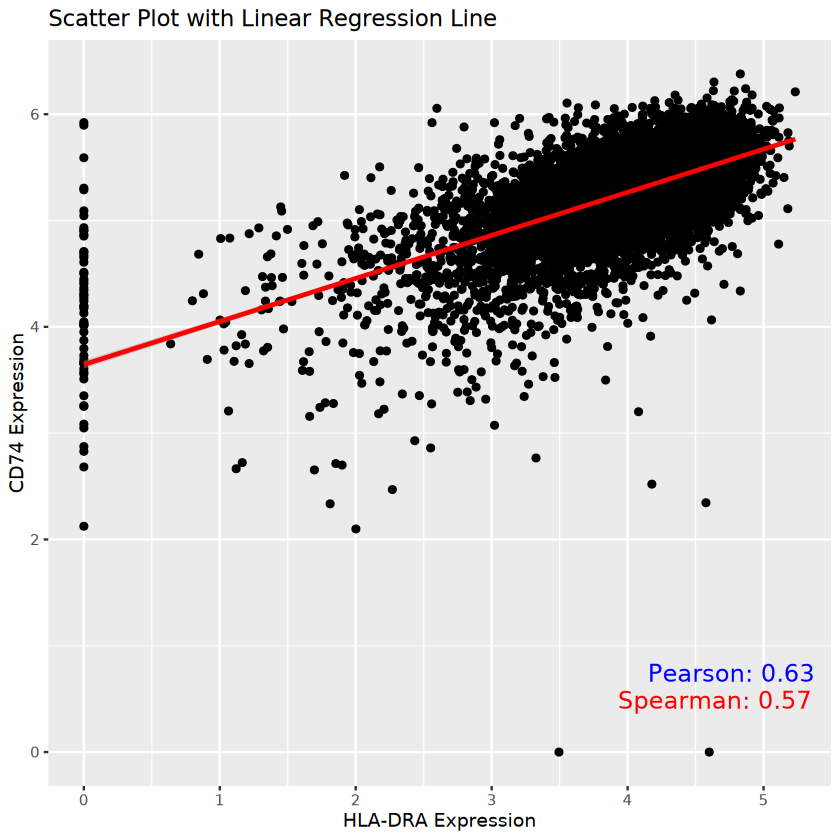

In [70]:
library(Seurat)
library(dplyr)

# Assuming Tumor1 is your Seurat object
gene1 <- FetchData(Tumor1, vars = "HLA-DRA")
gene2 <- FetchData(Tumor1, vars = "CD74")

# Combine the gene expression data into a data frame
data <- data.frame(Gene1 = gene1, Gene2 = gene2)
head(data)
# Plot: faceted by gene_set1




#Calculate Pearson and Spearman correlation values
pearson_corr <- cor(data$HLA.DRA, data$CD74, method = "pearson")
spearman_corr <- cor(data$HLA.DRA, data$CD74, method = "spearman")

# Create the scatter plot with a linear regression line and correlation values
ggplot(data, aes(x = HLA.DRA, y = CD74)) +
geom_point() +
geom_smooth(method = "lm", col = "red") +
labs(x = "HLA-DRA Expression", y = "CD74 Expression", title = "Scatter Plot with Linear Regression Line") +
annotate("text", x = Inf, y = 1, label = paste("Pearson:", round(pearson_corr, 2)), hjust = 1.1, vjust = 2, size = 5, color = "blue") +
annotate("text", x = Inf, y = 1, label = paste("Spearman:", round(spearman_corr, 2)), hjust = 1.1, vjust = 3.5, size = 5, color = "red")



`geom_smooth()` using formula = 'y ~ x'


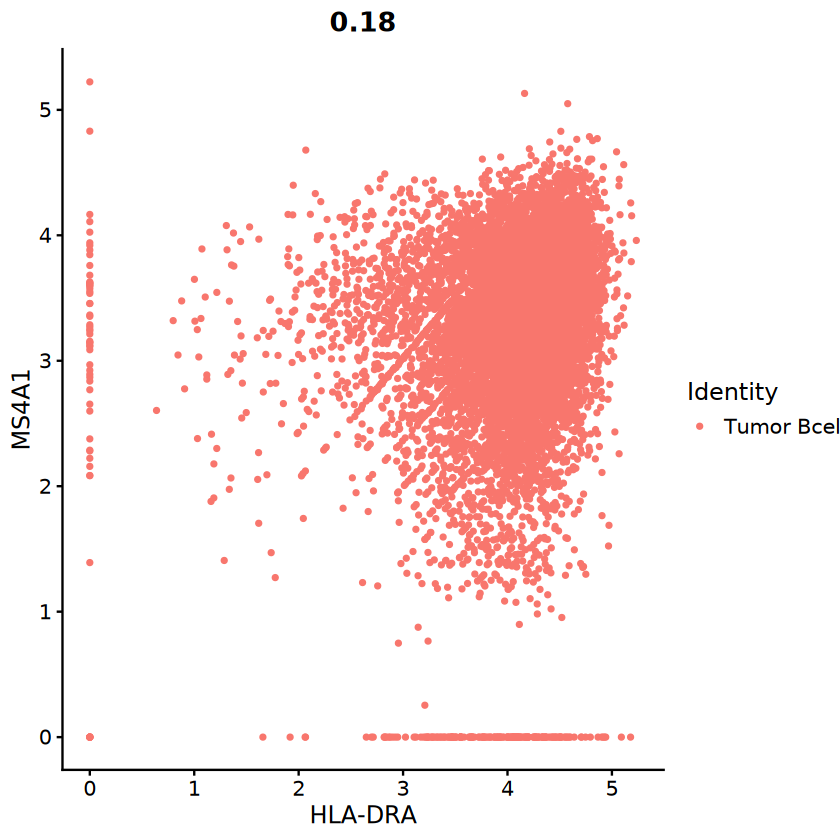

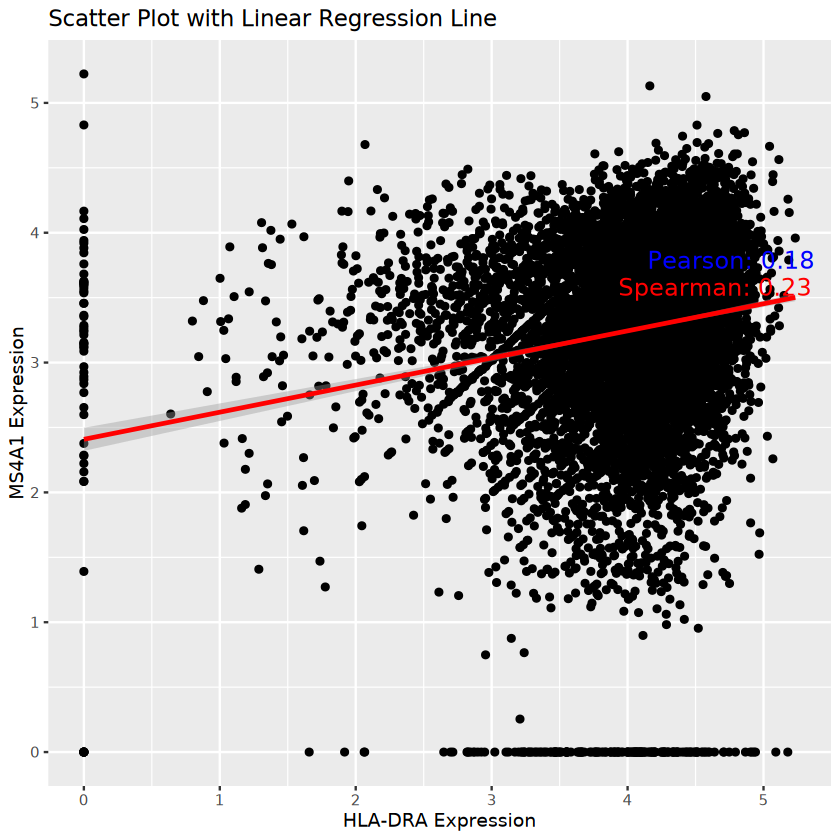

In [6]:
Tumor1 <- subset(Tbcells, patient == 30021)
test <- FeatureScatter(Tumor1, feature1 = "HLA-DRA", feature2 = "MS4A1") 
print(test)
# Assuming Tumor1 is your Seurat object
gene1 <- FetchData(Tumor1, vars = "HLA-DRA")
gene2 <- FetchData(Tumor1, vars = "MS4A1")

# Combine the gene expression data into a data frame
data <- data.frame(Gene1 = gene1, Gene2 = gene2)

#Calculate Pearson and Spearman correlation values
pearson_corr <- cor(data$HLA.DRA, data$MS4A1, method = "pearson")
spearman_corr <- cor(data$HLA.DRA, data$MS4A1, method = "spearman")

# Create the scatter plot with a linear regression line and correlation values
scatter <- ggplot(data, aes(x = HLA.DRA, y = MS4A1)) +
geom_point() +
geom_smooth(method = "lm", col = "red") +
labs(x = "HLA-DRA Expression", y = "MS4A1 Expression", title = "Scatter Plot with Linear Regression Line") +
annotate("text", x = Inf, y = 4, label = paste("Pearson:", round(pearson_corr, 2)), hjust = 1.1, vjust = 2, size = 5, color = "blue") +
annotate("text", x = Inf, y = 4, label = paste("Spearman:", round(spearman_corr, 2)), hjust = 1.1, vjust = 3.5, size = 5, color = "red")

print(scatter)

`geom_smooth()` using formula = 'y ~ x'


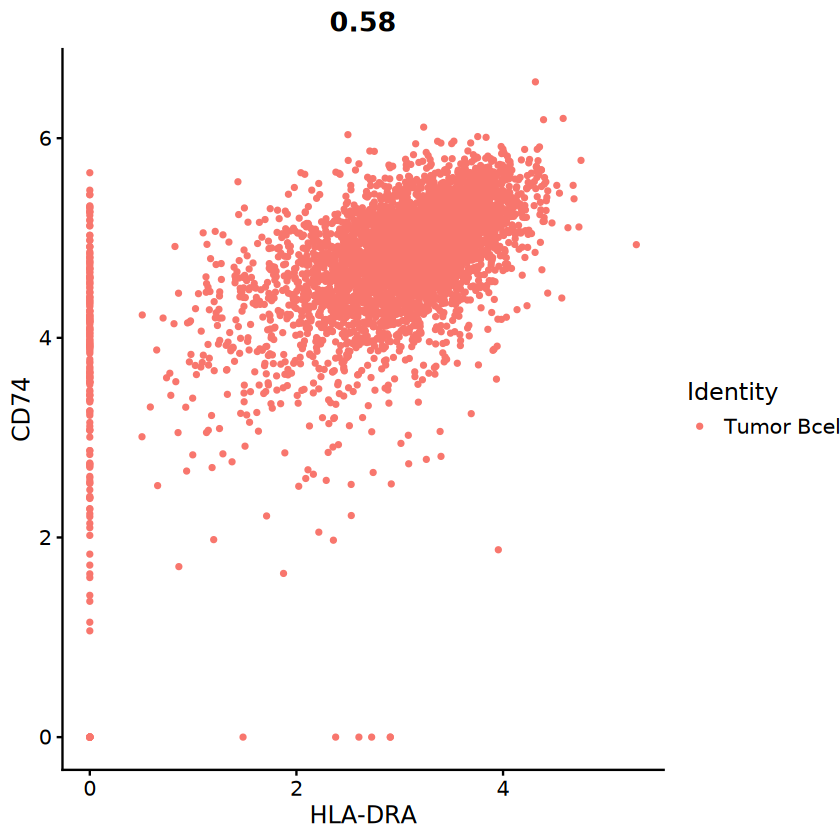

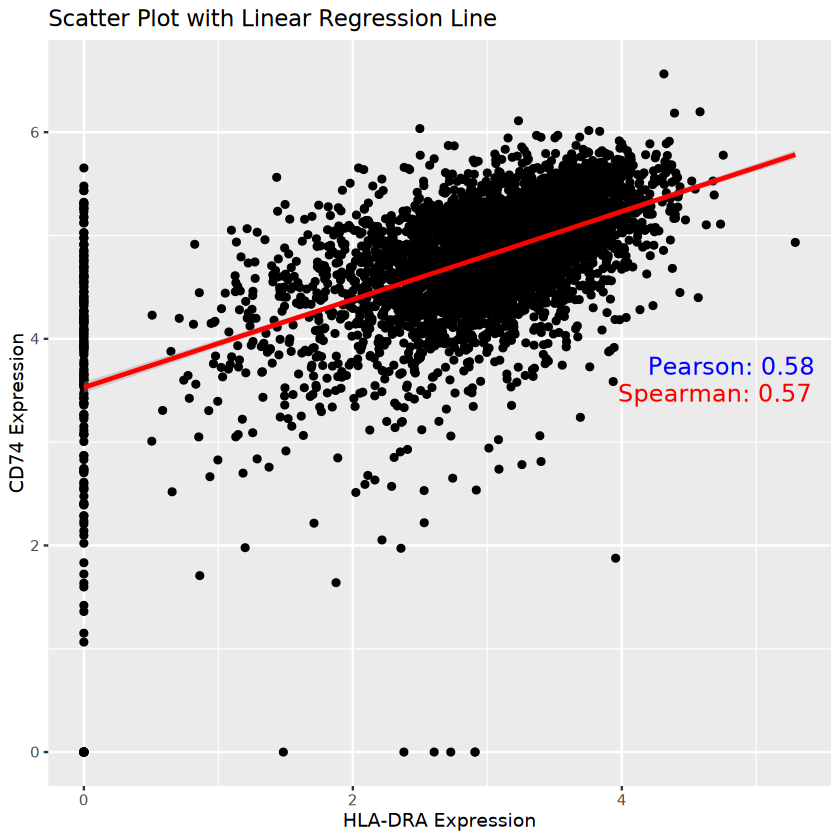

In [90]:
Tumor1 <- subset(Tbcells, patient == 30134)
test <- FeatureScatter(Tumor1, feature1 = "HLA-DRA", feature2 = "CD74") 
print(test)
# Assuming Tumor1 is your Seurat object
gene1 <- FetchData(Tumor1, vars = "HLA-DRA")
gene2 <- FetchData(Tumor1, vars = "CD74")

# Combine the gene expression data into a data frame
data <- data.frame(Gene1 = gene1, Gene2 = gene2)

#Calculate Pearson and Spearman correlation values
pearson_corr <- cor(data$HLA.DRA, data$CD74, method = "pearson")
spearman_corr <- cor(data$HLA.DRA, data$CD74, method = "spearman")

# Create the scatter plot with a linear regression line and correlation values
scatter <- ggplot(data, aes(x = HLA.DRA, y = CD74)) +
geom_point() +
geom_smooth(method = "lm", col = "red") +
labs(x = "HLA-DRA Expression", y = "CD74 Expression", title = "Scatter Plot with Linear Regression Line") +
annotate("text", x = Inf, y = 4, label = paste("Pearson:", round(pearson_corr, 2)), hjust = 1.1, vjust = 2, size = 5, color = "blue") +
annotate("text", x = Inf, y = 4, label = paste("Spearman:", round(spearman_corr, 2)), hjust = 1.1, vjust = 3.5, size = 5, color = "red")

print(scatter)

`geom_smooth()` using formula = 'y ~ x'


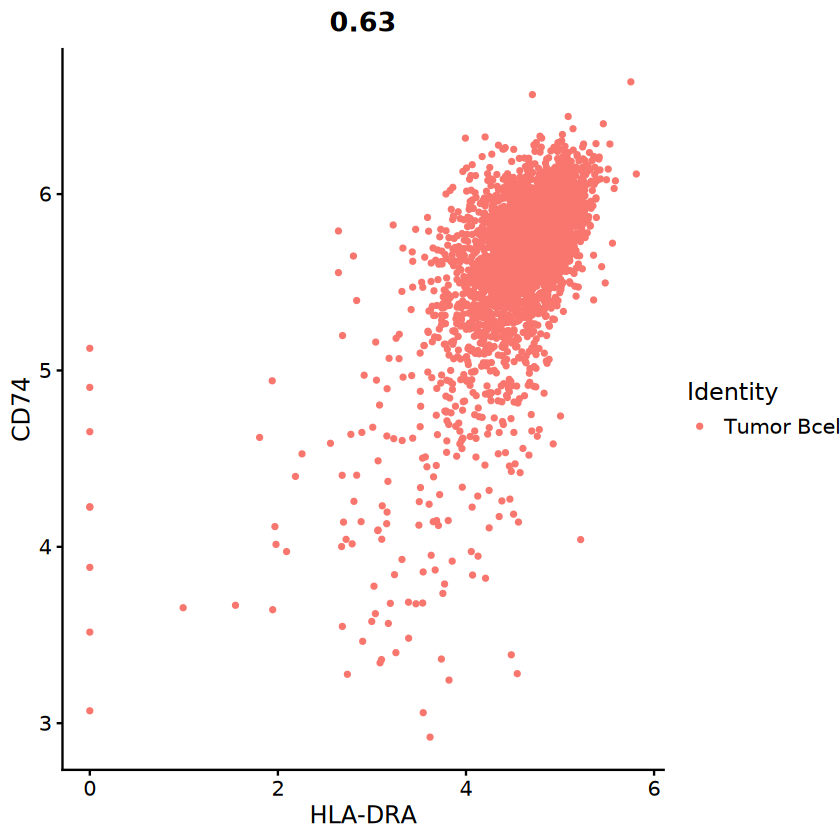

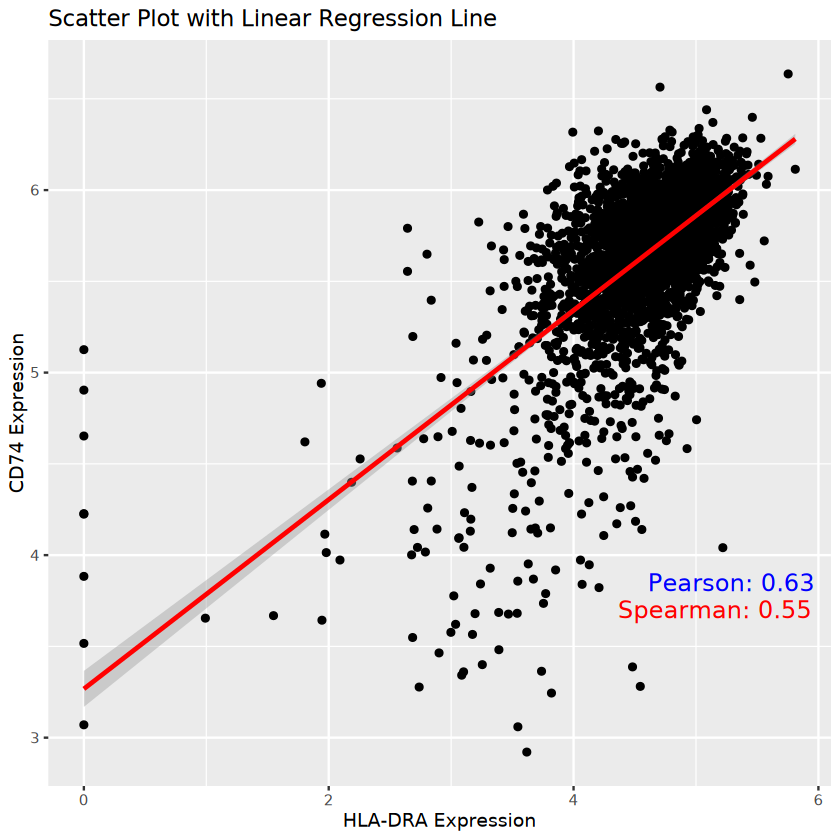

In [97]:
Tumor1 <- subset(Tbcells, patient == 31247)
test <- FeatureScatter(Tumor1, feature1 = "HLA-DRA", feature2 = "CD74") 
print(test)
# Assuming Tumor1 is your Seurat object
gene1 <- FetchData(Tumor1, vars = "HLA-DRA")
gene2 <- FetchData(Tumor1, vars = "CD74")

# Combine the gene expression data into a data frame
data <- data.frame(Gene1 = gene1, Gene2 = gene2)

#Calculate Pearson and Spearman correlation values
pearson_corr <- cor(data$HLA.DRA, data$CD74, method = "pearson")
spearman_corr <- cor(data$HLA.DRA, data$CD74, method = "spearman")

# Create the scatter plot with a linear regression line and correlation values
scatter <- ggplot(data, aes(x = HLA.DRA, y = CD74)) +
geom_point() +
geom_smooth(method = "lm", col = "red") +
labs(x = "HLA-DRA Expression", y = "CD74 Expression", title = "Scatter Plot with Linear Regression Line") +
annotate("text", x = Inf, y = 4, label = paste("Pearson:", round(pearson_corr, 2)), hjust = 1.1, vjust = 2, size = 5, color = "blue") +
annotate("text", x = Inf, y = 4, label = paste("Spearman:", round(spearman_corr, 2)), hjust = 1.1, vjust = 3.5, size = 5, color = "red")

print(scatter)

`geom_smooth()` using formula = 'y ~ x'


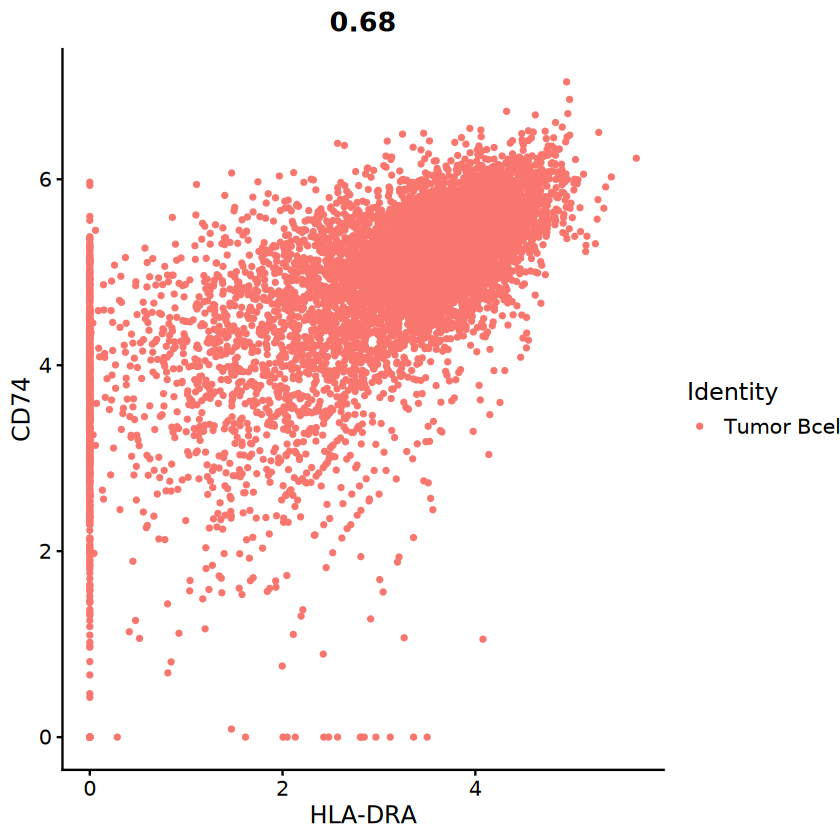

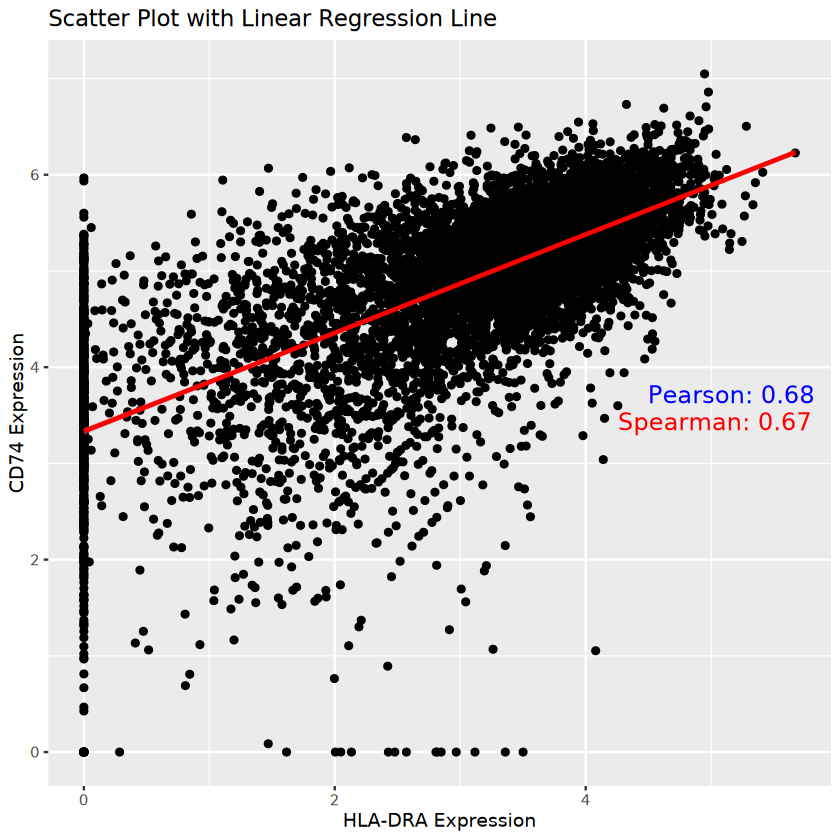

In [96]:
Tumor1 <- subset(Tbcells, patient == 31654)
test <- FeatureScatter(Tumor1, feature1 = "HLA-DRA", feature2 = "CD74") 
print(test)
# Assuming Tumor1 is your Seurat object
gene1 <- FetchData(Tumor1, vars = "HLA-DRA")
gene2 <- FetchData(Tumor1, vars = "CD74")

# Combine the gene expression data into a data frame
data <- data.frame(Gene1 = gene1, Gene2 = gene2)

#Calculate Pearson and Spearman correlation values
pearson_corr <- cor(data$HLA.DRA, data$CD74, method = "pearson")
spearman_corr <- cor(data$HLA.DRA, data$CD74, method = "spearman")

# Create the scatter plot with a linear regression line and correlation values
scatter <- ggplot(data, aes(x = HLA.DRA, y = CD74)) +
geom_point() +
geom_smooth(method = "lm", col = "red") +
labs(x = "HLA-DRA Expression", y = "CD74 Expression", title = "Scatter Plot with Linear Regression Line") +
annotate("text", x = Inf, y = 4, label = paste("Pearson:", round(pearson_corr, 2)), hjust = 1.1, vjust = 2, size = 5, color = "blue") +
annotate("text", x = Inf, y = 4, label = paste("Spearman:", round(spearman_corr, 2)), hjust = 1.1, vjust = 3.5, size = 5, color = "red")

print(scatter)

[1] "30021"


`geom_smooth()` using formula = 'y ~ x'


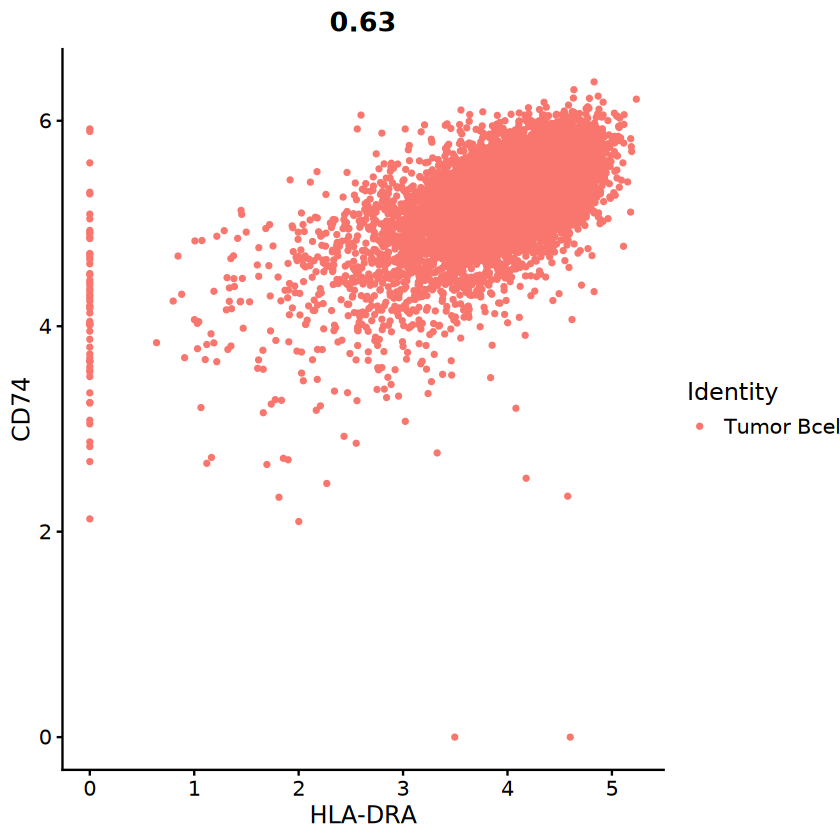

[1] "30134"


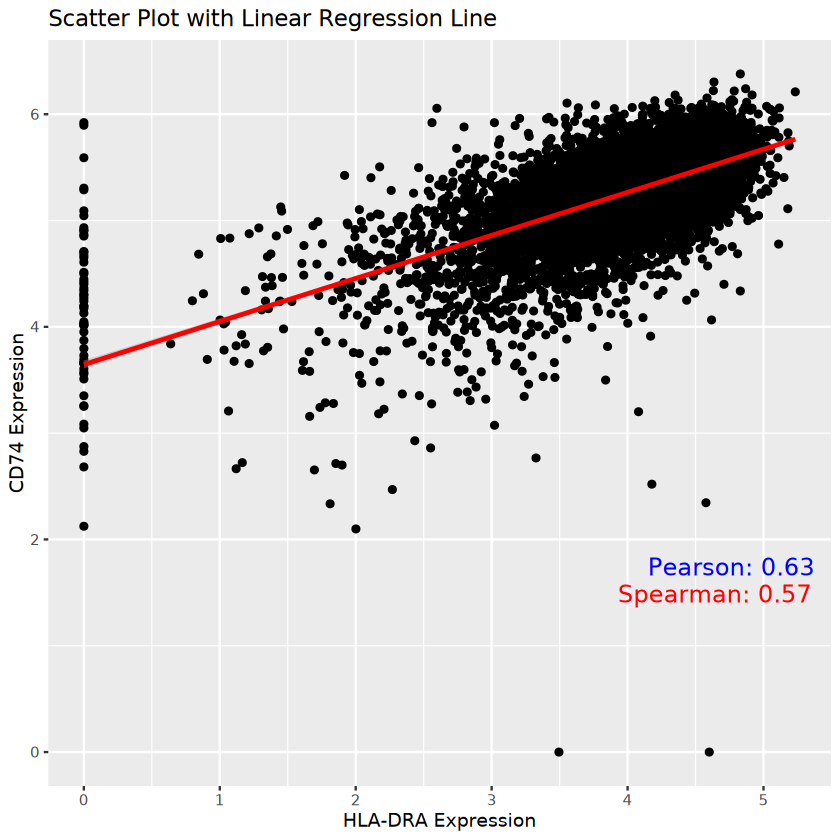

`geom_smooth()` using formula = 'y ~ x'


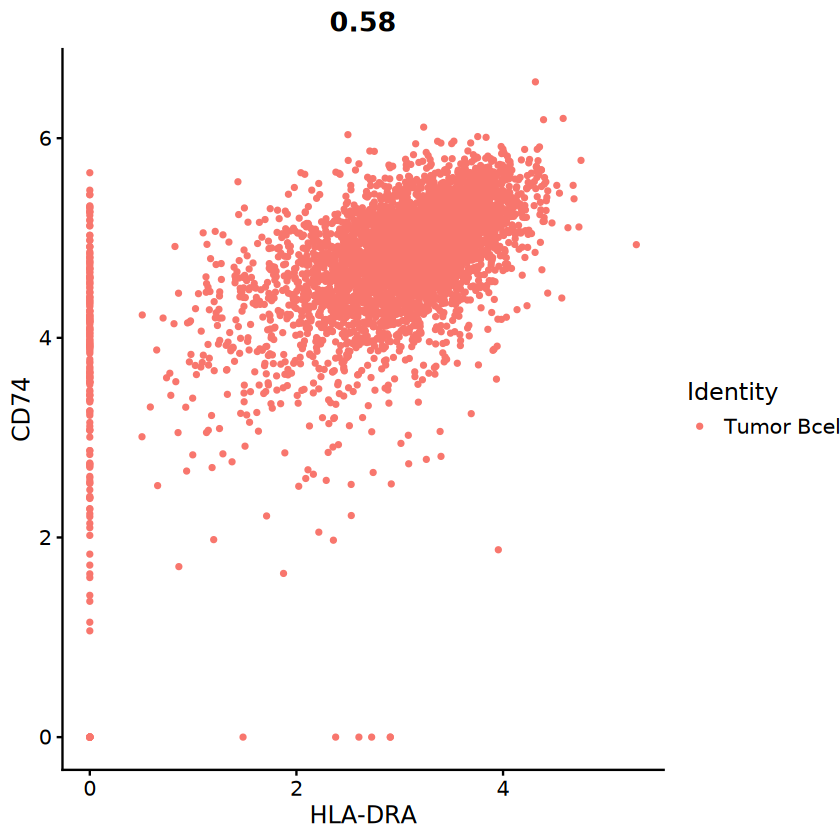

[1] "31247"


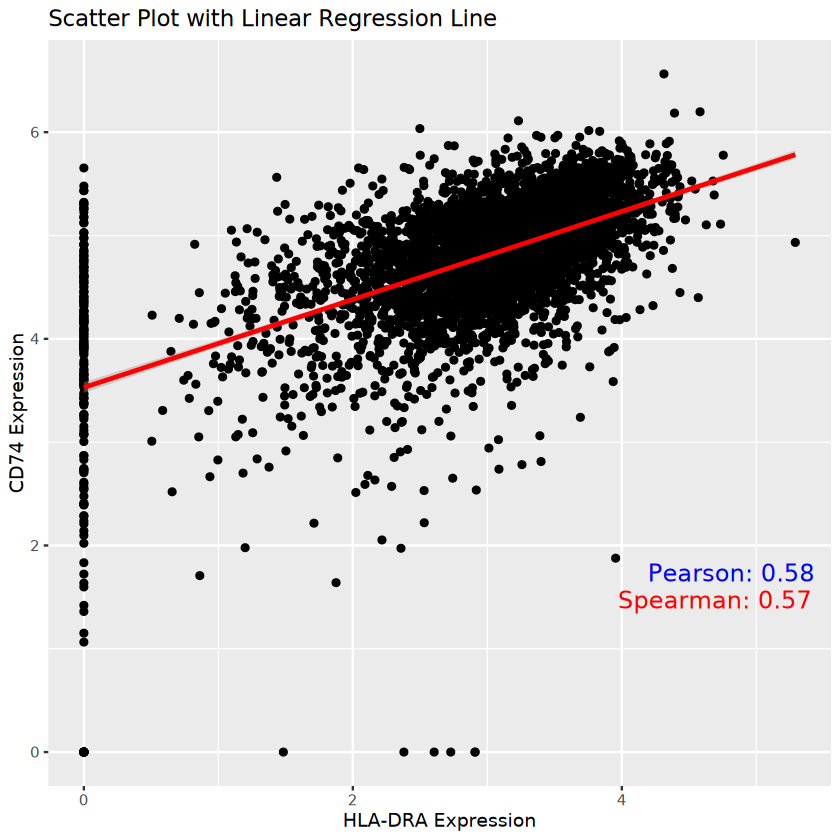

`geom_smooth()` using formula = 'y ~ x'


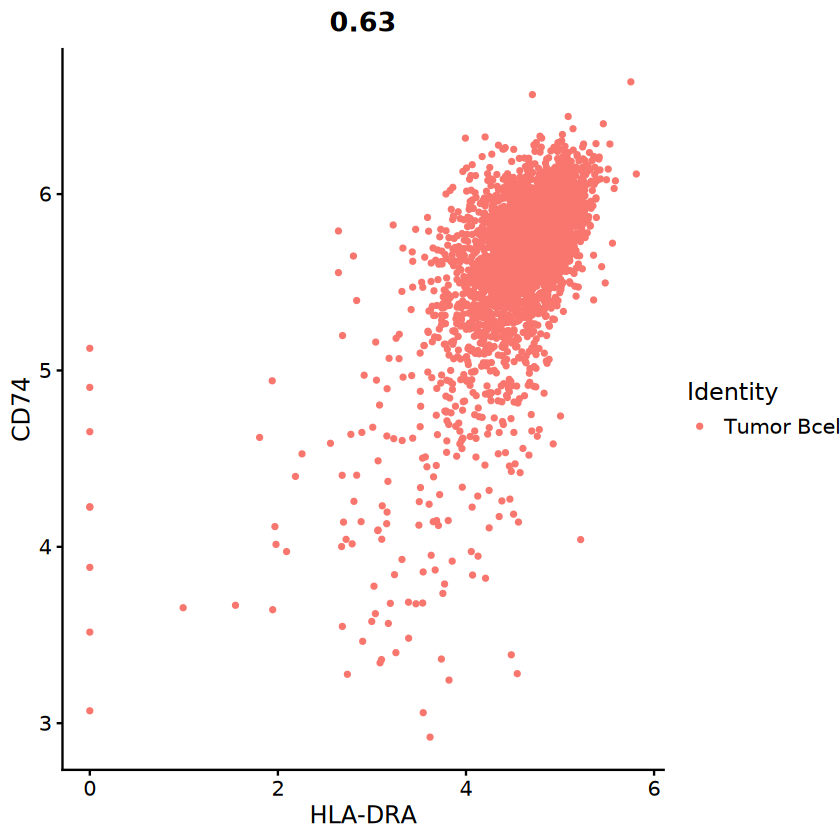

[1] "31654"


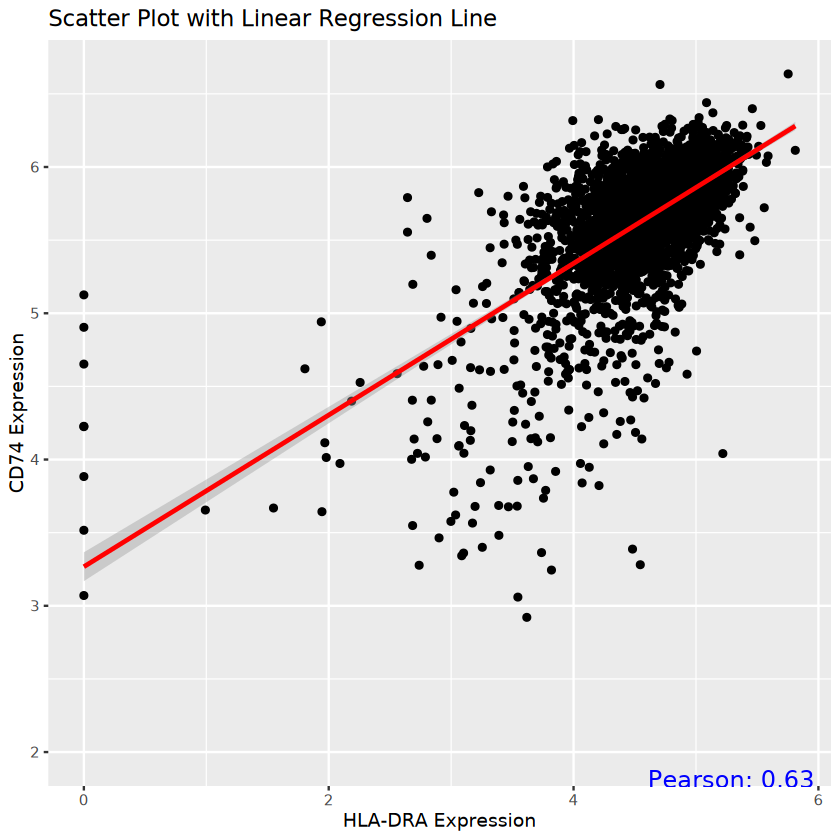

`geom_smooth()` using formula = 'y ~ x'


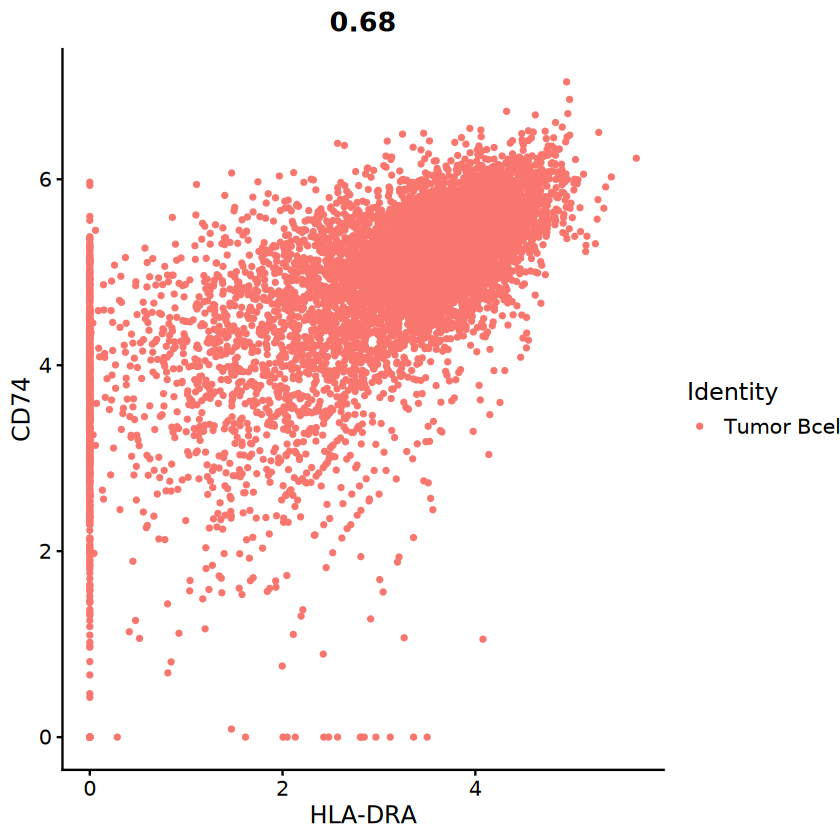

[1] "32892"


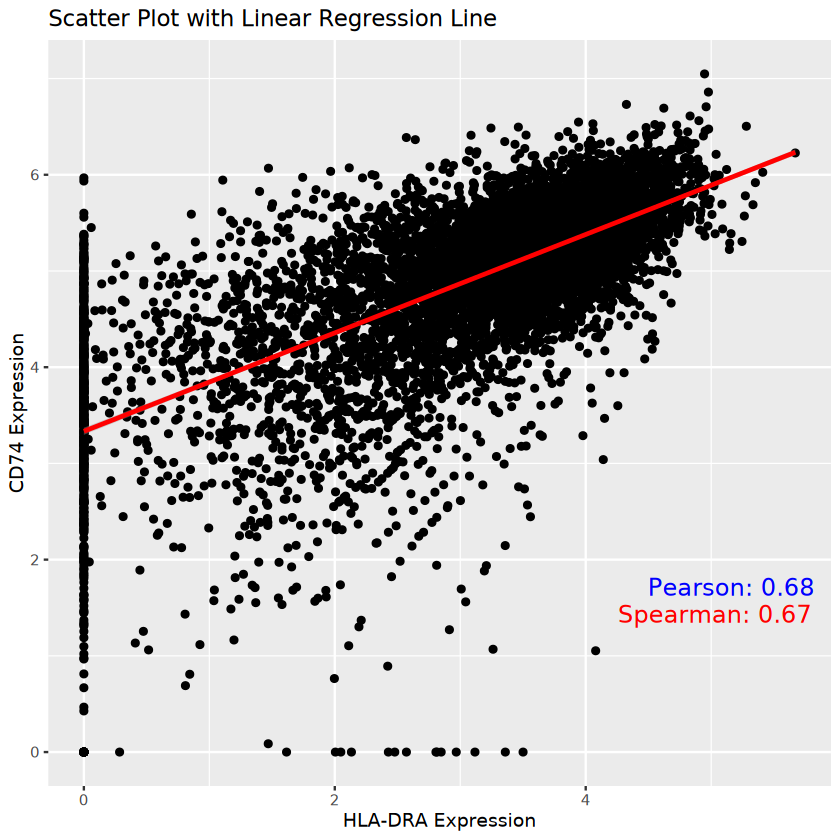

`geom_smooth()` using formula = 'y ~ x'


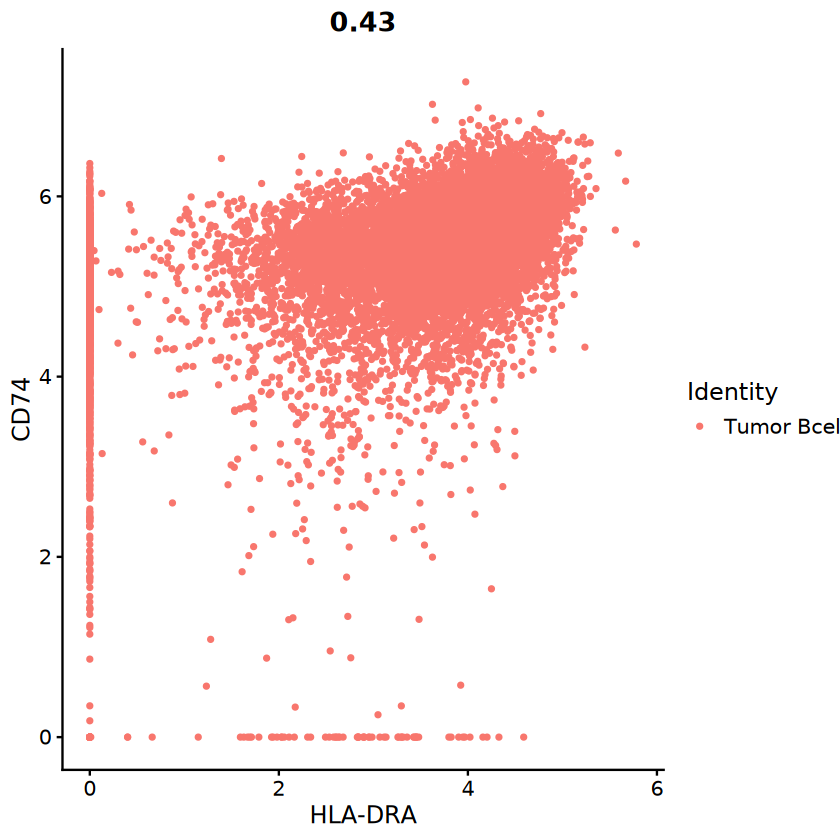

[1] "33464"


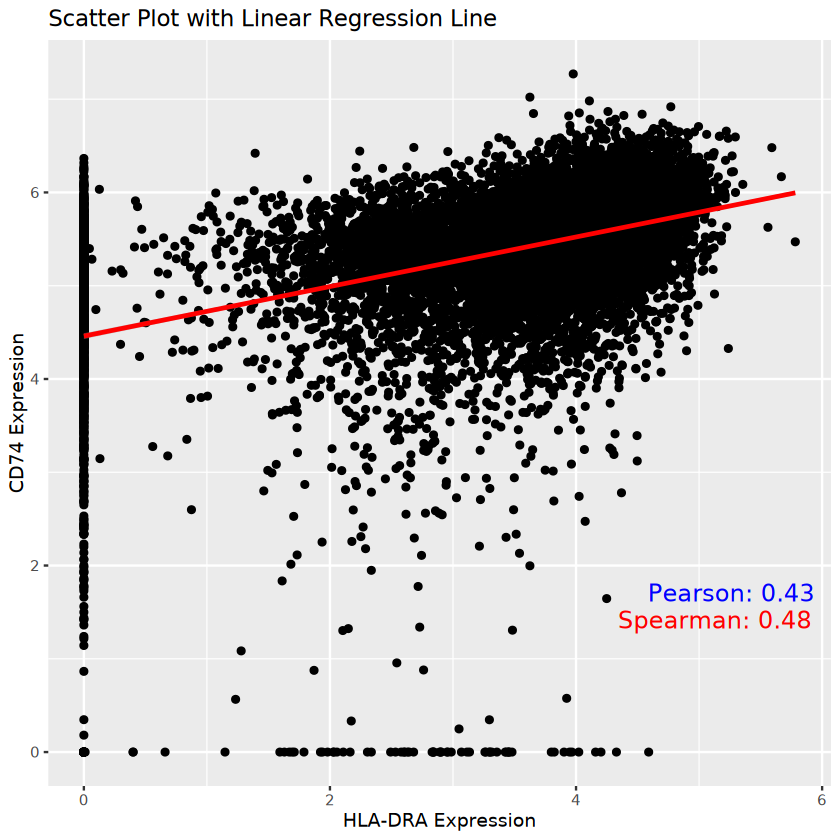

`geom_smooth()` using formula = 'y ~ x'


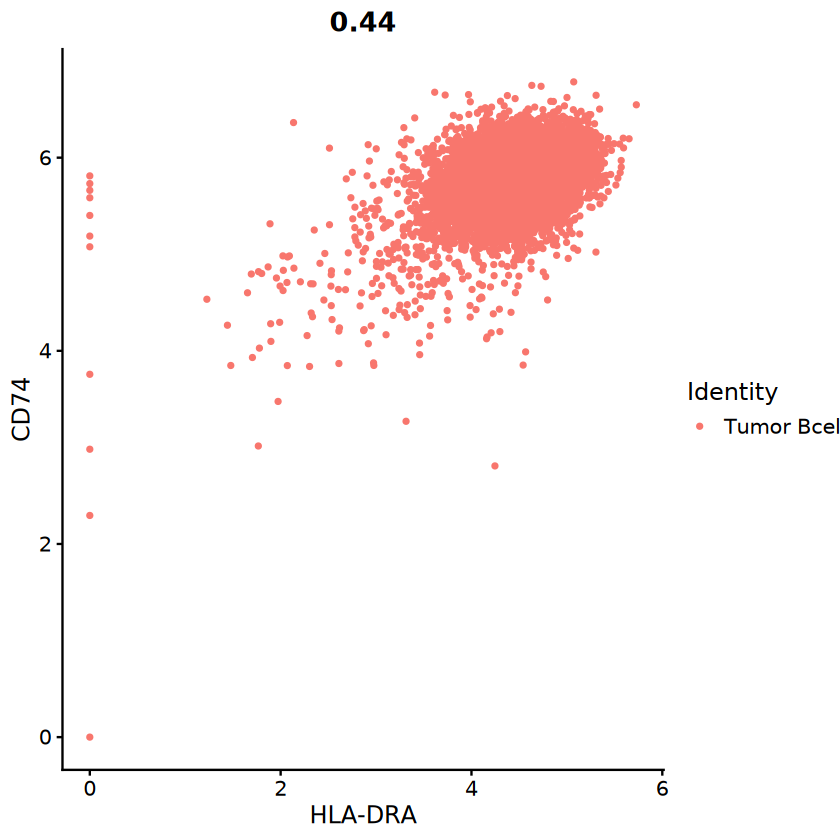

[1] "34842"


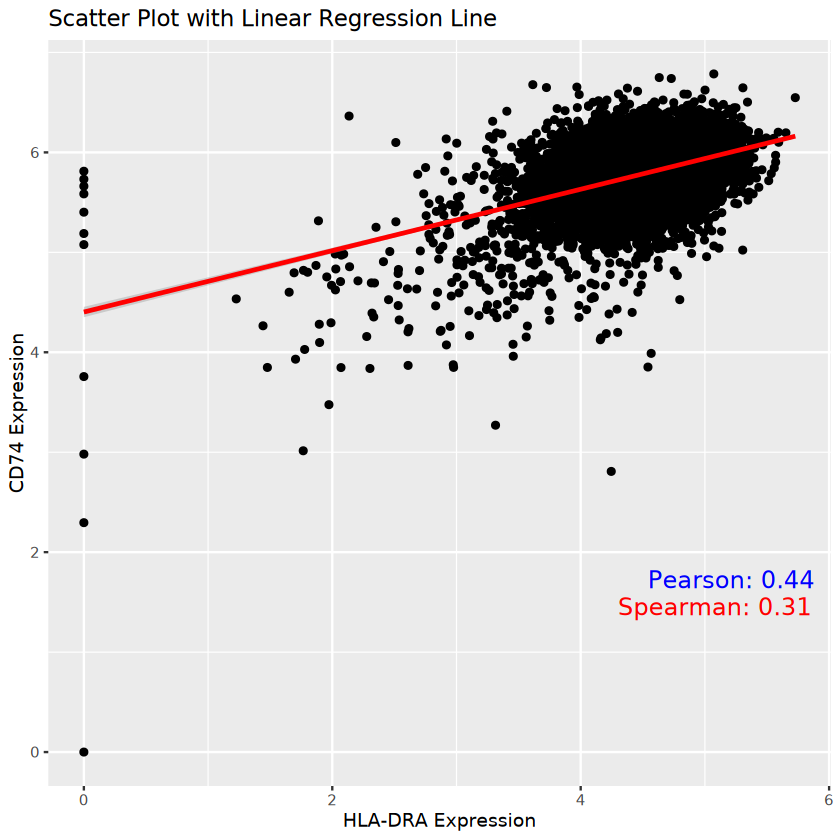

`geom_smooth()` using formula = 'y ~ x'


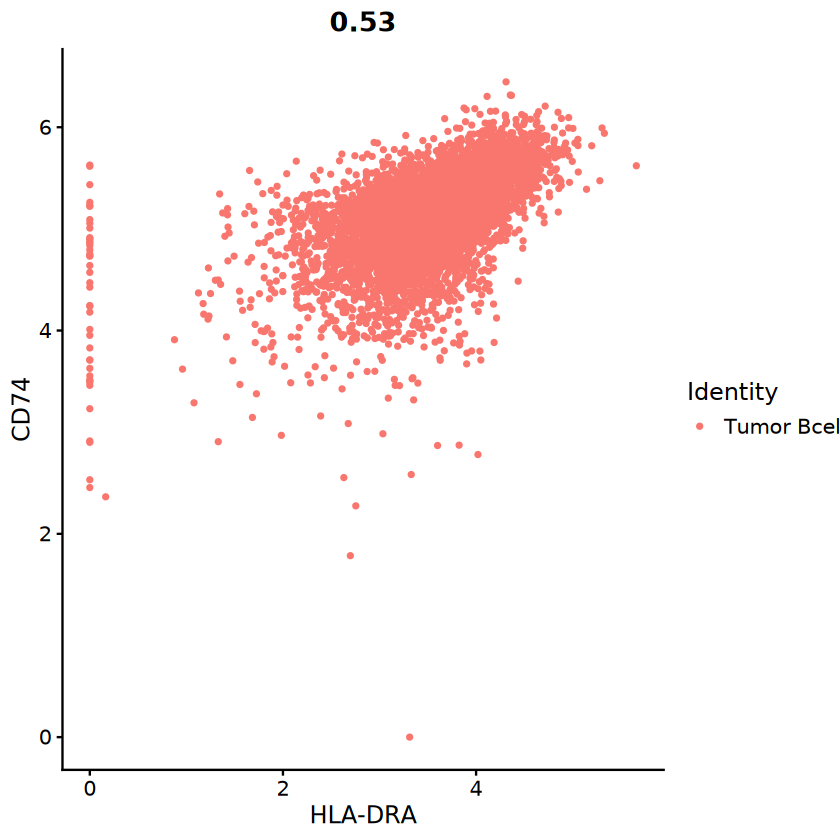

[1] "35476"


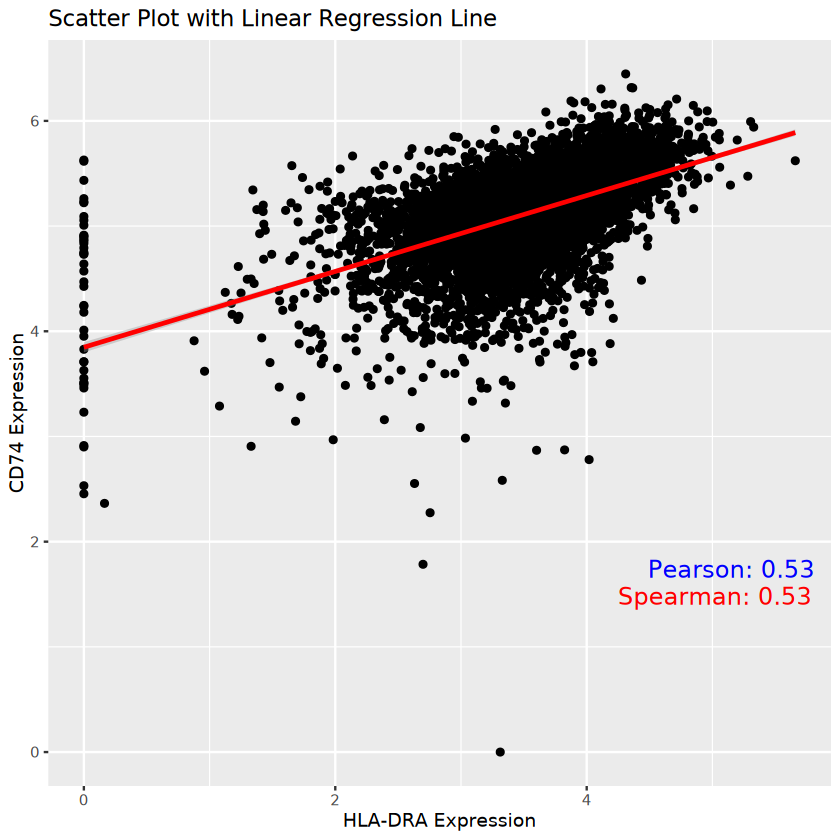

`geom_smooth()` using formula = 'y ~ x'


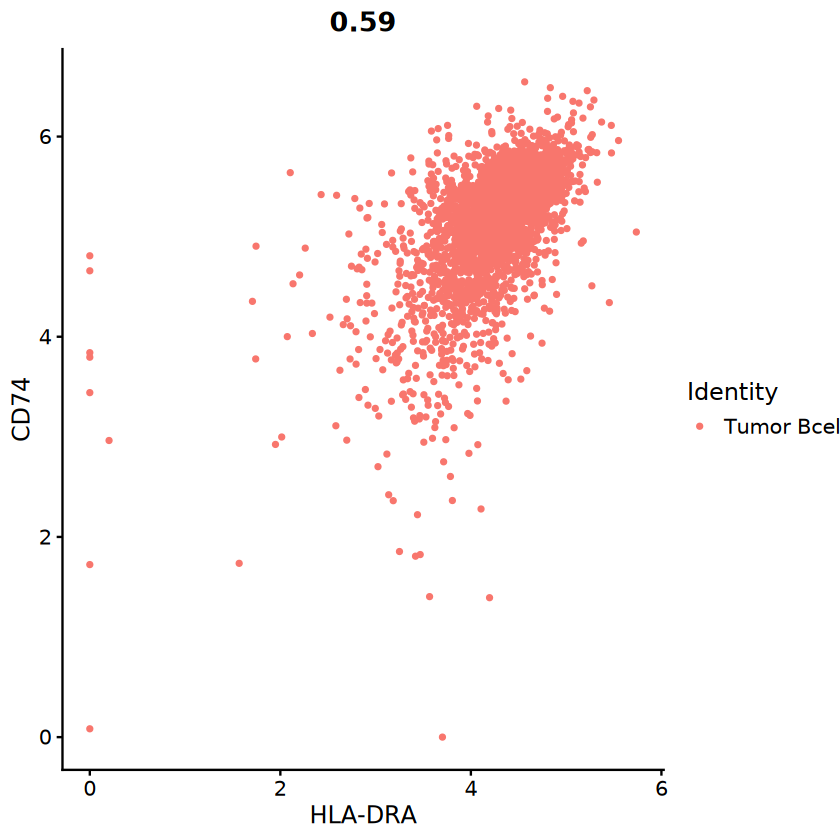

[1] "36312"


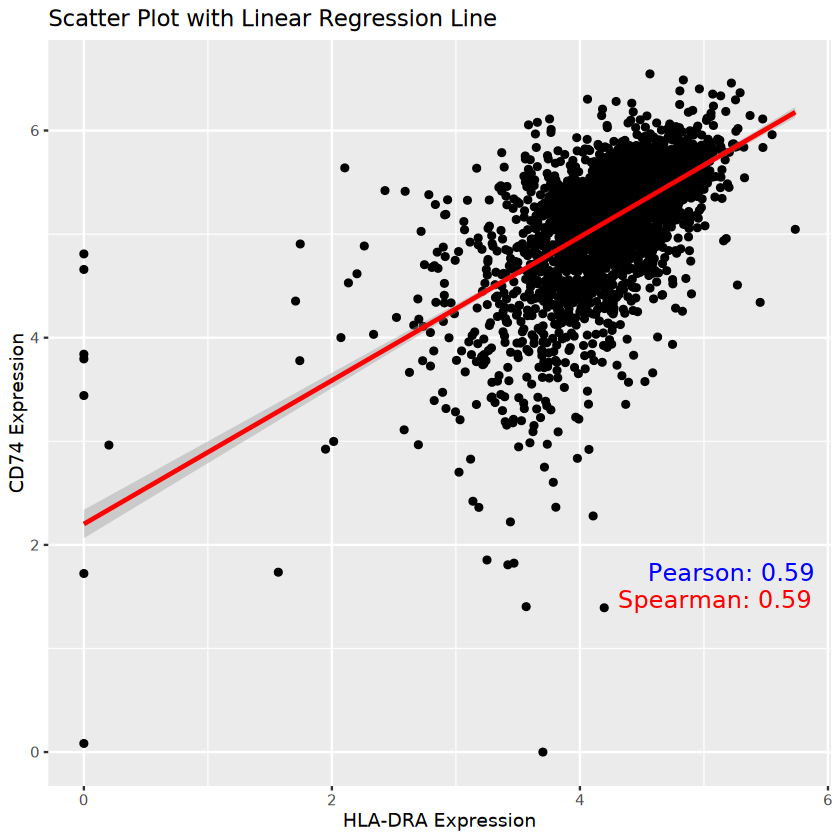

`geom_smooth()` using formula = 'y ~ x'


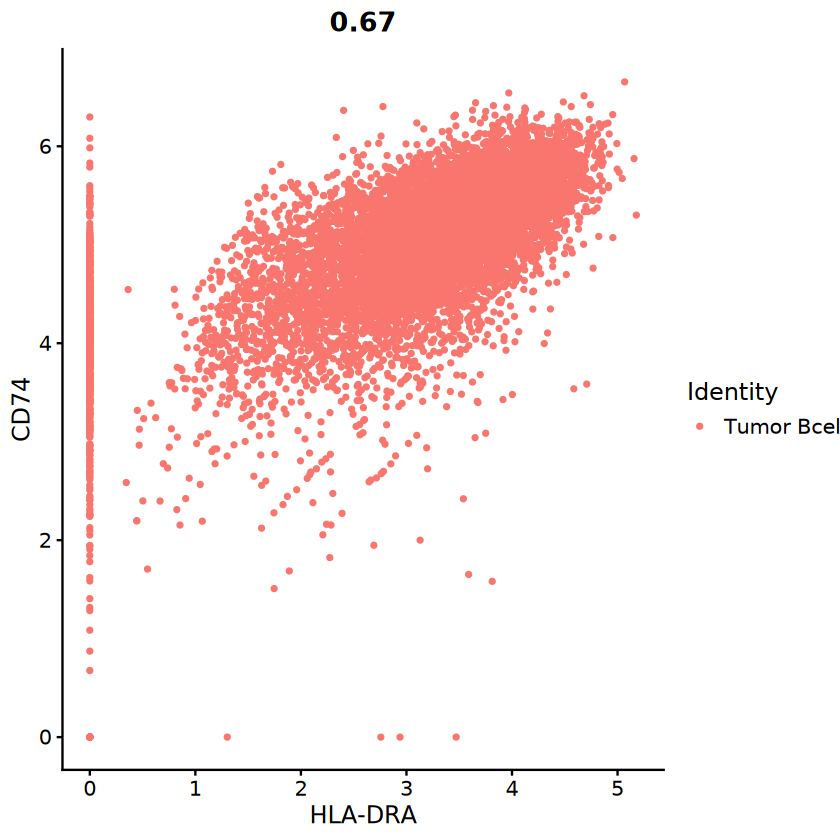

[1] "36482"


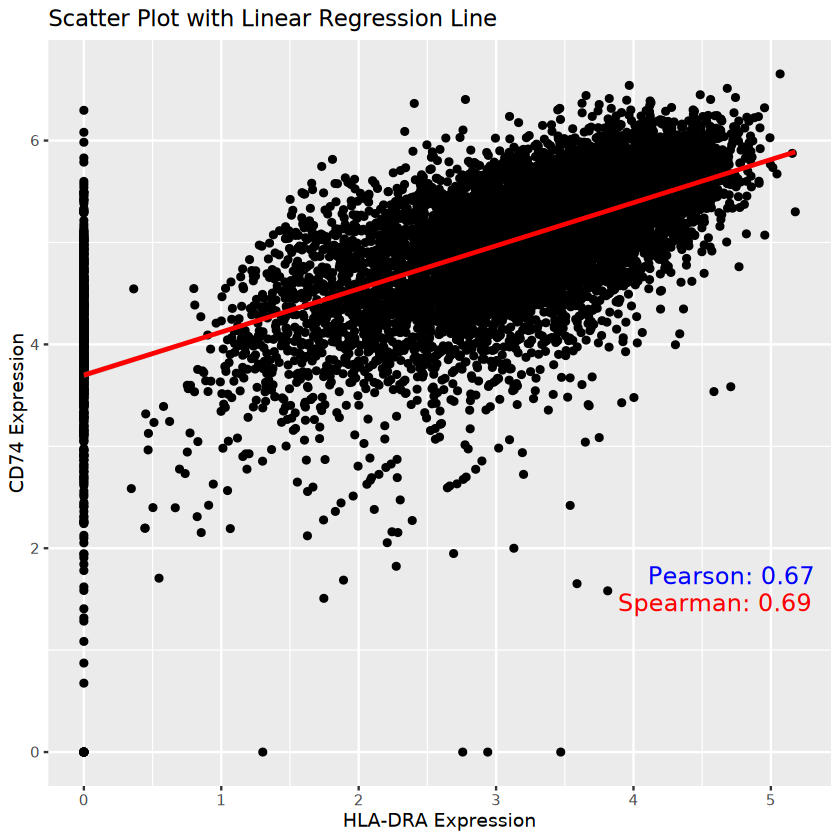

`geom_smooth()` using formula = 'y ~ x'


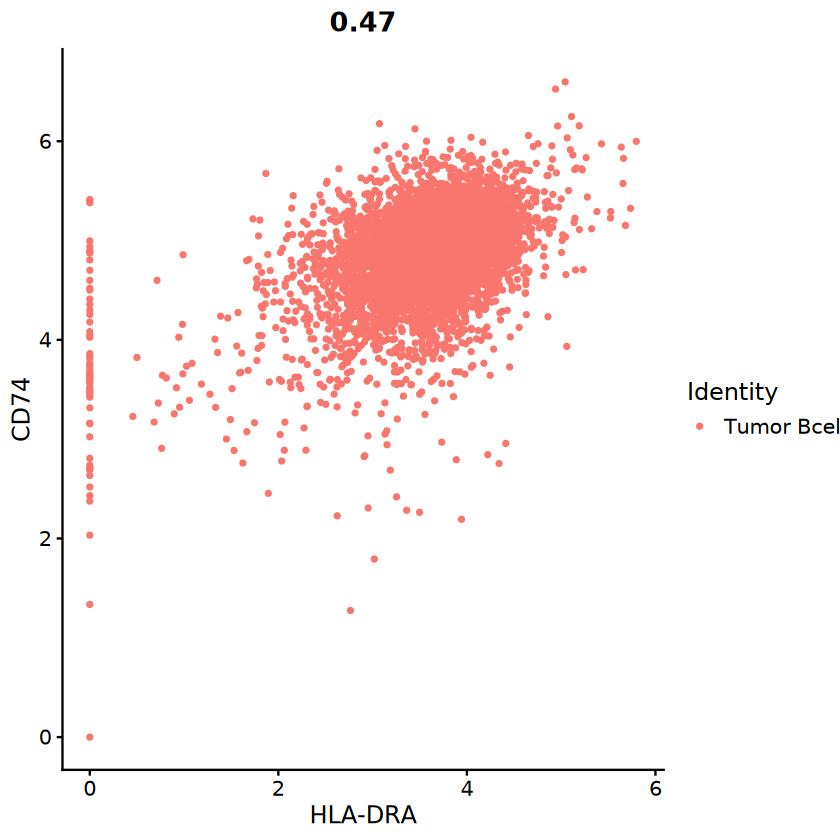

[1] "36510"


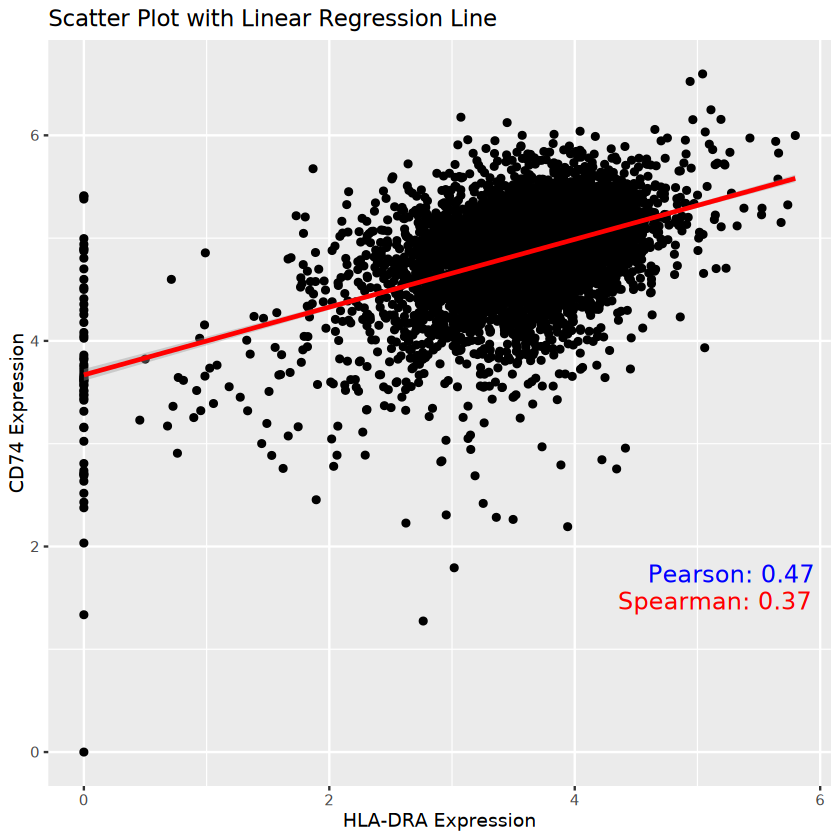

`geom_smooth()` using formula = 'y ~ x'


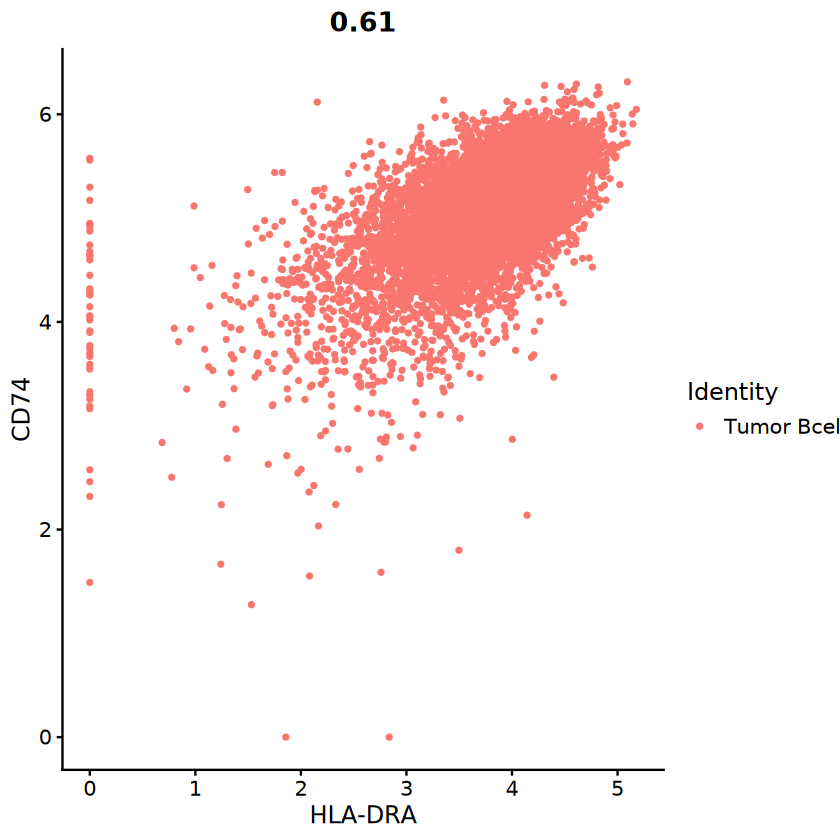

[1] "36552"


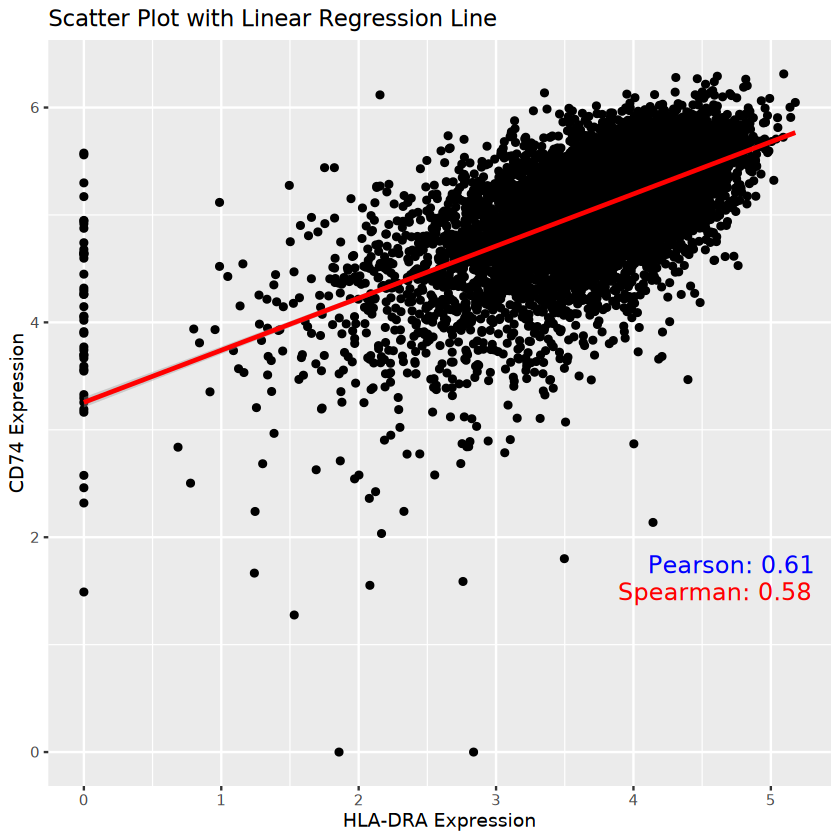

`geom_smooth()` using formula = 'y ~ x'


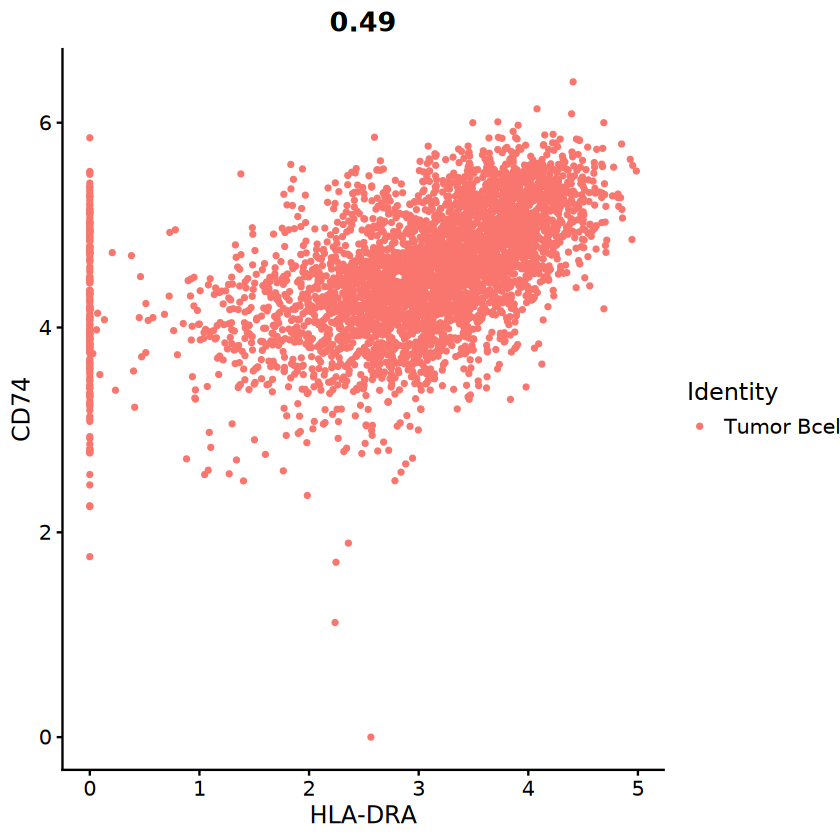

[1] "36638"


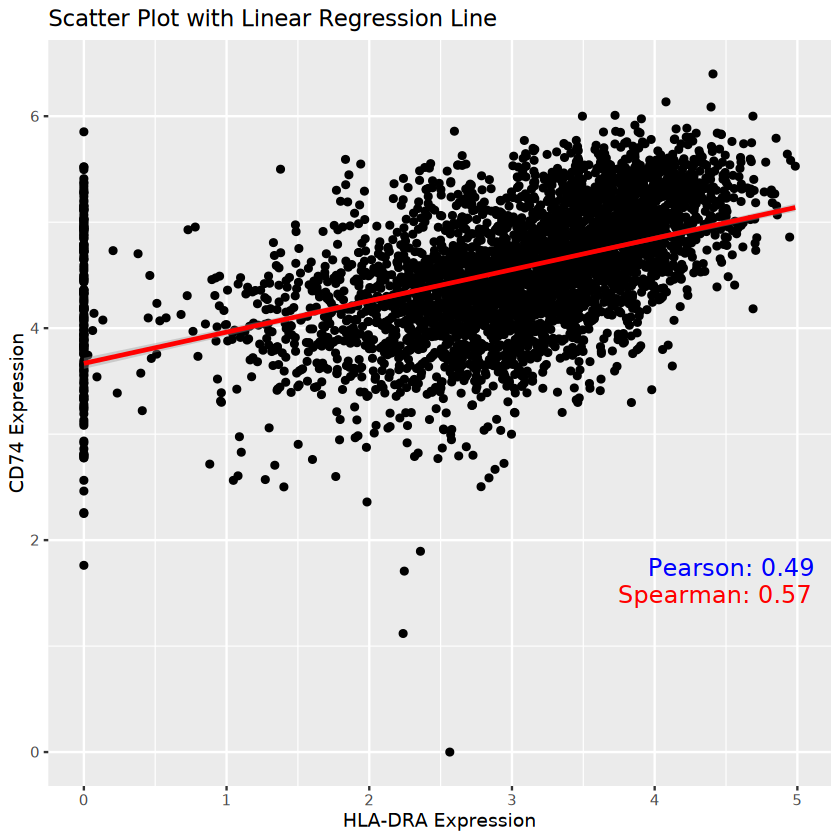

`geom_smooth()` using formula = 'y ~ x'


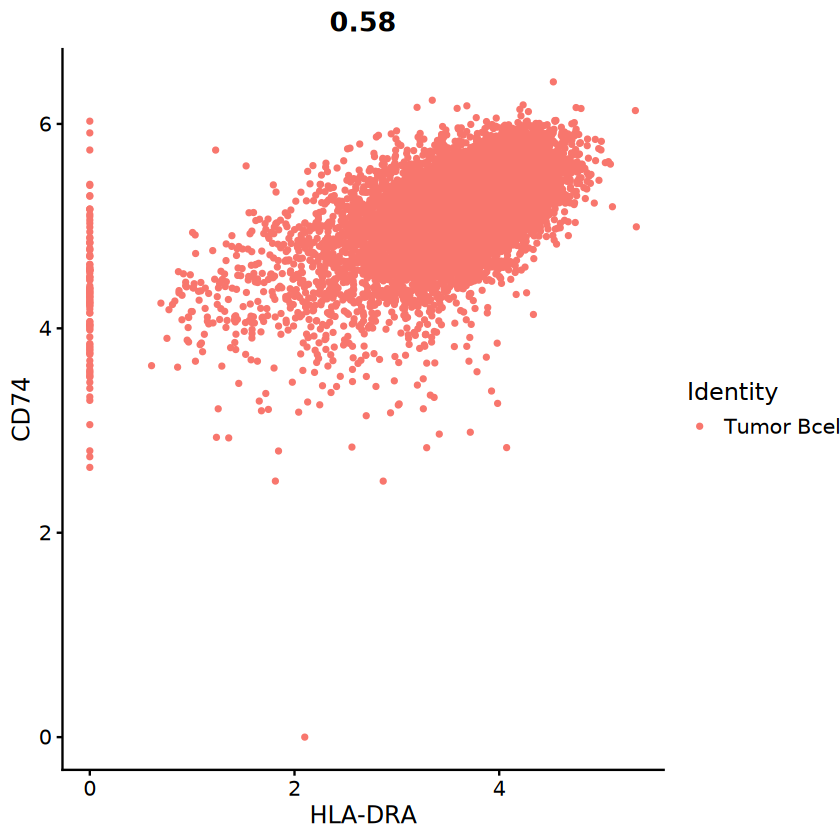

[1] "36840"


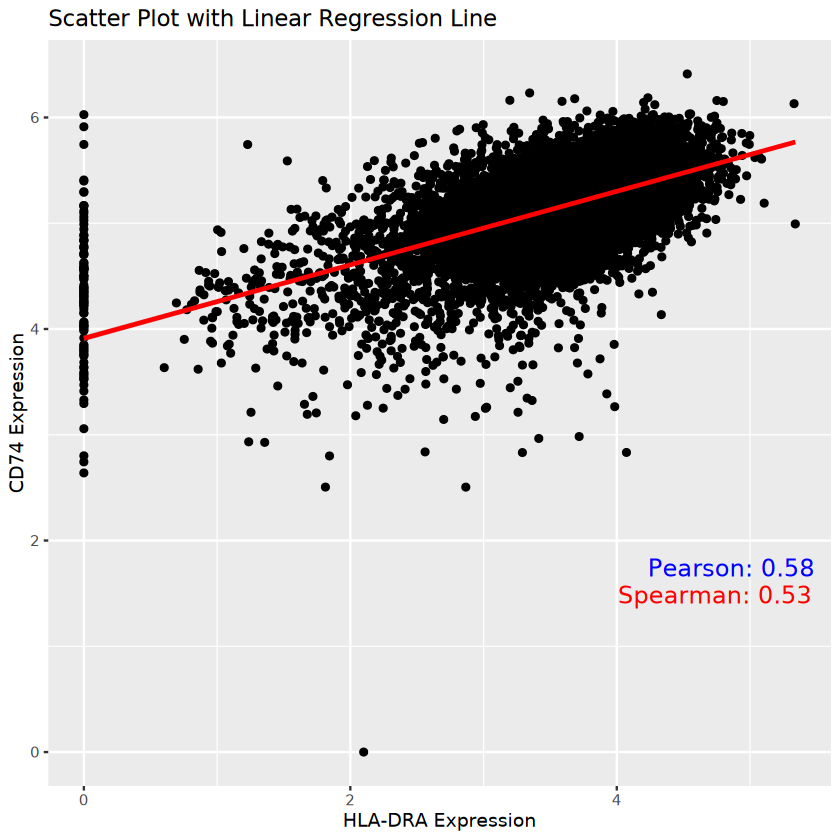

`geom_smooth()` using formula = 'y ~ x'


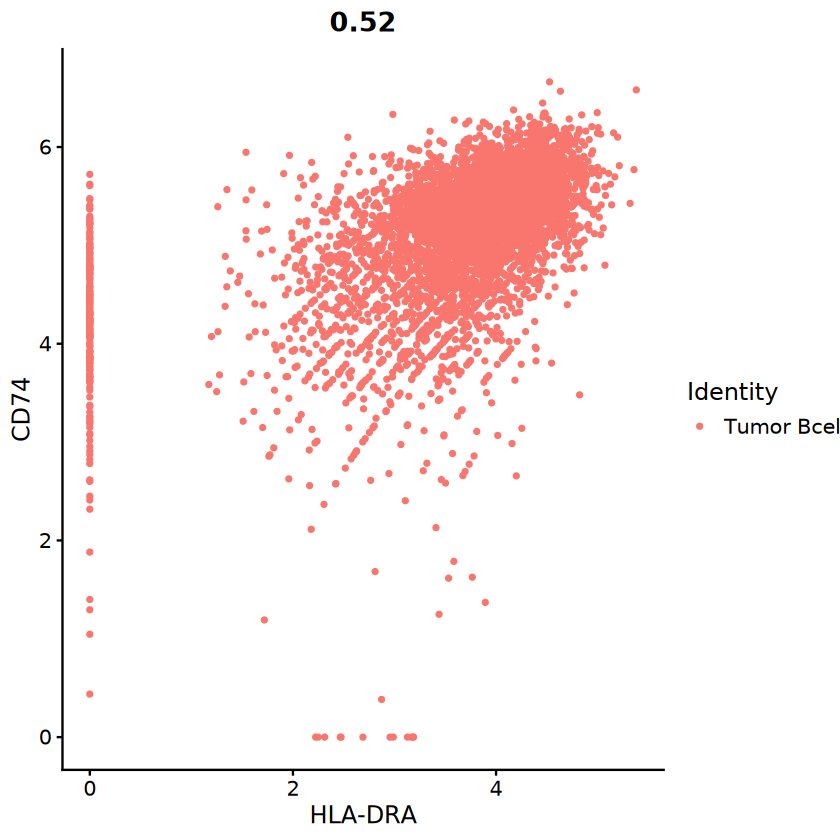

[1] "36876"


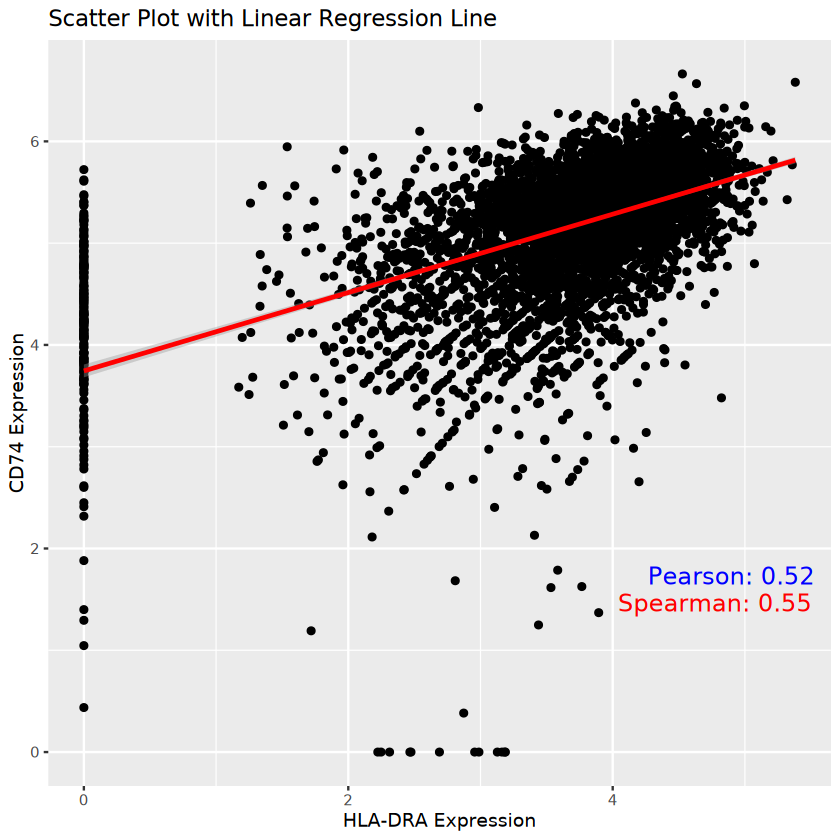

`geom_smooth()` using formula = 'y ~ x'


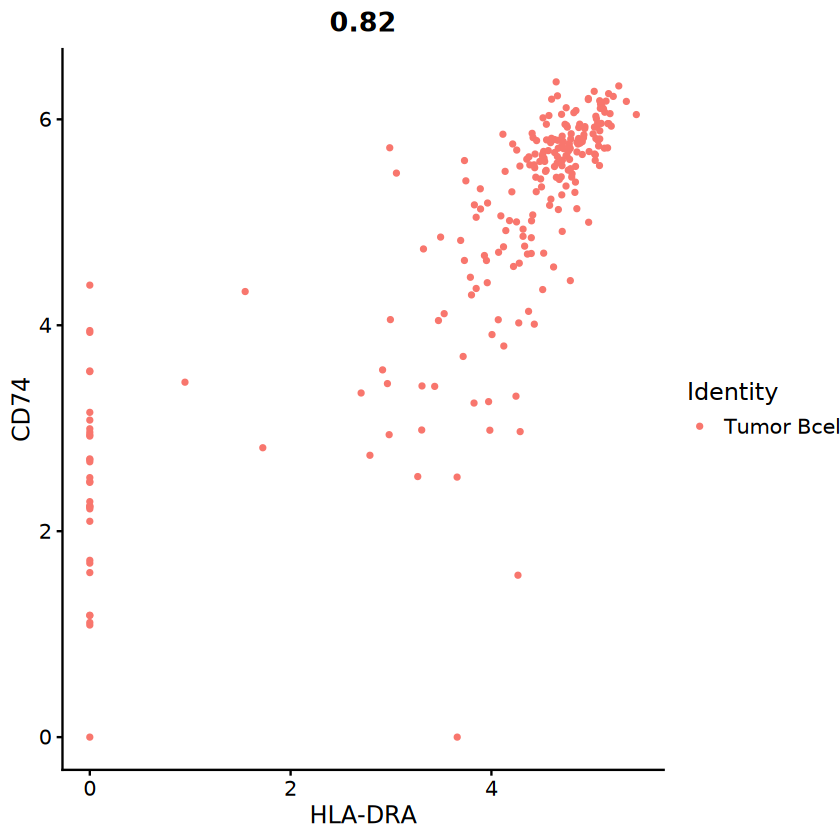

[1] "37165"


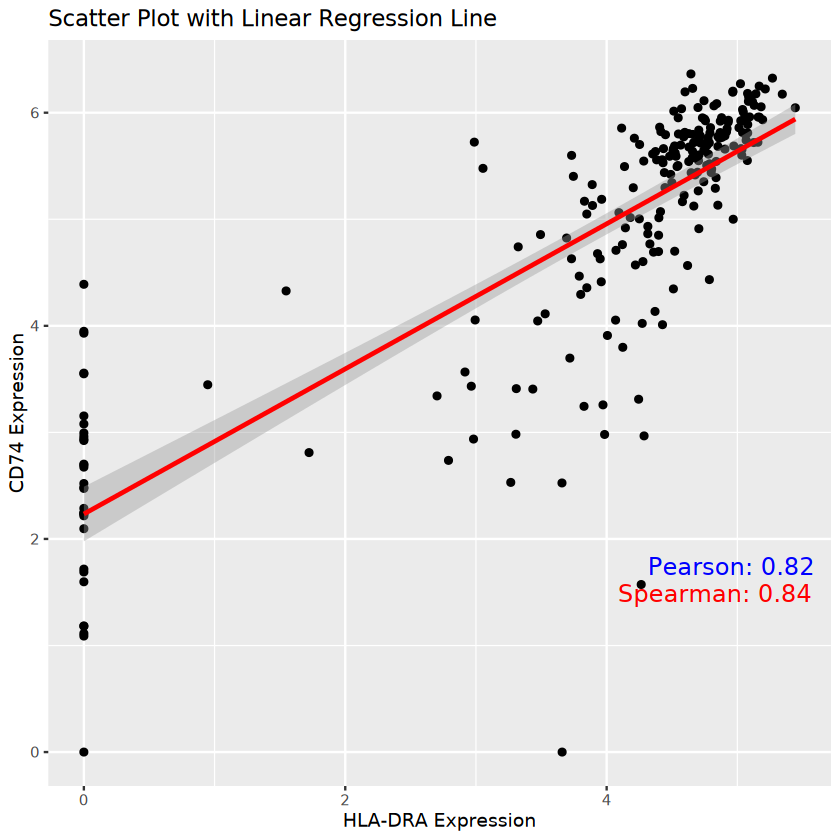

`geom_smooth()` using formula = 'y ~ x'


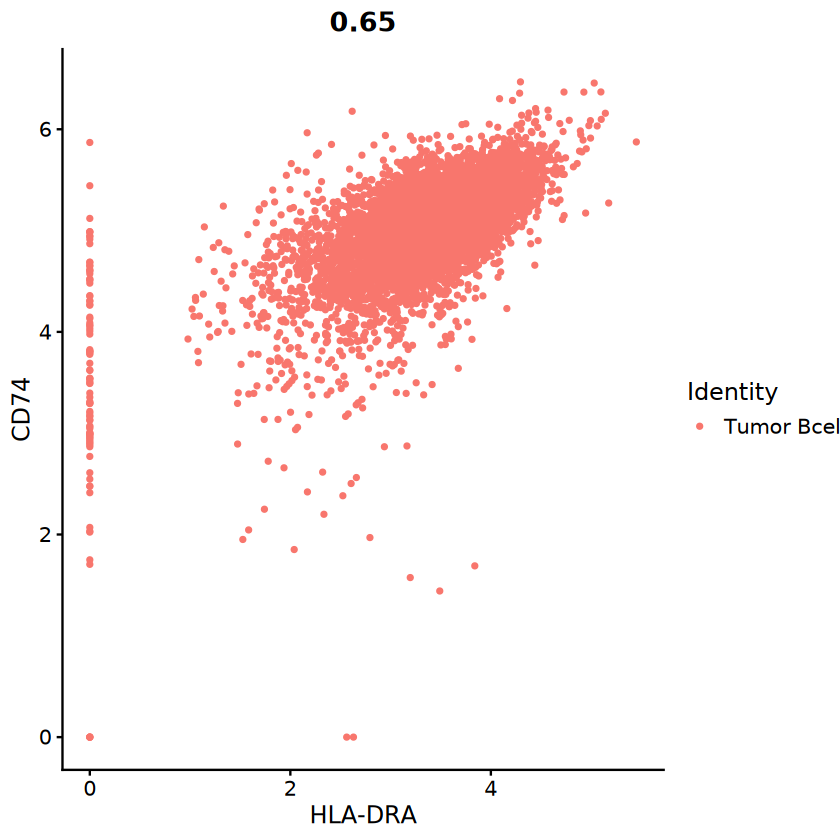

[1] "37170"


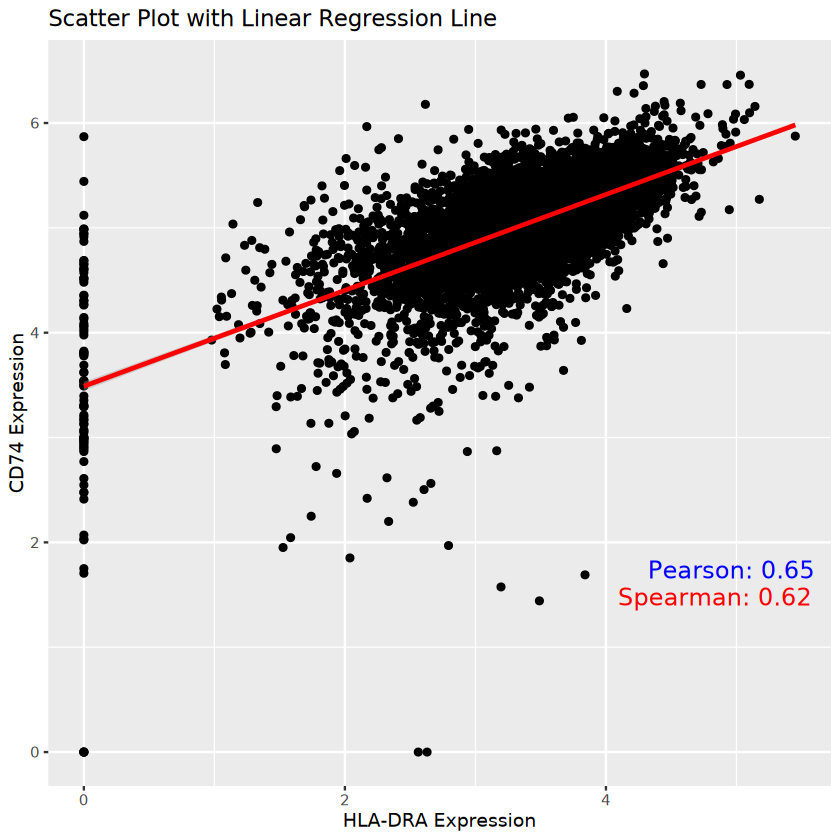

`geom_smooth()` using formula = 'y ~ x'


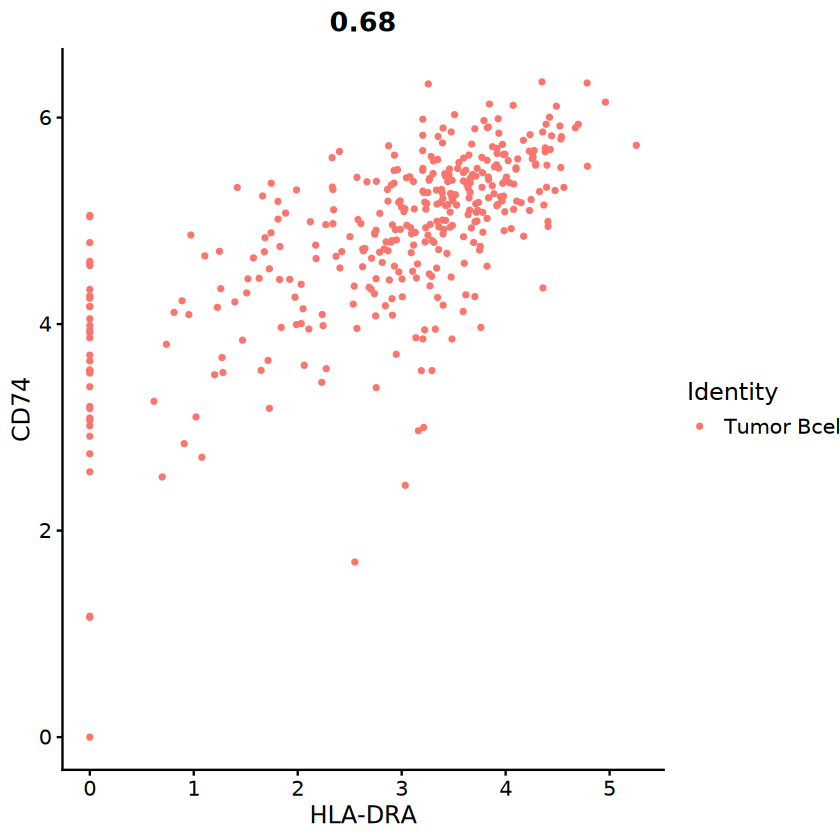

[1] "37293"


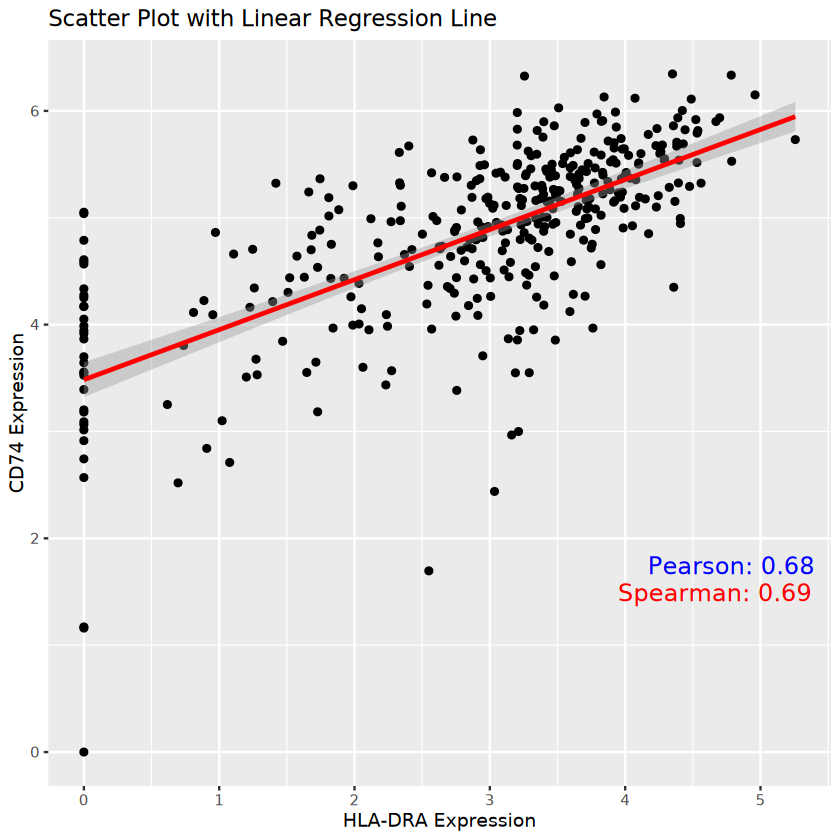

`geom_smooth()` using formula = 'y ~ x'


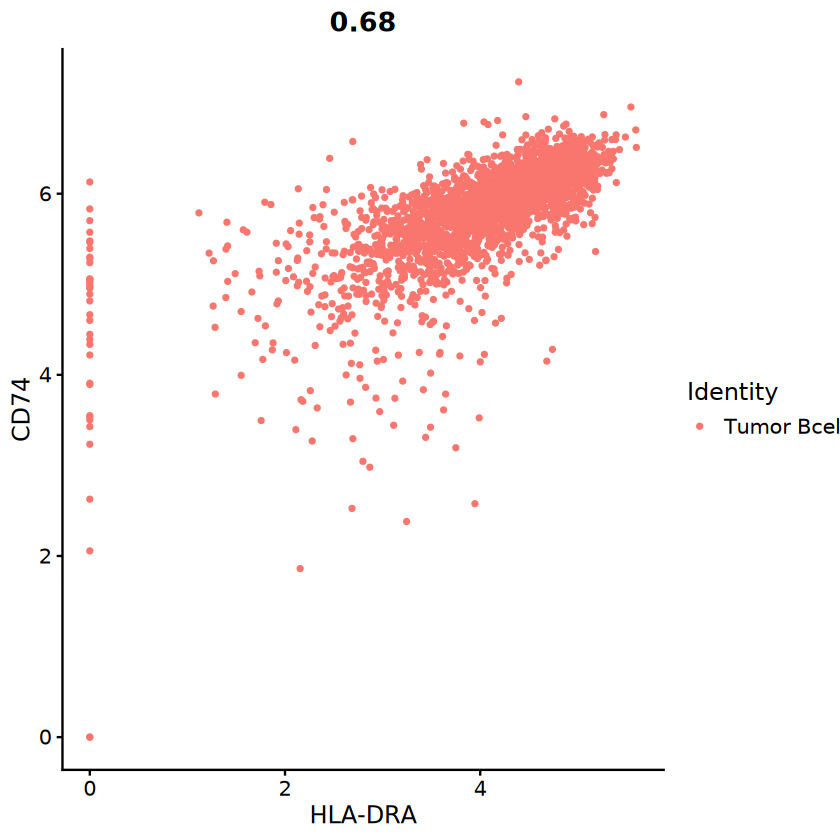

[1] "37374"


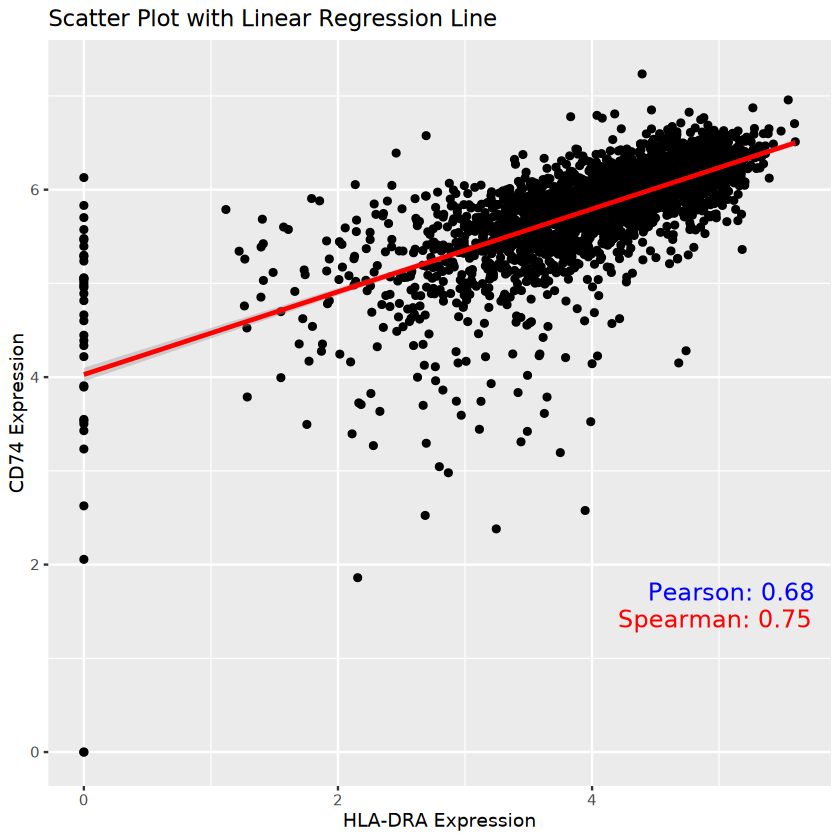

`geom_smooth()` using formula = 'y ~ x'


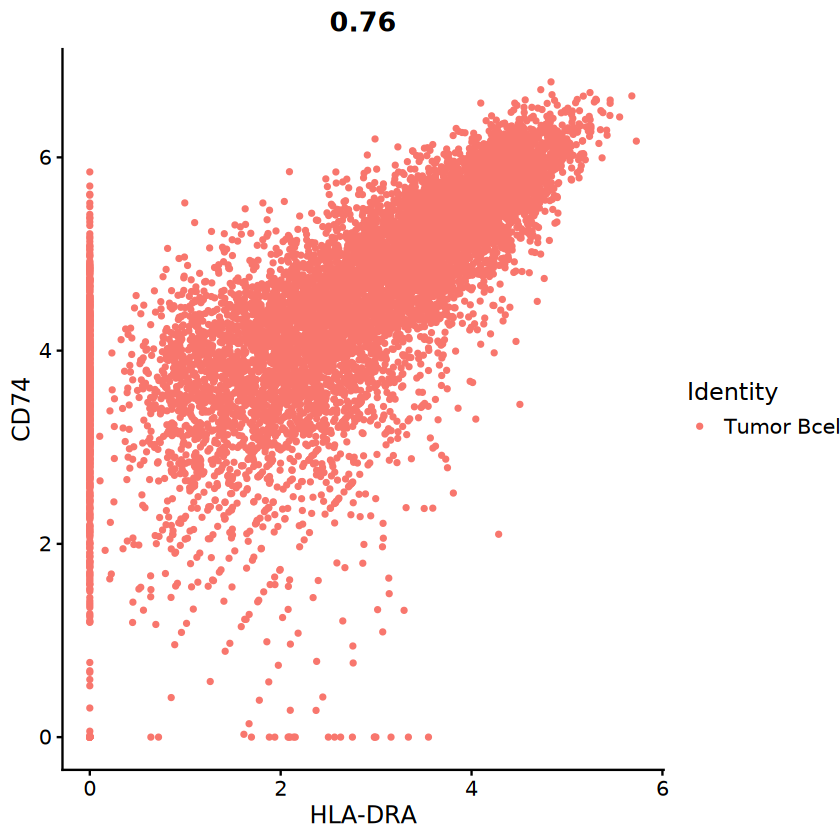

[1] "38061"


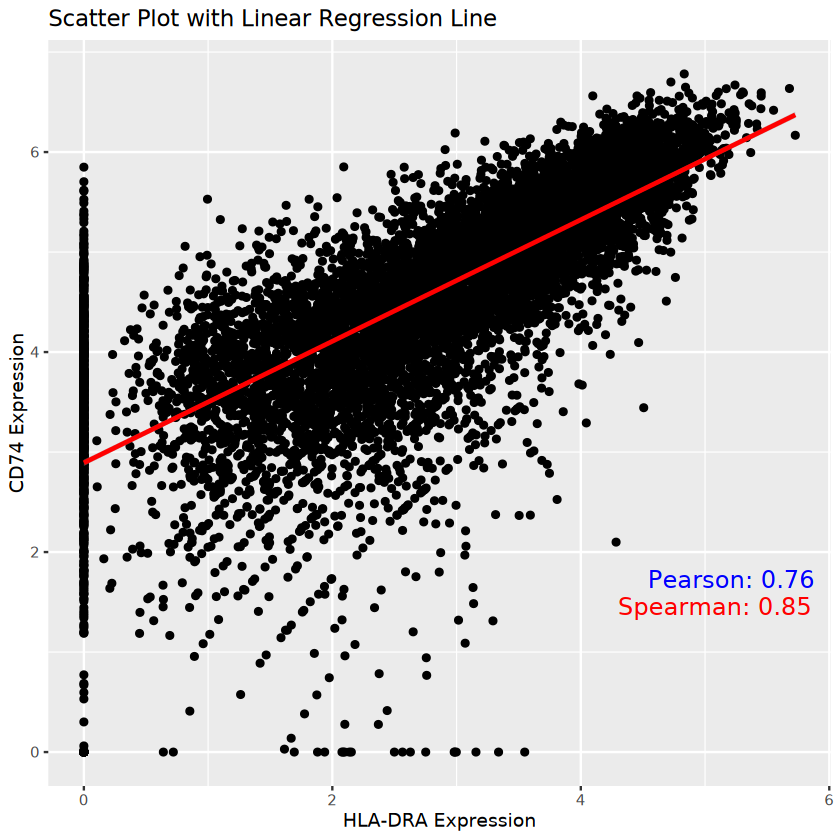

`geom_smooth()` using formula = 'y ~ x'


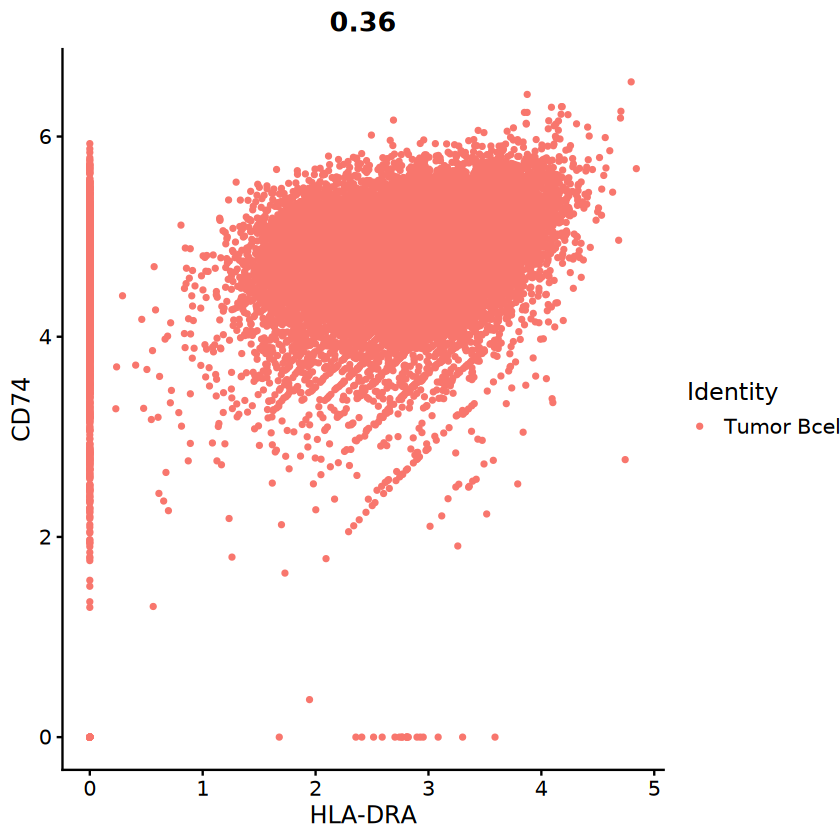

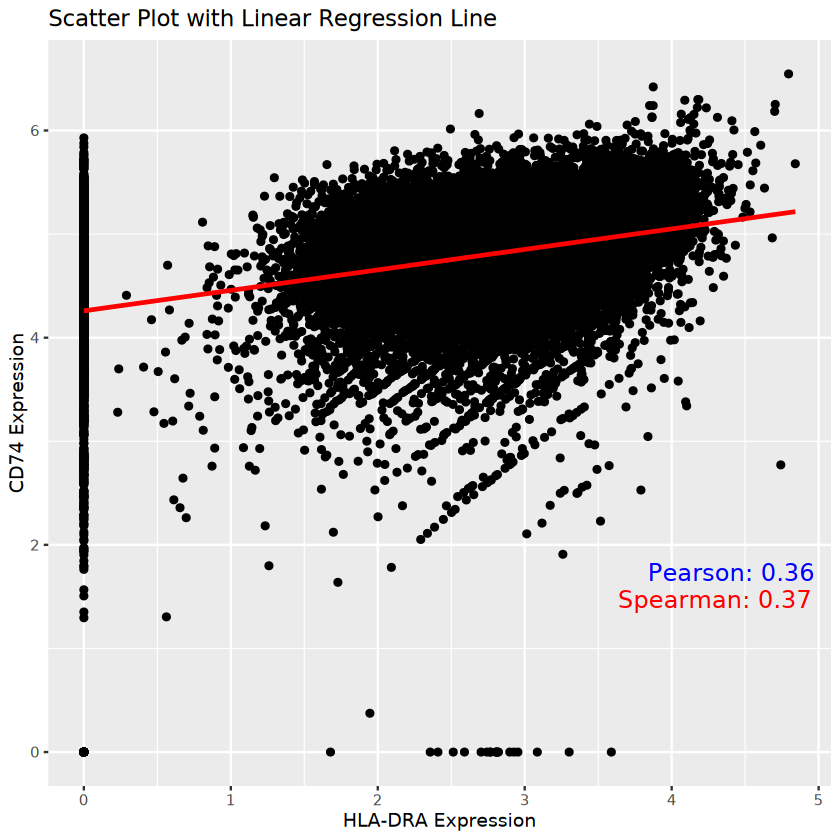

In [77]:
library(Seurat)
library(dplyr)

for(p in unique(Tbcells$patient)){
    print(p)
    Tumor1 <- subset(Tbcells, patient == p)
    test <- FeatureScatter(Tumor1, feature1 = "HLA-DRA", feature2 = "CD74") 
    print(test)
    # Assuming Tumor1 is your Seurat object
    gene1 <- FetchData(Tumor1, vars = "HLA-DRA")
    gene2 <- FetchData(Tumor1, vars = "CD74")

    # Combine the gene expression data into a data frame
    data <- data.frame(Gene1 = gene1, Gene2 = gene2)

    #Calculate Pearson and Spearman correlation values
    pearson_corr <- cor(data$HLA.DRA, data$CD74, method = "pearson")
    spearman_corr <- cor(data$HLA.DRA, data$CD74, method = "spearman")

    # Create the scatter plot with a linear regression line and correlation values
    scatter <- ggplot(data, aes(x = HLA.DRA, y = CD74)) +
    geom_point() +
    geom_smooth(method = "lm", col = "red") +
    labs(x = "HLA-DRA Expression", y = "CD74 Expression", title = "Scatter Plot with Linear Regression Line") +
    annotate("text", x = Inf, y = 2, label = paste("Pearson:", round(pearson_corr, 2)), hjust = 1.1, vjust = 2, size = 5, color = "blue") +
    annotate("text", x = Inf, y = 2, label = paste("Spearman:", round(spearman_corr, 2)), hjust = 1.1, vjust = 3.5, size = 5, color = "red")

    print(scatter)
}


In [10]:
HLA.genes <- grep("^HLA-", rownames(Tumor1), value = T)
HLA.genes

[1] "HLA-F"        "HLA-G"        "HLA-A"        "HLA-E"        "HLA-C"       
 [6] "HLA-B"        "HLA-DRA"      "HLA-DRB5"     "HLA-DRB1"     "HLA-DQA1"    
[11] "HLA-DQB1"     "HLA-DQB1-AS1" "HLA-DQA2"     "HLA-DQB2"     "HLA-DOB"     
[16] "HLA-DMB"      "HLA-DMA"      "HLA-DOA"      "HLA-DPA1"     "HLA-DPB1"